# Cell type proportion analysis
Lingting Shi, Azizi lab, Columbia University

In [2]:
from copy import deepcopy
from matplotlib import rcParams
from pathlib import Path
from scipy import stats
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests
import anndata
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import warnings

In [3]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT = Path('../..')

# Input paths
TCELL_ANN_CONCAT_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_proportion.h5ad'

# Output paths — figures
FIGURES_SC_DIR      = PROJECT_ROOT / 'Figures' / 'single_cell_figures'
TCELL_ANN_ANNOTATED_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_annotated.h5ad'

In [4]:
tcell_ann_concat = anndata.read_h5ad(TCELL_ANN_CONCAT_PATH)

In [5]:
tcell_ann_concat

AnnData object with n_obs × n_vars = 38539 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_count

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_4263/2121168280.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


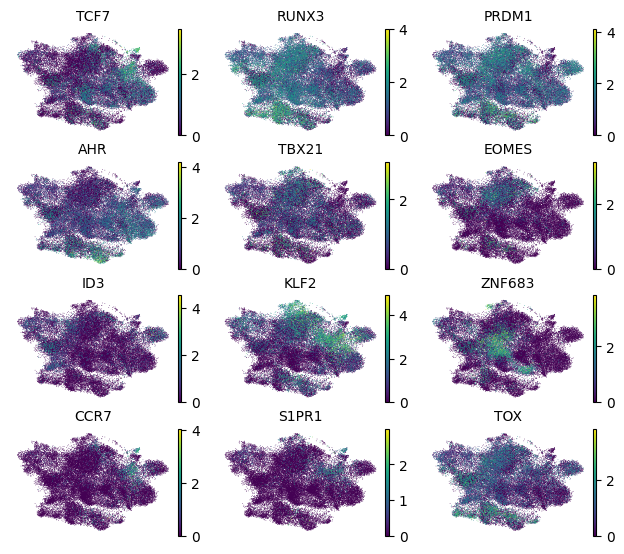

In [6]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=['TCF7','RUNX3','PRDM1','AHR','TBX21','EOMES','ID3','KLF2','ZNF683','CCR7','S1PR1','TOX'],
           ncols=3,
           show=False,
           frameon=False,
           return_fig=True,
           size=1)

fig.set_size_inches(7.5, 6)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "Hobit_TFs.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Hobit_TFs.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Hobit_TFs.svg", dpi=300, bbox_inches='tight')
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_4263/4113346056.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


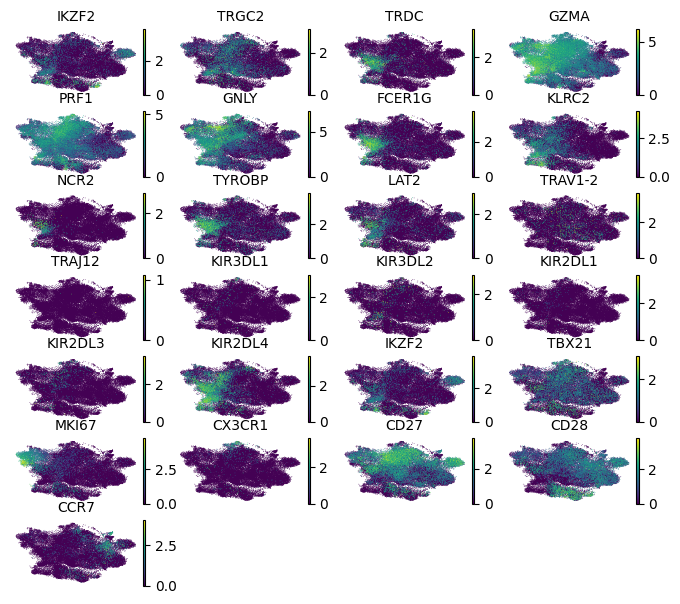

In [13]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=["IKZF2", "TRGC2", 'TRDC', 'GZMA', 'PRF1', 'GNLY', 'FCER1G', "KLRC2",'NCR2','TYROBP', 'LAT2', 'TRAV1-2', 'TRAJ12',"KIR3DL1", "KIR3DL2", "KIR2DL1", "KIR2DL3", "KIR2DL4", "IKZF2", "TBX21", "MKI67", "CX3CR1", "CD27", "CD28", "CCR7"],
           ncols=4,
           show=False,
           frameon=False,
           return_fig=True,
           size=1)

fig.set_size_inches(8, 6.5)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "unconventional_genes.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "unconventional_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "unconventional_genes.svg", dpi=300, bbox_inches='tight')
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_32453/994668143.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


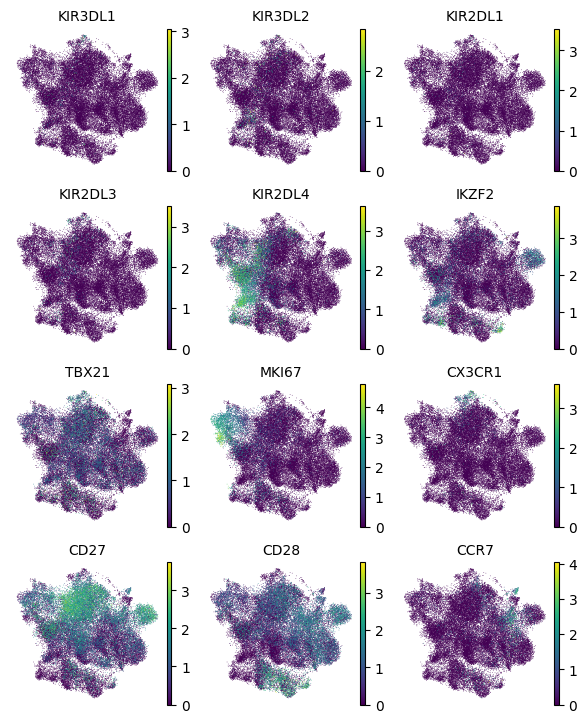

In [13]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
genes_core = ["KIR3DL1", "KIR3DL2", "KIR2DL1", "KIR2DL3", "KIR2DL4", "IKZF2", "TBX21", "MKI67", "CX3CR1", "CD27", "CD28", "CCR7"]
fig = sc.pl.umap(tcell_ann_concat, 
           color=genes_core,
           ncols=3,
           show=False,
           frameon=False,
           return_fig=True,
           size=1)

fig.set_size_inches(7, 8)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "KIR_genes.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "KIR_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "KIR_genes.svg", dpi=300, bbox_inches='tight')
plt.show()



/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_32453/3036073897.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


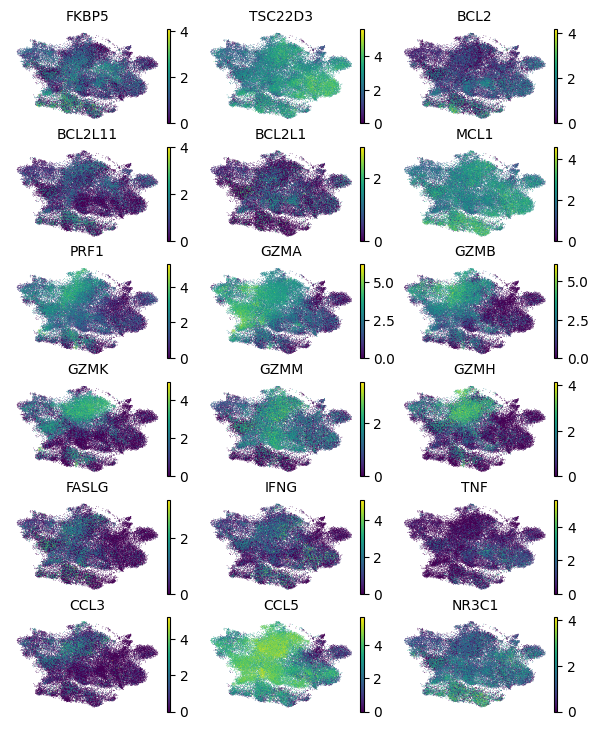

In [14]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=['FKBP5', 'TSC22D3', 'BCL2', 'BCL2L11', 'BCL2L1', 'MCL1', 'PRF1', 'GZMA', 'GZMB',
                  'GZMK', 'GZMM', 'GZMH', 'FASLG', 'IFNG', 'TNF', 'CCL3', 'CCL5', 'NR3C1'],
           ncols=3,
           show=False,
           frameon=False,
           return_fig=True,
           size=1)

fig.set_size_inches(7, 8)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "cytotoxic_genes.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "cytotoxic_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "cytotoxic_genes.svg", dpi=300, bbox_inches='tight')
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_32453/1997905532.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


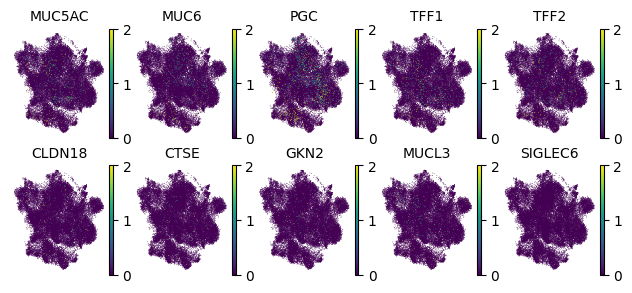

In [15]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=['MUC5AC', 'MUC6', 'PGC', 'TFF1', 'TFF2', 'CLDN18', 'CTSE', 'GKN2', 'MUCL3', 'SIGLEC6'],
           ncols=5,
           show=False,
           frameon=False,
           vmin=0,
           vmax=2,
           return_fig=True,
           size=1)

fig.set_size_inches(7.5, 3)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "Tcell_epi_overlap.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Tcell_epi_overlap.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Tcell_epi_overlap.svg", dpi=300, bbox_inches='tight')
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_32453/2339634717.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


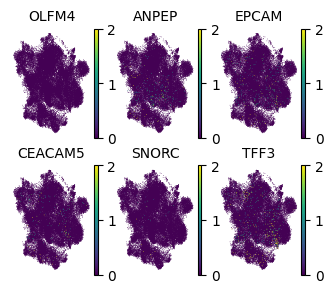

In [16]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=['OLFM4', 'ANPEP', 'EPCAM', 'CEACAM5', 'SNORC', 'TFF3'],
           ncols=3,
           show=False,
           frameon=False,
           vmin=0,
           vmax=2,
           return_fig=True,
           size=1)

fig.set_size_inches(3.75, 3)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "Tcell_ins_epi_overlap.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Tcell_ins_epi_overlap.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "Tcell_ins_epi_overlap.svg", dpi=300, bbox_inches='tight')
plt.show()

In [17]:
sorter = ['ND001_ND','ND003_ND','C66_No','R085_No','C162_No','C160_No','C155_No','C160_Mild','C157_Mild','C179_Mild','C101_Mild','C162_Mild','C159_Severe','C152_Severe','C068_Severe','C98_Severe','C66_Severe']

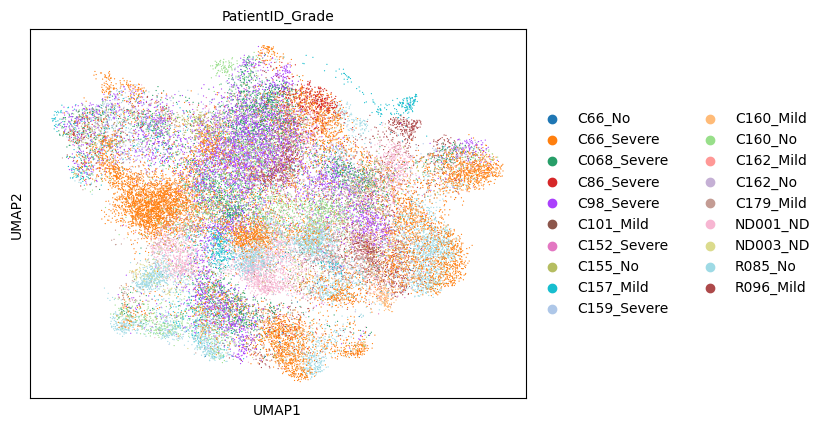

In [18]:
tcell_ann_concat.obs['PatientID_Grade'] = tcell_ann_concat.obs['PatientID'].astype(str)+'_'+tcell_ann_concat.obs['GVHD_Grade_1'].astype(str)

sc.pl.umap(tcell_ann_concat, color=['PatientID_Grade'],ncols=2)

In [19]:
key = "T_cell_subsets"

cell_order = [
    "CD8+ effector T cells",
    "CD4+ effector T cells",
    "CD8+ tissue resident memory T cells",
    "CD4+ central memory T cells",
    "CD8+ cytotoxic unconventional T cells",
    "Low CD3",
    "CD8+ proliferating T cells",
    "CD4+ regulatory T cells",
    "CD8+ homeostatic unconventional T cells",
]

tcell_ann_concat.obs[key] = tcell_ann_concat.obs[key].cat.reorder_categories(cell_order, ordered=True)

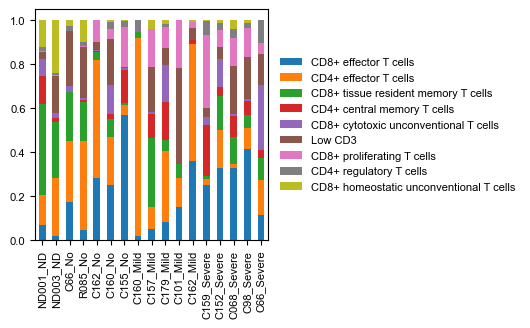

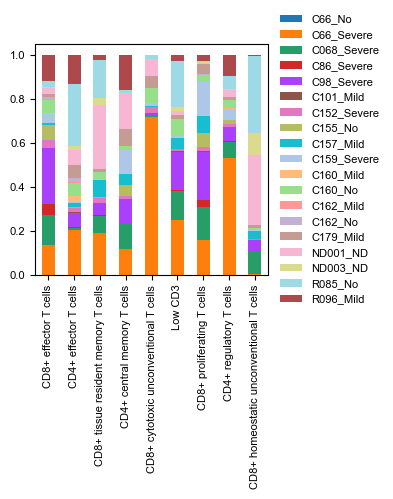

In [20]:
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3),
    'lines.linewidth': 1
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8

celltype_colors = {
    "CD8+ effector T cells": "#1f77b4",
    "CD8+ cytotoxic unconventional T cells": "#9467bd",
    "CD8+ tissue resident memory T cells": "#2ca02c",
    "CD8+ homeostatic unconventional T cells": "#bcbd22",
    "CD8+ proliferating T cells": "#e377c2",
    "CD4+ effector T cells": "#ff7f0e",
    "CD4+ central memory T cells": "#d62728",
    "CD4+ regulatory T cells": "#7f7f7f",
    "Low CD3": "#8c564b",
}

obs_1 = 'PatientID_Grade'
obs_2 = 'T_cell_subsets'

n_categories = {x: len(tcell_ann_concat.obs[x].cat.categories) for x in [obs_1, obs_2]}
df = tcell_ann_concat.obs[[obs_2, obs_1]].values
obs2_clusters = tcell_ann_concat.obs[obs_2].cat.categories.tolist()
obs1_clusters = tcell_ann_concat.obs[obs_1].cat.categories.tolist()

obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}

for b, l in df:
    obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
    obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))

for i, k in enumerate(obs2_clusters):
    obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
for i, k in enumerate(obs1_clusters):
    obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

# Normalize obs2_to_obs1_array by column
sums = np.sum(obs2_to_obs1_array, 0)
for col in range(np.size(obs2_to_obs1_array, 1)):
    for row in range(np.size(obs2_to_obs1_array, 0)):
        obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

# Normalize obs1_to_obs2_array by column
sums2 = np.sum(obs1_to_obs2_array, 0)
for col in range(np.size(obs1_to_obs2_array, 1)):
    for row in range(np.size(obs1_to_obs2_array, 0)):
        obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

# --- Plot 1: T cell subset composition per PatientID_Grade ---
tcell_colors = [celltype_colors[c] for c in obs2_clusters]

df_obs2 = pd.DataFrame(obs2_to_obs1_array)
df_obs2.index = obs2_clusters
df_obs2.columns = obs1_clusters
df_obs2 = df_obs2.reindex(columns=sorter)

df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors, edgecolor='none')
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left', frameon=False)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

# --- Plot 2: PatientID_Grade composition per T cell subset ---
df_obs1 = pd.DataFrame(obs1_to_obs2_array)
df_obs1.index = obs1_clusters
df_obs1.columns = obs2_clusters

df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_1 + '_colors'], edgecolor='none')
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left', frameon=False)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot_2.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot_2.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'cell_type_bar_plot_2.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

<Axes: title={'center': 'T_cell_subsets'}, xlabel='UMAP1', ylabel='UMAP2'>

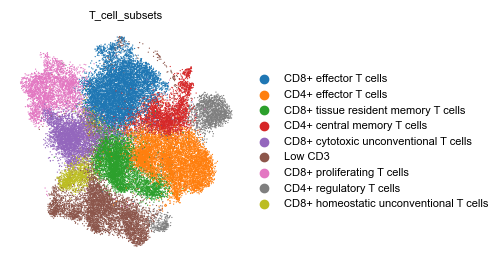

In [21]:
col = "T_cell_subsets"
adata = tcell_ann_concat

# Make sure it's categorical (and optionally set category order)
adata.obs[col] = adata.obs[col].astype("category")

# Ensure colors exist for every category present
cats = list(adata.obs[col].cat.categories)
missing = [c for c in cats if c not in celltype_colors]
if missing:
    raise ValueError(f"Missing colors for these categories in {col}: {missing}")

# Store colors in AnnData the way Scanpy expects: <col>_colors aligned to categories
adata.uns[f"{col}_colors"] = [celltype_colors[c] for c in cats]

# Plot
sc.pl.umap(adata, color=[col], frameon=False, show=False)

In [22]:
sns.set_style('white')

font_list = []
fpaths = mpl.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = mpl.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Arial'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 15})
rcParams.update({'figure.dpi': 300})
rcParams.update({'figure.figsize': (4, 4)})
rcParams.update({'savefig.dpi': 300})

warnings.filterwarnings('ignore')

In [23]:
tcell_ann_concat.obs['SampleID_Grade'] = (
    tcell_ann_concat.obs['SampleID'].astype(str) + '_' +
    tcell_ann_concat.obs['GVHD_Grade_1'].astype(str)
).astype('category')

In [24]:
# Combine 'ND' with 'No' in GVHD_Grade
tcell_ann_concat.obs['GVHD_Grade'] = tcell_ann_concat.obs['GVHD_Grade_1'].replace('ND', 'No')

In [25]:
df = pd.DataFrame({
    'cell_type': tcell_ann_concat.obs['T_cell_subsets_plot'],
    'grade': tcell_ann_concat.obs['GVHD_Grade'],
    'sample': tcell_ann_concat.obs['SampleID']
})

# Calculate percentages per sample
sample_percentages = pd.crosstab(
    [df['sample'], df['grade']], 
    df['cell_type'], 
    normalize='index'
) * 100

In [26]:
median_percentages = sample_percentages.groupby(level='grade').median()
median_percentages.T
df_obs2 = median_percentages.T
df_obs2

grade,Mild,No,Severe
cell_type,,,
CD8+ effector T cells,8.510638,13.904494,28.524559
CD4+ effector T cells,31.914894,24.183583,4.543468
CD8+ tissue resident \nmemory T cells,4.605263,14.673913,4.030571
CD4+ \ncentral memory T cells,5.319149,1.458080,4.709618
CD8+ cytotoxic \nunconventional T cells,0.306905,2.015209,1.956854
Low CD3,9.313725,16.153846,10.865290
CD8+ \nproliferating T cells,9.068627,0.974930,10.436035
CD4+ \nregulatory T cells,0.980392,0.570342,3.515825
CD8+ homeostatic \nunconventional T cells,0.838574,0.943396,0.243789


In [27]:
normalized_data = df_obs2 / df_obs2.sum(axis=0)
df_obs2 = normalized_data 

# Figure 4G

Sum of No before closing the polygon: 1.0
Sum of Mild before closing the polygon: 1.0000000000000002
Sum of Severe before closing the polygon: 1.0000000000000002


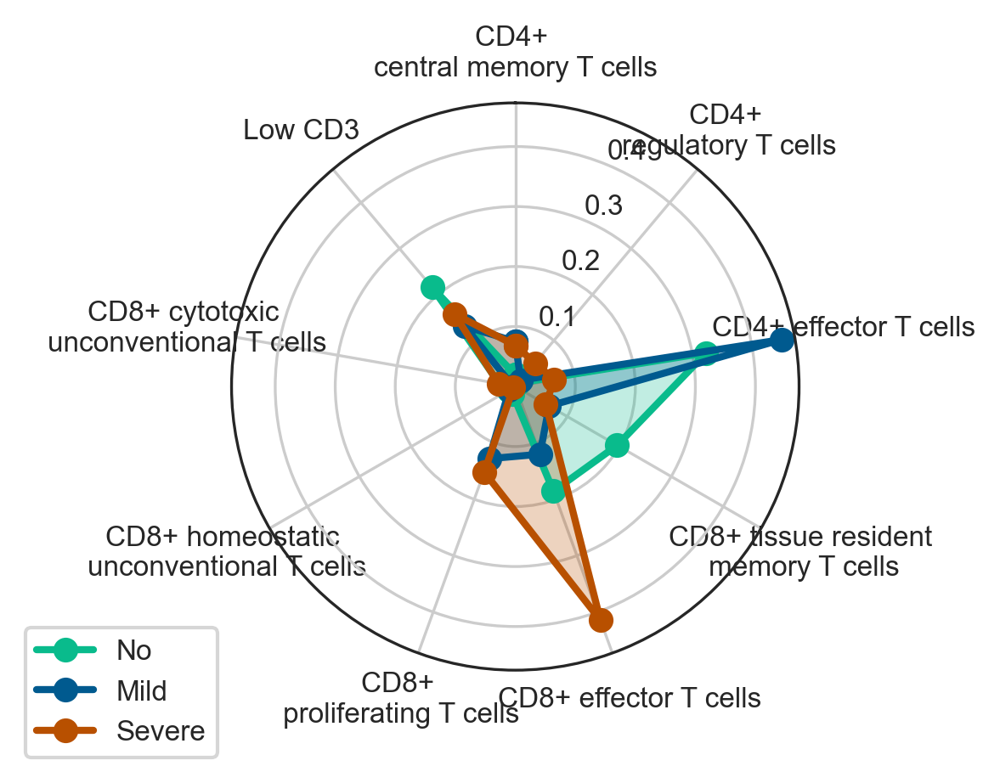

In [28]:
mpl.rcParams.update({
    'font.size': 10,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8
mpl.rcParams['legend.fontsize'] = 8

def create_radar_plot(df, title="T Cell Subset Distribution"):
    ordered_cell_types = [
        'CD4+ \ncentral memory T cells',
        'CD4+ \nregulatory T cells',
        'CD4+ effector T cells',
        'CD8+ tissue resident \nmemory T cells',
        'CD8+ effector T cells',
        'CD8+ \nproliferating T cells',
        'CD8+ homeostatic \nunconventional T cells',
        'CD8+ cytotoxic \nunconventional T cells',
        'Low CD3',
    ]

    grade_order = ['No', 'Mild', 'Severe']
    df = df.reindex(ordered_cell_types)
    df = df[grade_order]

    categories = df.index.tolist()
    num_vars = len(categories)
    angles = [n / float(num_vars) * 2 * np.pi for n in range(num_vars)]
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(4, 4), subplot_kw=dict(projection='polar'))

    colors = {'No': '#09BB8C', 'Mild': '#005A8F', 'Severe': '#B85000'}
    alphas = {'No': 0.25, 'Mild': 0.25, 'Severe': 0.25}

    for column in df.columns:
        values = df[column].values.tolist()
        print(f"Sum of {column} before closing the polygon: {np.sum(values)}")
        values += values[:1]
        ax.plot(angles, values, 'o-', linewidth=2, label=column, color=colors[column])
        ax.fill(angles, values, alpha=alphas[column], color=colors[column])

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.grid(True)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)
    ax.legend(loc='upper right', bbox_to_anchor=(0, 0.1))

    return fig

fig = create_radar_plot(df_obs2)
plt.tight_layout()
plt.savefig(FIGURES_SC_DIR / 'radar_plot_median.pdf', bbox_inches='tight', dpi=300, transparent=True)
plt.savefig(FIGURES_SC_DIR / 'radar_plot_median.png', bbox_inches='tight', dpi=300, transparent=True)
plt.savefig(FIGURES_SC_DIR / 'radar_plot_median.svg', bbox_inches='tight', dpi=300, transparent=True)
plt.show()

In [29]:
# Rename back to clean labels (no line breaks) so ef2e766a boxplot filenames are valid
new_cluster_names = [
    'CD8+ effector T cells',
    'CD4+ effector T cells',
    'CD8+ tissue resident memory T cells',
    'CD4+ central memory T cells',
    'CD8+ cytotoxic unconventional T cells',
    'Low CD3',
    'CD8+ proliferating T cells',
    'CD4+ regulatory T cells',
    'CD8+ homeostatic unconventional T cells',
]
tcell_ann_concat.rename_categories('T_cell_subsets', new_cluster_names)

Omitting rank_genes_groups/logfoldchanges as old categories do not match.
Omitting rank_genes_groups/names as old categories do not match.
Omitting rank_genes_groups/pvals as old categories do not match.
Omitting rank_genes_groups/pvals_adj as old categories do not match.
Omitting rank_genes_groups/scores as old categories do not match.


In [30]:
###### Filter out samples with low cell count
# Calculate cell counts per sample
cell_counts = tcell_ann_concat.obs['SampleID'].value_counts()

# Get samples with at least 100 cells
valid_samples = cell_counts[cell_counts >= 100].index

# Subset AnnData to retain only valid samples
tcell_ann_concat_f = tcell_ann_concat[tcell_ann_concat.obs['SampleID'].isin(valid_samples), :]

# Verify filtering
print(f"Remaining samples: {tcell_ann_concat_f.obs['SampleID'].nunique()}")
print(f"Remaining cells: {tcell_ann_concat_f.n_obs}")

Remaining samples: 38
Remaining cells: 38050


# Figure 4

<Axes: title={'center': 'SampleID_Grade'}, xlabel='UMAP1', ylabel='UMAP2'>

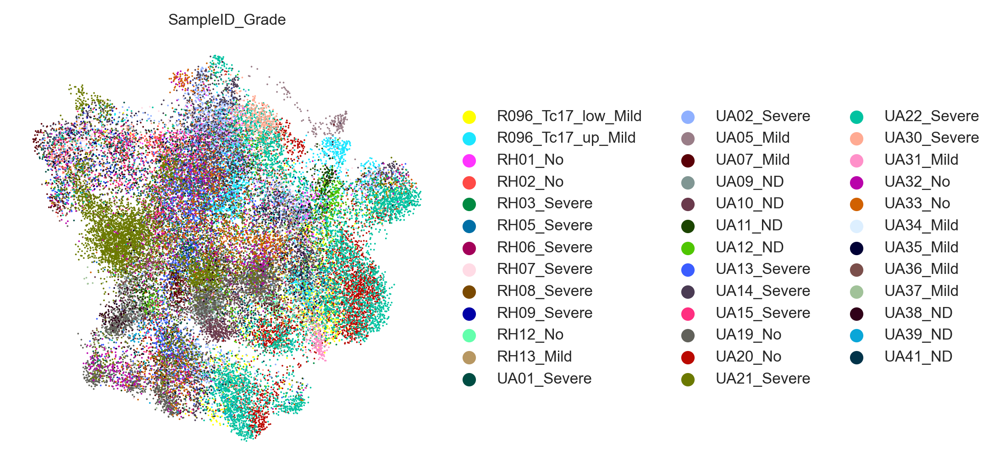

In [31]:

sc.pl.umap(tcell_ann_concat_f, color=['SampleID_Grade'], frameon=False, show=False)

<Axes: title={'center': 'T_cell_subsets'}, xlabel='UMAP1', ylabel='UMAP2'>

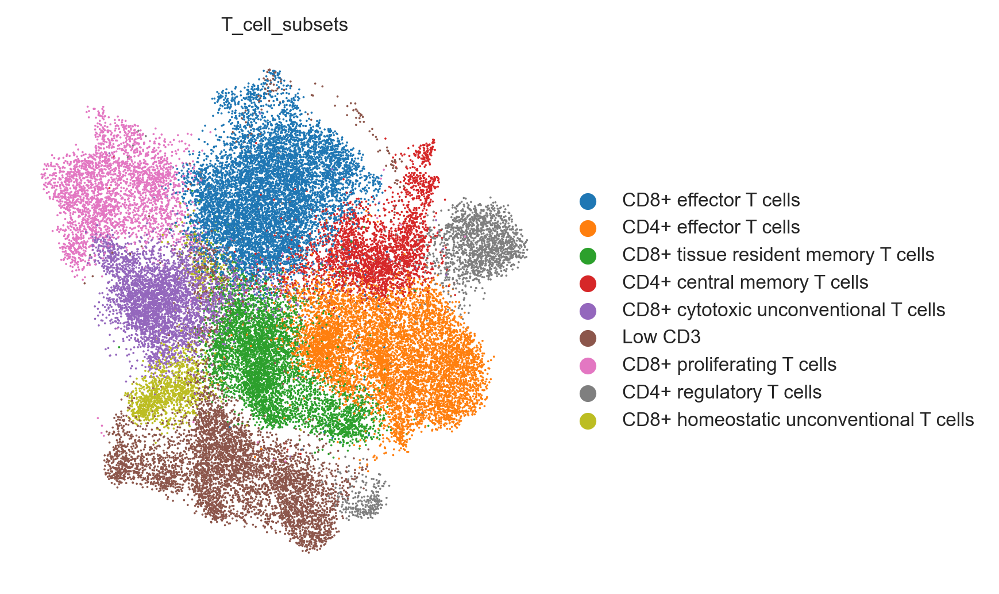

In [32]:

sc.pl.umap(tcell_ann_concat_f, color=['T_cell_subsets'], frameon=False, show=False)

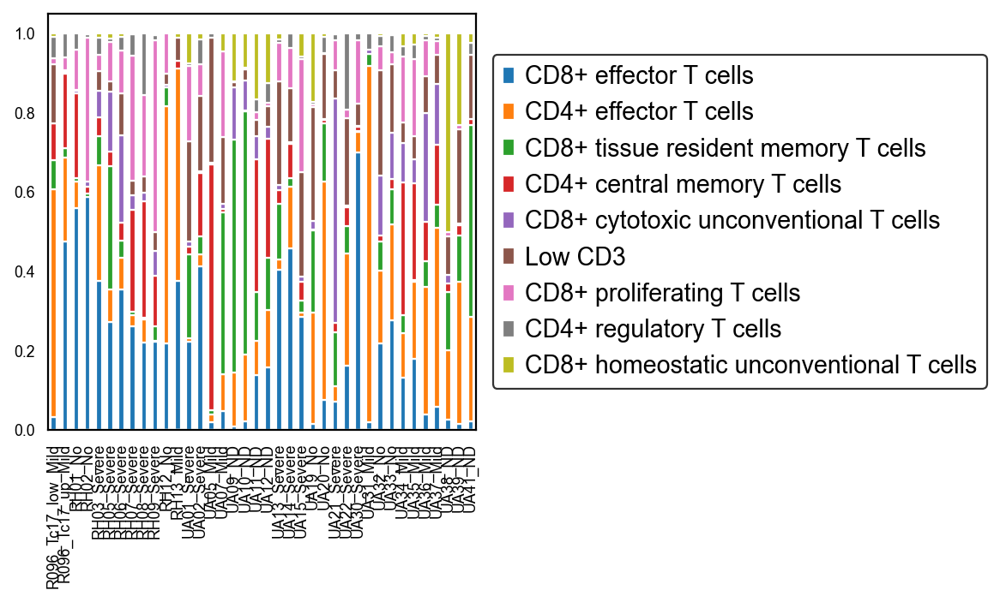

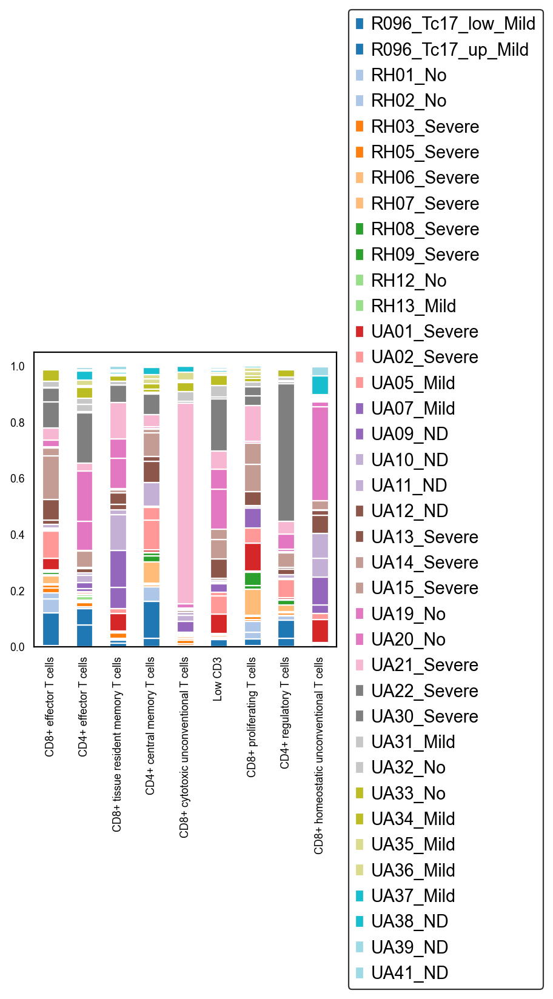

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:2.701e-01
mild vs. severe: Custom statistical test, P_val:3.959e-01
no vs. severe: Custom statistical test, P_val:9.783e-02
Raw p-values: [0.1350640021327316, 0.03260941743471599, 0.3958628946276468]
Holm-corrected p-values: [0.270128   0.09782825 0.39586289]
('no', 'mild'): corrected p = 0.270128 (not significant)
('no', 'severe'): corrected p = 0.097828 (not significant)
('mild', 'severe'): corrected p = 0.395863 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


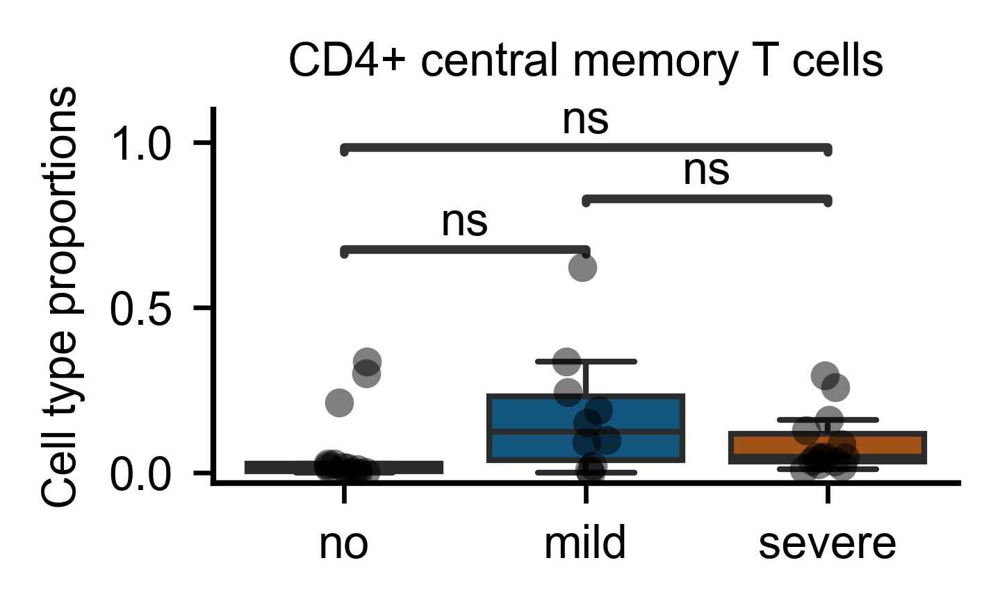

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:2.473e-02
no vs. severe: Custom statistical test, P_val:2.473e-02
Raw p-values: [1.0, 0.008242009906200226, 0.009169925647053616]
Holm-corrected p-values: [1.         0.02472603 0.02472603]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 0.024726 (significant)
('mild', 'severe'): corrected p = 0.024726 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


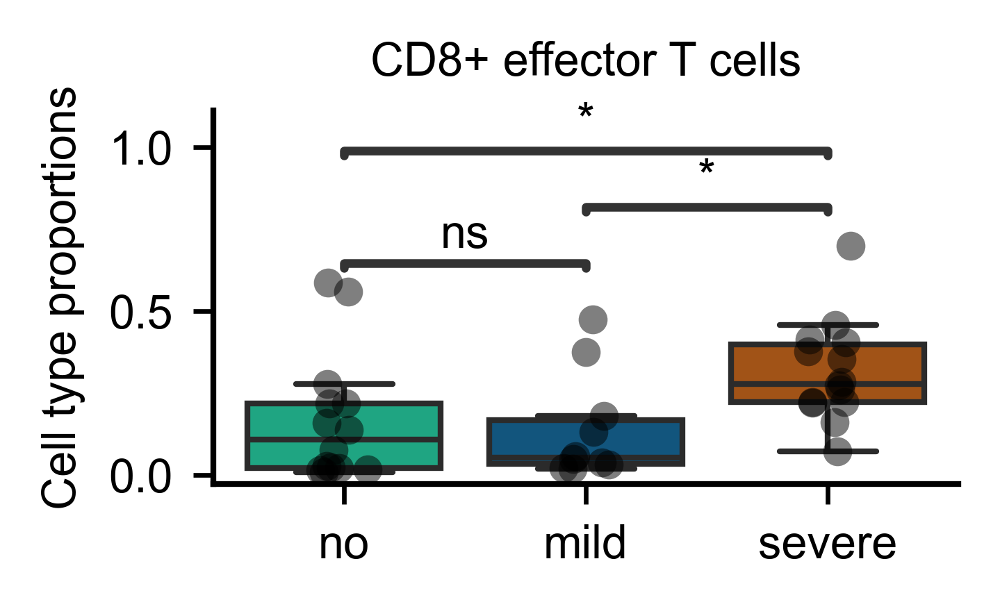

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.959e-01
mild vs. severe: Custom statistical test, P_val:1.354e-02
no vs. severe: Custom statistical test, P_val:1.648e-02
Raw p-values: [0.3958628946276468, 0.008242009906200226, 0.0045132033540006096]
Holm-corrected p-values: [0.39586289 0.01648402 0.01353961]
('no', 'mild'): corrected p = 0.395863 (not significant)
('no', 'severe'): corrected p = 0.016484 (significant)
('mild', 'severe'): corrected p = 0.013540 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


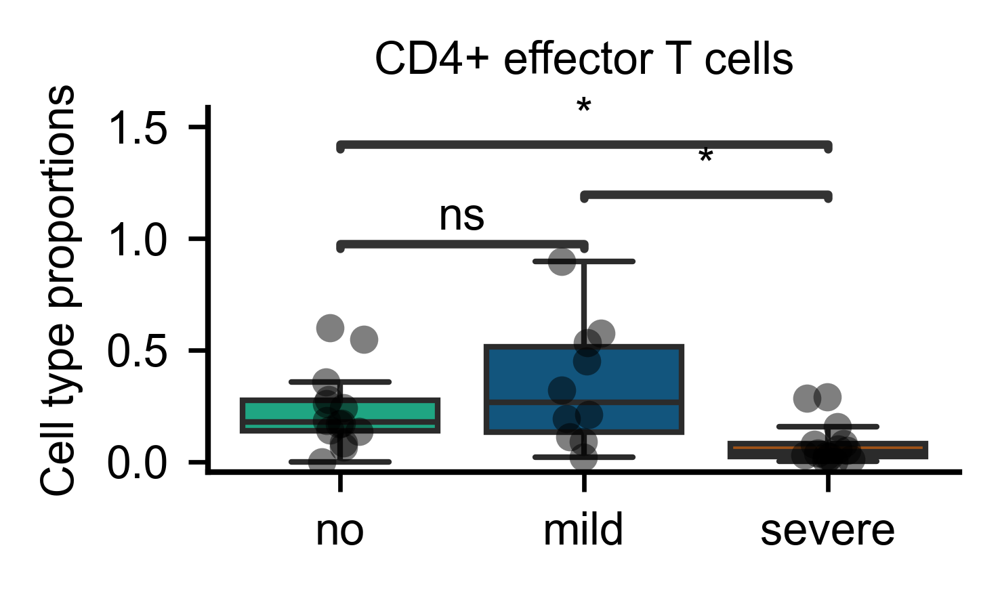

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:5.974e-01
mild vs. severe: Custom statistical test, P_val:9.923e-02
no vs. severe: Custom statistical test, P_val:4.219e-03
Raw p-values: [0.5974053550045694, 0.001406256754328124, 0.04961514870825212]
Holm-corrected p-values: [0.59740536 0.00421877 0.0992303 ]
('no', 'mild'): corrected p = 0.597405 (not significant)
('no', 'severe'): corrected p = 0.004219 (significant)
('mild', 'severe'): corrected p = 0.099230 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


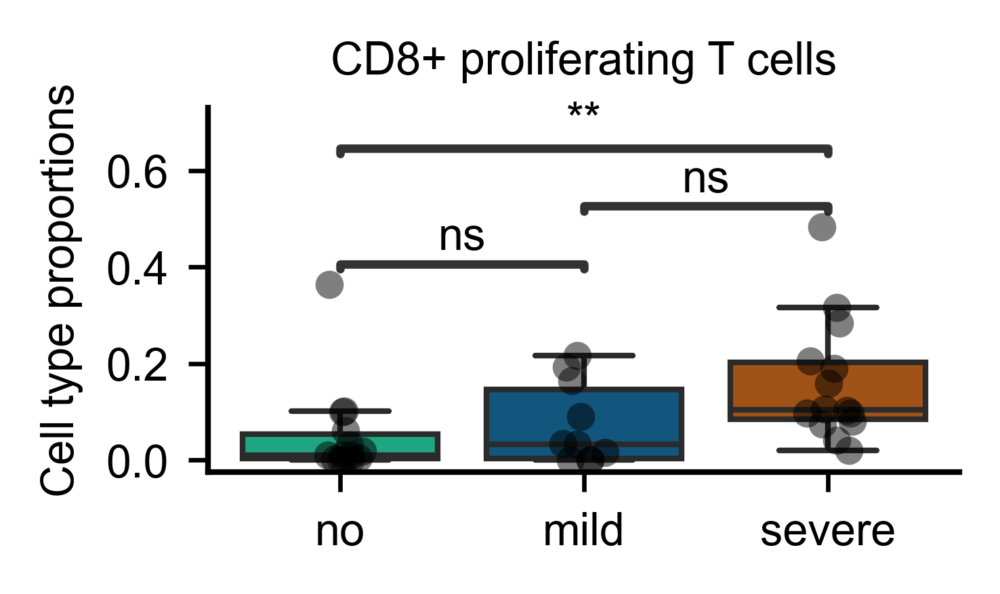

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:9.977e-01
mild vs. severe: Custom statistical test, P_val:9.977e-01
no vs. severe: Custom statistical test, P_val:2.081e-01
Raw p-values: [0.4988387772246762, 0.06938148282440888, 0.5006181299733854]
Holm-corrected p-values: [0.99767755 0.20814445 0.99767755]
('no', 'mild'): corrected p = 0.997678 (not significant)
('no', 'severe'): corrected p = 0.208144 (not significant)
('mild', 'severe'): corrected p = 0.997678 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


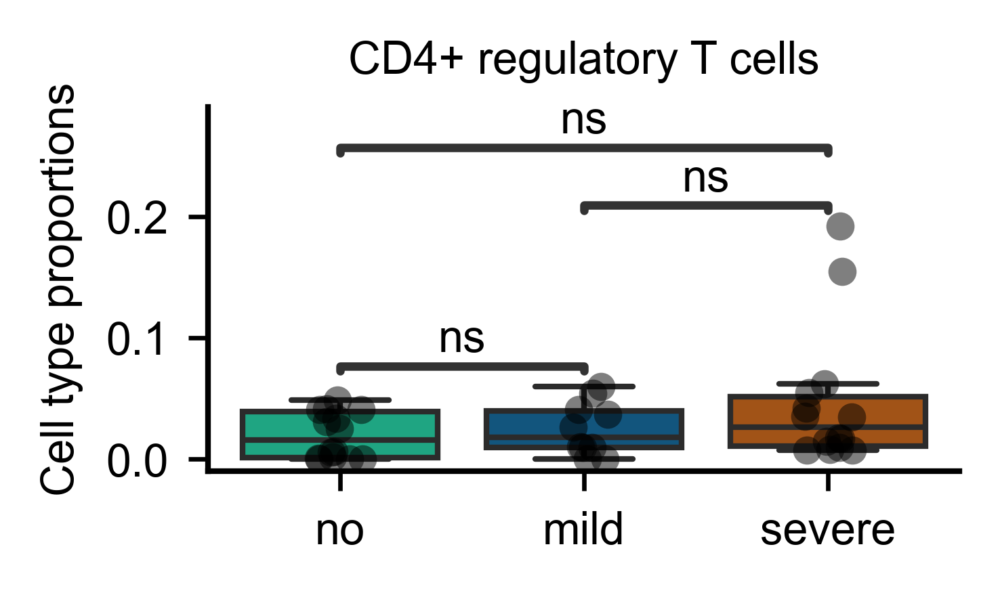

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.530e-02
mild vs. severe: Custom statistical test, P_val:5.780e-01
no vs. severe: Custom statistical test, P_val:1.017e-01
Raw p-values: [0.015099190199248972, 0.050846095833897834, 0.5780310485673851]
Holm-corrected p-values: [0.04529757 0.10169219 0.57803105]
('no', 'mild'): corrected p = 0.045298 (significant)
('no', 'severe'): corrected p = 0.101692 (not significant)
('mild', 'severe'): corrected p = 0.578031 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


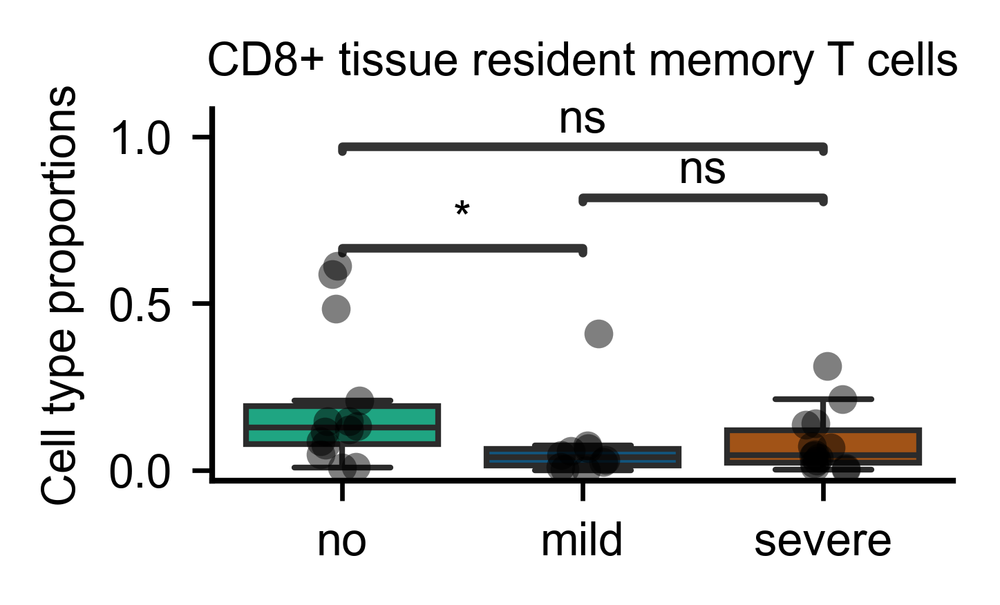

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00
Raw p-values: [1.0, 0.47634772226738475, 0.7034993180411209]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


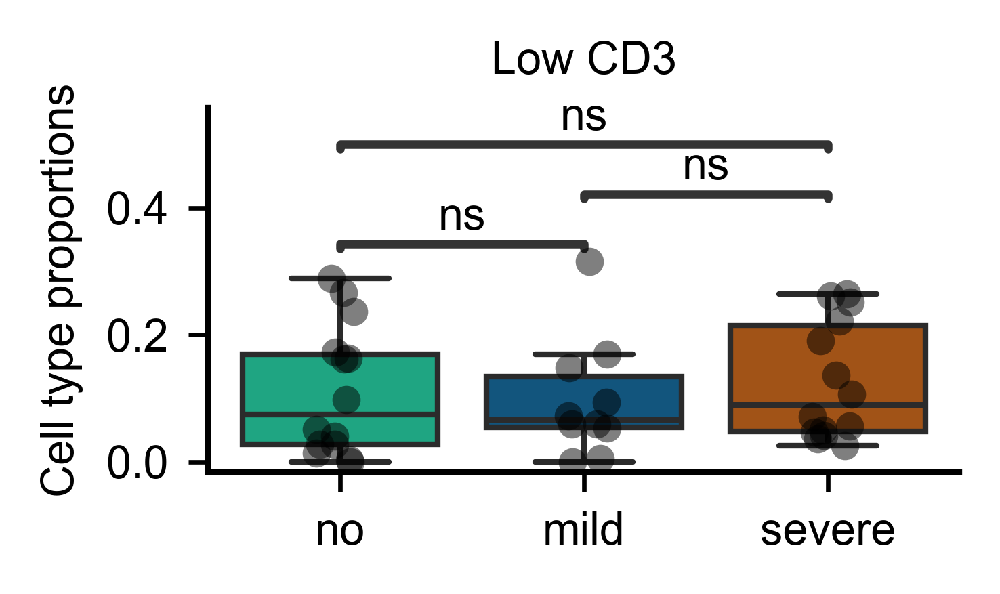

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00
Raw p-values: [0.7696492768668107, 0.8004905884098723, 0.5007112613753855]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


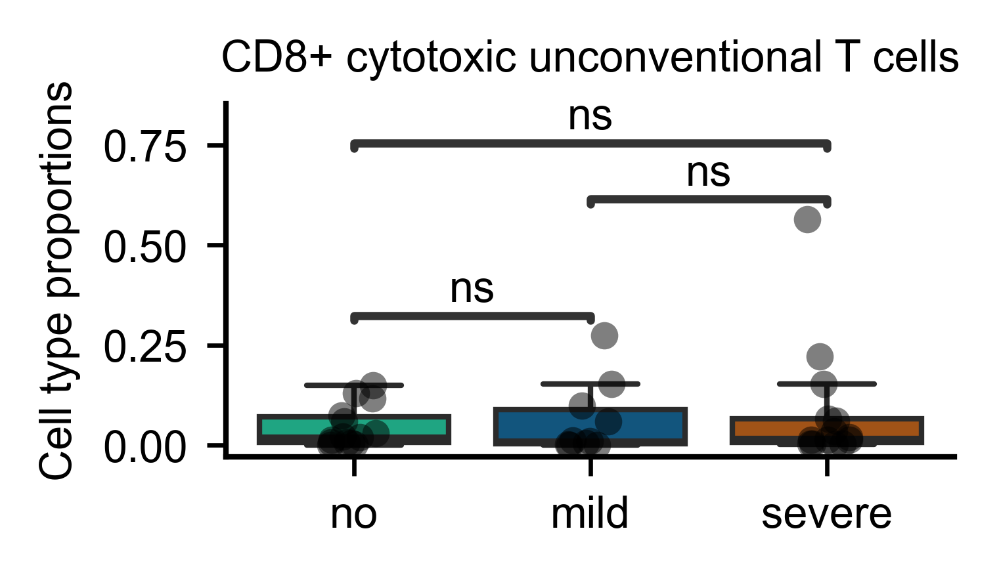

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.734e-01
mild vs. severe: Custom statistical test, P_val:9.297e-01
no vs. severe: Custom statistical test, P_val:1.506e-01
Raw p-values: [0.1867220180740653, 0.050213275503576286, 0.9297054862090365]
Holm-corrected p-values: [0.37344404 0.15063983 0.92970549]
('no', 'mild'): corrected p = 0.373444 (not significant)
('no', 'severe'): corrected p = 0.150640 (not significant)
('mild', 'severe'): corrected p = 0.929705 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


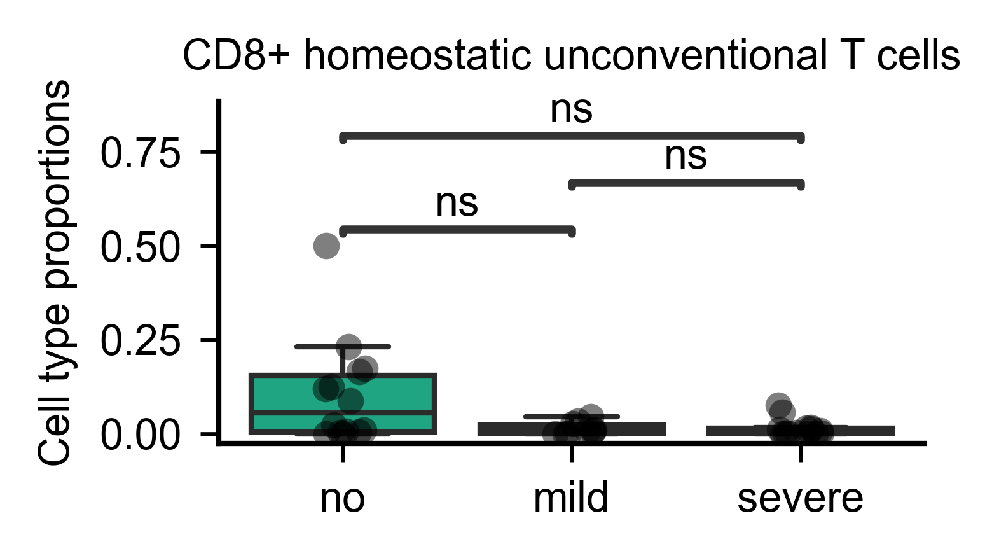

In [33]:
sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1
mpl.rcParams['axes.grid'] = False
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8

obs_1 = 'SampleID_Grade'
obs_2 = 'T_cell_subsets'

for adata in [tcell_ann_concat_f]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    # Generate colors for T_cell_subsets and SampleID_Grade
    tcell_colors = [celltype_colors[c] for c in obs2_clusters]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    for cell_type in adata.obs['T_cell_subsets'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[cell_type].values[~np.isnan(selected_columns_severe.loc[cell_type].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[cell_type].values[~np.isnan(selected_columns_mild.loc[cell_type].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[cell_type].values[~np.isnan(selected_columns_no.loc[cell_type].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[cell_type].values[~np.isnan(selected_columns_treated.loc[cell_type].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[cell_type].values[~np.isnan(selected_columns_nd.loc[cell_type].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(cell_type)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate plot using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value', order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        ax.spines[['right', 'top']].set_visible(False)
        plt.tight_layout()

        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        cell_type_safe = cell_type.replace(' ', '_').replace('+', 'pos').replace('/', '-')
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.png', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.pdf', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.svg', dpi=300, transparent=True)
        plt.show()

In [34]:
cd8_columns = ['CD8+ effector T cells','CD8+ tissue resident memory T cells','CD8+ cytotoxic unconventional T cells','CD8+ proliferating T cells','CD8+ homeostatic unconventional T cells','Low CD3']
cd4_columns = ['CD4+ regulatory T cells', 'CD4+ effector T cells','CD4+ central memory T cells',]

In [35]:
tcell_ann_concat.obs['leiden_48'] = tcell_ann_concat.obs['T_cell_subsets'].apply(
    lambda x: 'CD4' if x in cd4_columns else 'CD8'
)

tcell_ann_concat.obs['leiden_48'] = tcell_ann_concat.obs['leiden_48'].astype('category')

<Axes: title={'center': 'leiden_48'}, xlabel='UMAP1', ylabel='UMAP2'>

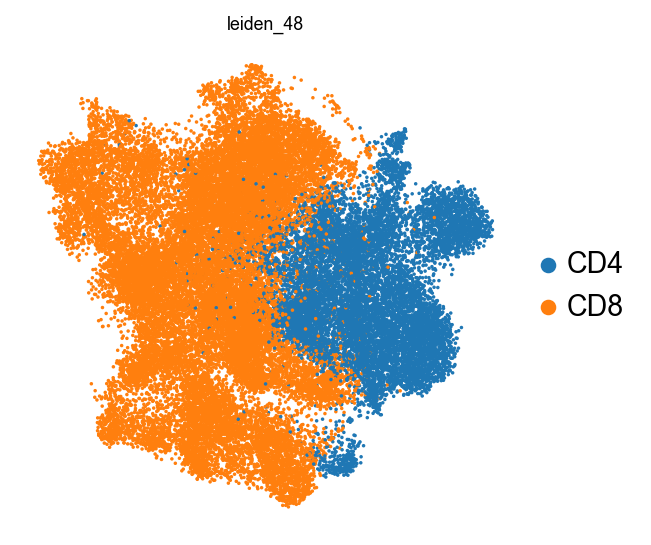

In [36]:
sc.pl.umap(tcell_ann_concat, color=['leiden_48'], show=False, frameon=False, title=None, s=10)

In [37]:
ptcy = ['C155','C101','C162','C160']

tcell_ann_concat.obs['ptcy'] = 'NoP'
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['PatientID'].isin(ptcy),'ptcy'] = "Ptcy"

tcell_ann_concat.obs['PatientID_Grade_Ptcy'] = tcell_ann_concat.obs['PatientID'].astype(str)+'_'+tcell_ann_concat.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat.obs['ptcy'].astype(str)

tcell_ann_concat.obs['PatientID_Grade_Ptcy']=tcell_ann_concat.obs['PatientID_Grade_Ptcy'].astype("category")

tcell_ann_concat.obs['SampleID_Ptcy'] = tcell_ann_concat.obs['SampleID'].astype(str)+'_'+tcell_ann_concat.obs['ptcy'].astype(str)

tcell_ann_concat.obs['SampleID_Ptcy']=tcell_ann_concat.obs['SampleID_Ptcy'].astype("category")

tcell_ann_concat_Upper = tcell_ann_concat[tcell_ann_concat.obs['Tissue_Location'] == 'Upper GI']

tcell_ann_concat_Upper_LP = tcell_ann_concat_Upper[tcell_ann_concat_Upper.obs['LPorIE'] == 'Lamina Propria Cells']
tcell_ann_concat_Upper_IE = tcell_ann_concat_Upper[tcell_ann_concat_Upper.obs['LPorIE'] == 'Intraepithelial Cells']

tcell_ann_concat_Lower = tcell_ann_concat[tcell_ann_concat.obs['Tissue_Location'] == 'Lower GI']
tcell_ann_concat_Lower_LP = tcell_ann_concat_Lower[tcell_ann_concat_Lower.obs['LPorIE'] == 'Lamina Propria Cells']
tcell_ann_concat_Lower_IE = tcell_ann_concat_Lower[tcell_ann_concat_Lower.obs['LPorIE'] == 'Intraepithelial Cells']

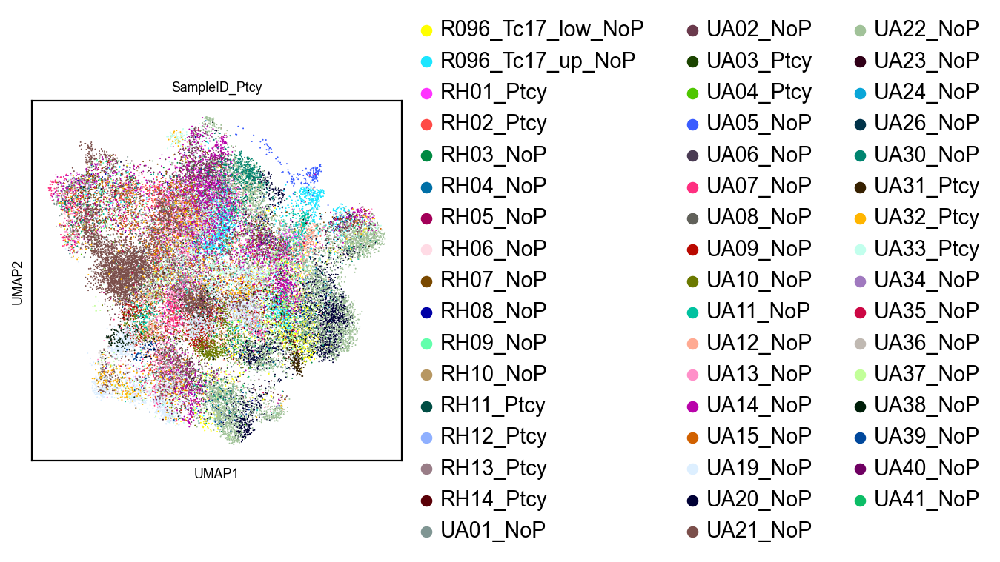

In [38]:
sc.pl.umap(tcell_ann_concat, color = ['SampleID_Ptcy'])

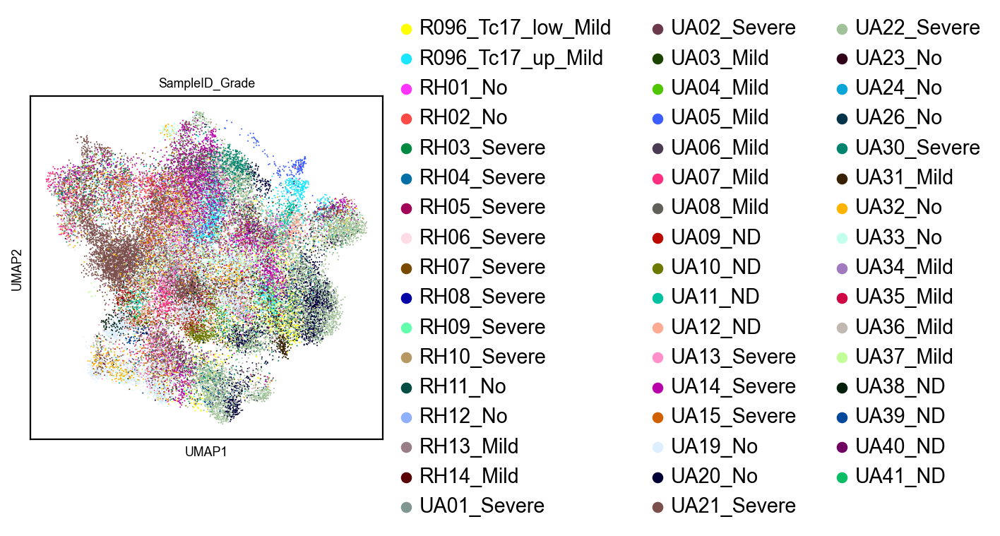

In [39]:
sc.pl.umap(tcell_ann_concat, color = ['SampleID_Grade'])

In [40]:
###### Filter out samples with low cell count
# Calculate cell counts per sample
cell_counts = tcell_ann_concat.obs['SampleID'].value_counts()

# Get samples with at least 100 cells
valid_samples = cell_counts[cell_counts >= 100].index

# Subset AnnData to retain only valid samples
tcell_ann_concat_f = tcell_ann_concat[tcell_ann_concat.obs['SampleID'].isin(valid_samples), :]

# Verify filtering
print(f"Remaining samples: {tcell_ann_concat_f.obs['SampleID'].nunique()}")
print(f"Remaining cells: {tcell_ann_concat_f.n_obs}")

Remaining samples: 38
Remaining cells: 38050


# PTCY vs no PTCY

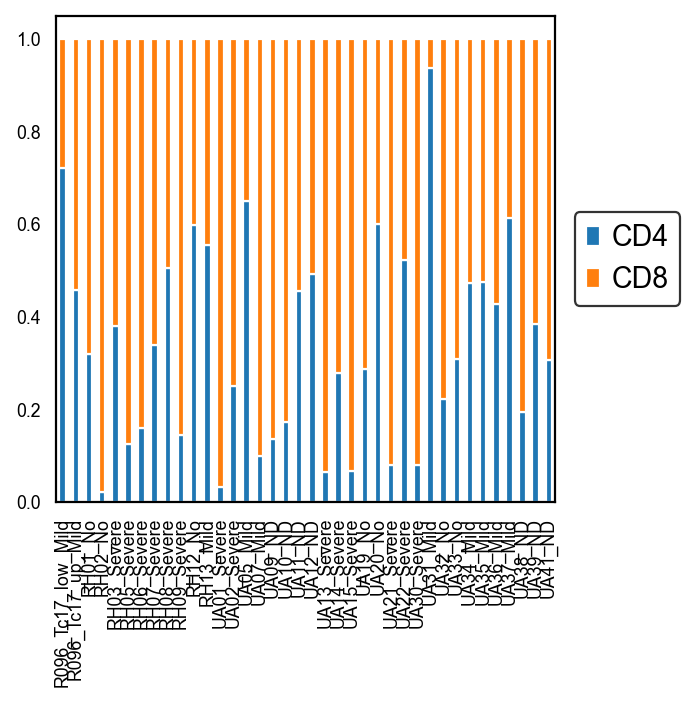

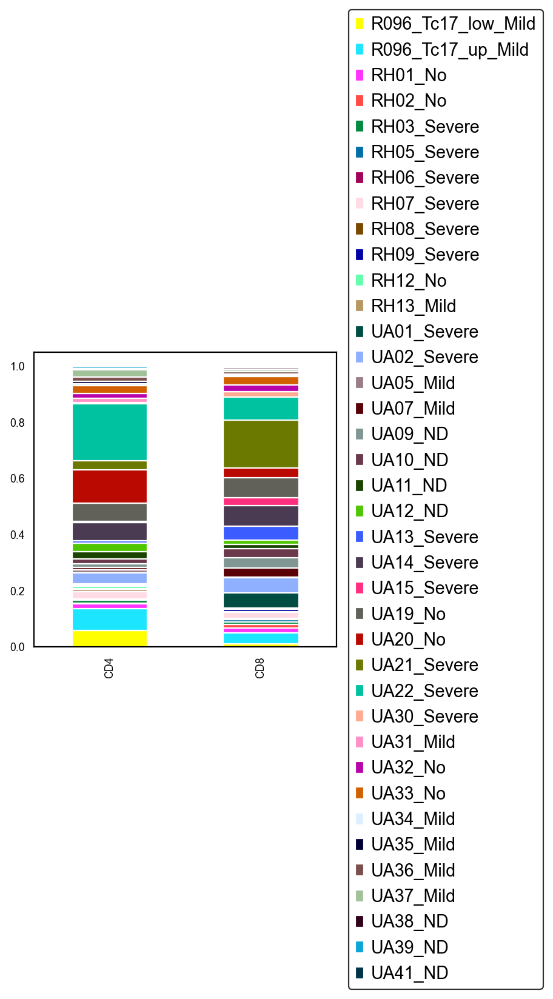

1
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.020e-02
mild vs. severe: Custom statistical test, P_val:6.334e-03
no vs. severe: Custom statistical test, P_val:1.029e-01
Raw p-values: [0.015099190199248972, 0.10286022472686689, 0.0021114910066705956]
Holm-corrected p-values: [0.03019838 0.10286022 0.00633447]
('no', 'mild'): corrected p = 0.030198 (significant)
('no', 'severe'): corrected p = 0.102860 (not significant)
('mild', 'severe'): corrected p = 0.006334 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


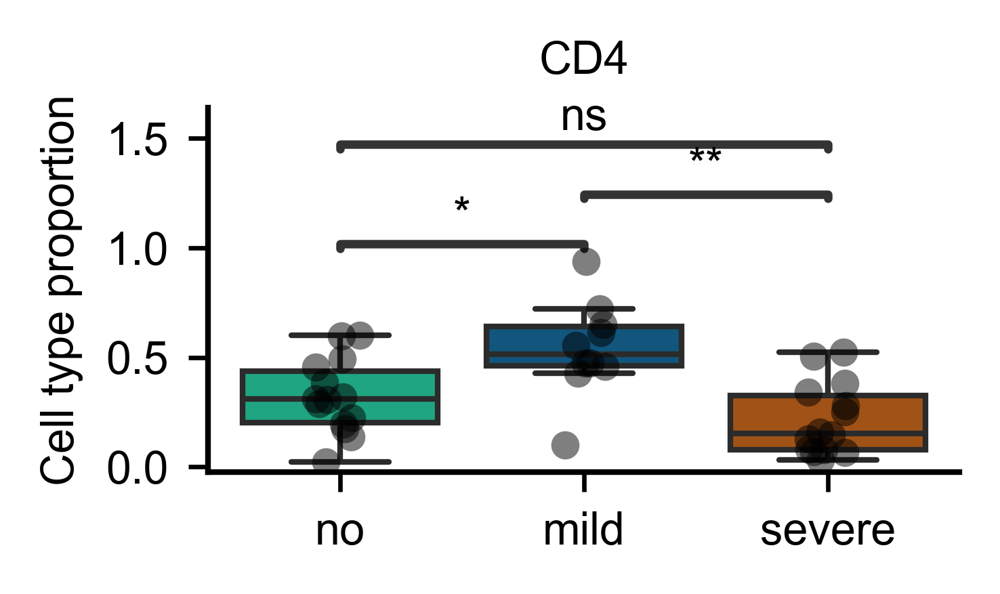

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.020e-02
mild vs. severe: Custom statistical test, P_val:6.334e-03
no vs. severe: Custom statistical test, P_val:1.029e-01
Raw p-values: [0.015099190199248972, 0.10286022472686689, 0.0021114910066705956]
Holm-corrected p-values: [0.03019838 0.10286022 0.00633447]
('no', 'mild'): corrected p = 0.030198 (significant)
('no', 'severe'): corrected p = 0.102860 (not significant)
('mild', 'severe'): corrected p = 0.006334 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


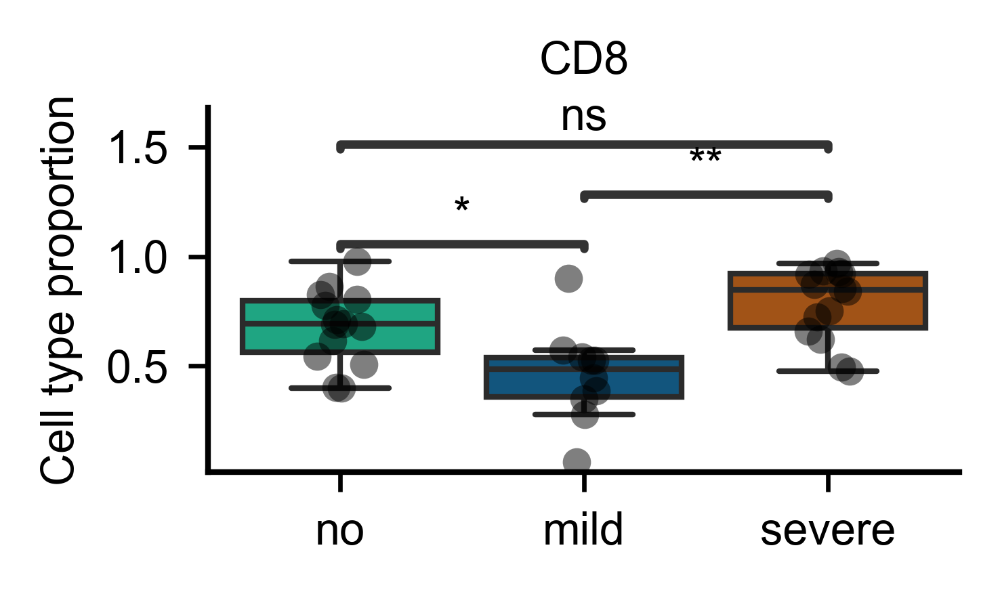

In [41]:
from matplotlib import rcParams
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from scipy import stats
from statsmodels.stats.multitest import multipletests

obs_1 = 'SampleID_Grade'
obs_2 = 'leiden_48'
num = 1

for adata in [tcell_ann_concat_f]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    print(num)
    num += 1

    for i in adata.obs[obs_2].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[i].values[~np.isnan(selected_columns_severe.loc[i].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[i].values[~np.isnan(selected_columns_mild.loc[i].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[i].values[~np.isnan(selected_columns_no.loc[i].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[i].values[~np.isnan(selected_columns_treated.loc[i].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[i].values[~np.isnan(selected_columns_nd.loc[i].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportion')
        ax.set_title(i)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw Mann-Whitney p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value', order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        plt.tight_layout()

        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        plt.savefig(FIGURES_SC_DIR / f'fig_{i}_boxplot_300dpi.png', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{i}_boxplot_300dpi.pdf', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{i}_boxplot_300dpi.svg', dpi=300, transparent=True)
        plt.show()

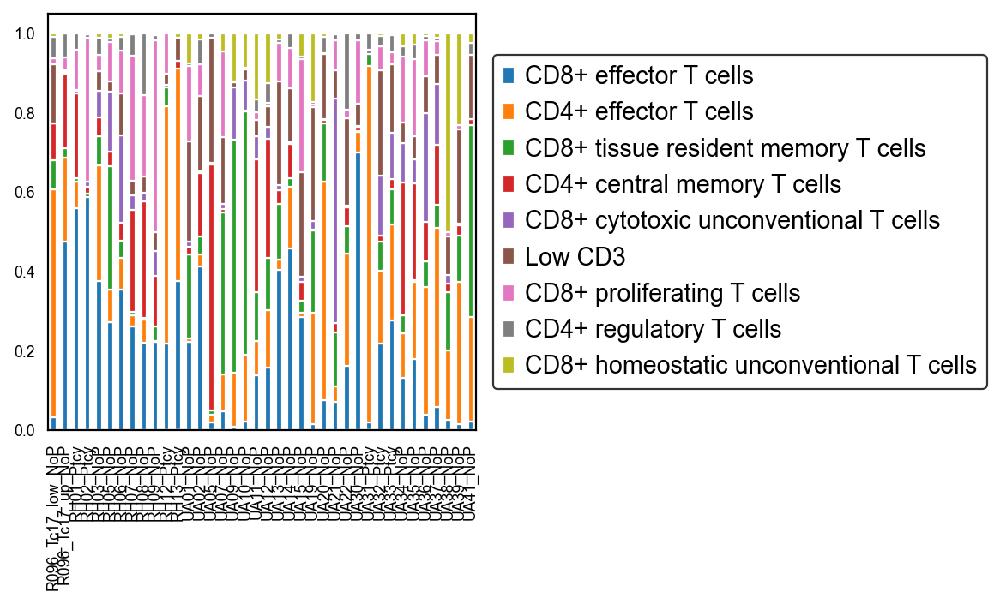

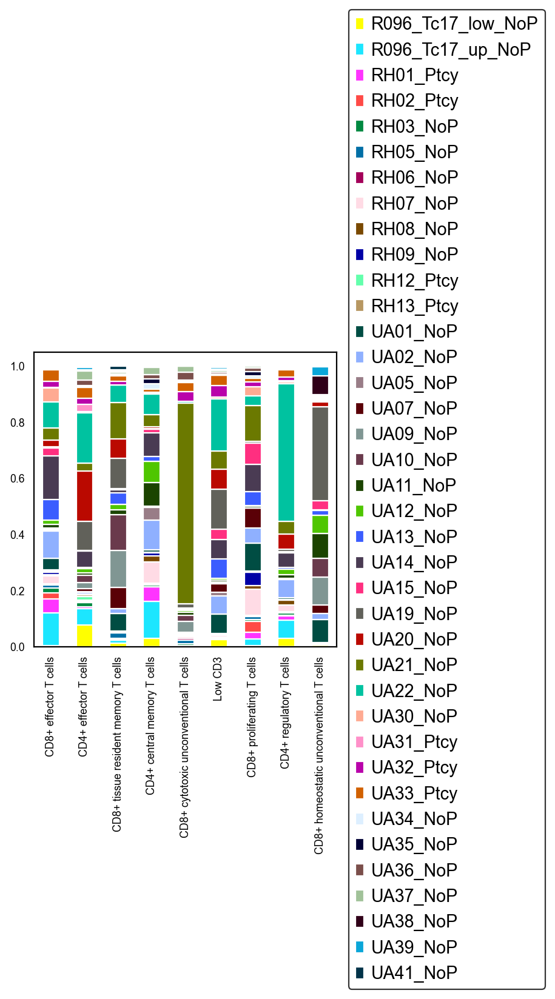

1
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:5.475e-02 U_stat=1.600e+02


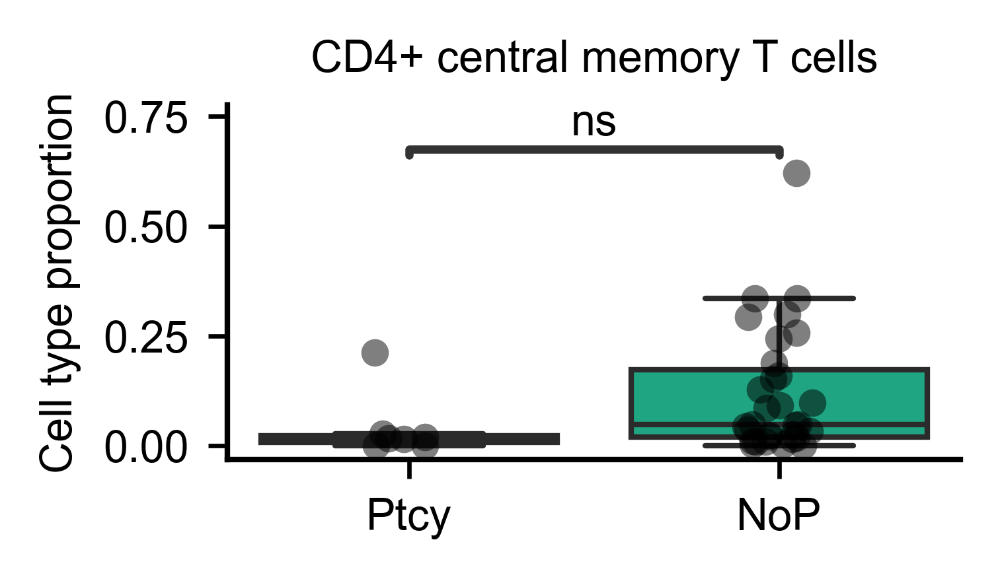

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:1.447e-01 U_stat=6.900e+01


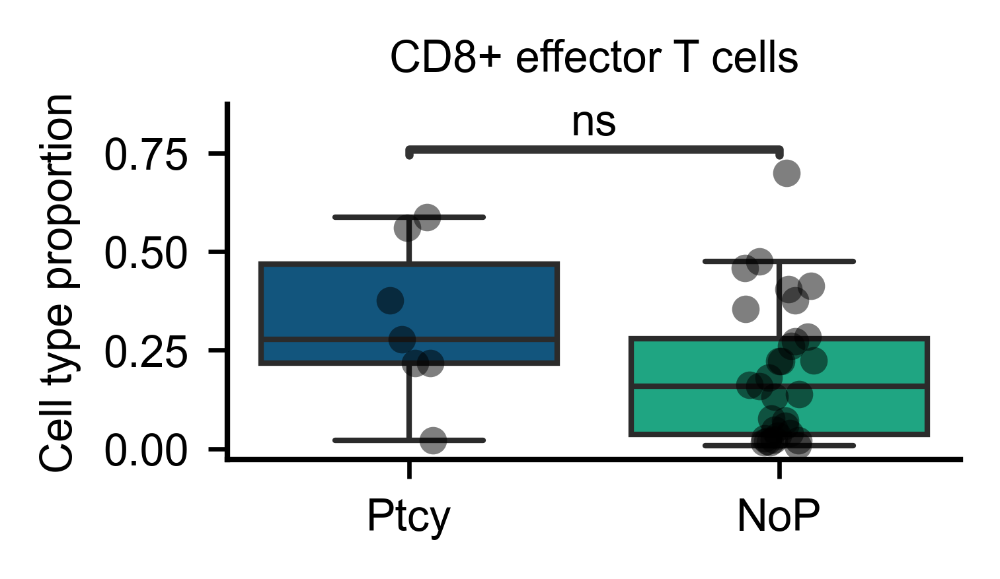

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:2.053e-01 U_stat=7.400e+01


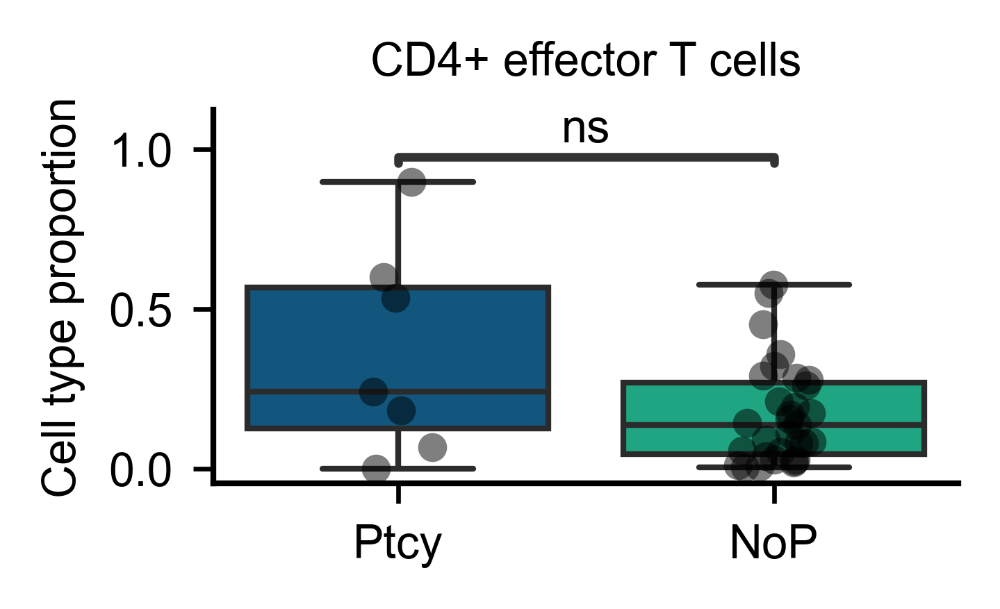

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:7.345e-01 U_stat=1.180e+02


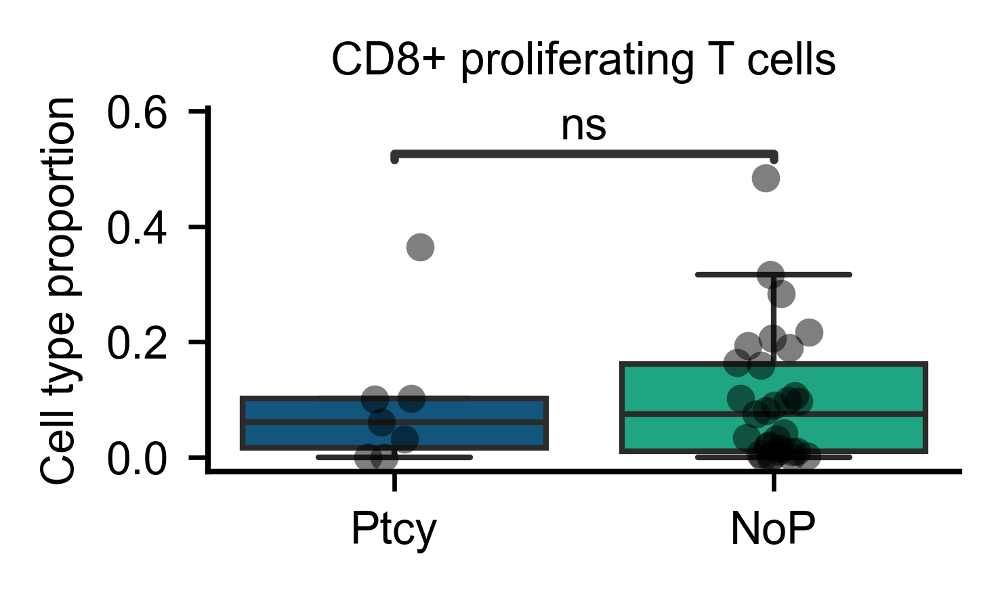

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:5.718e-01 U_stat=1.240e+02


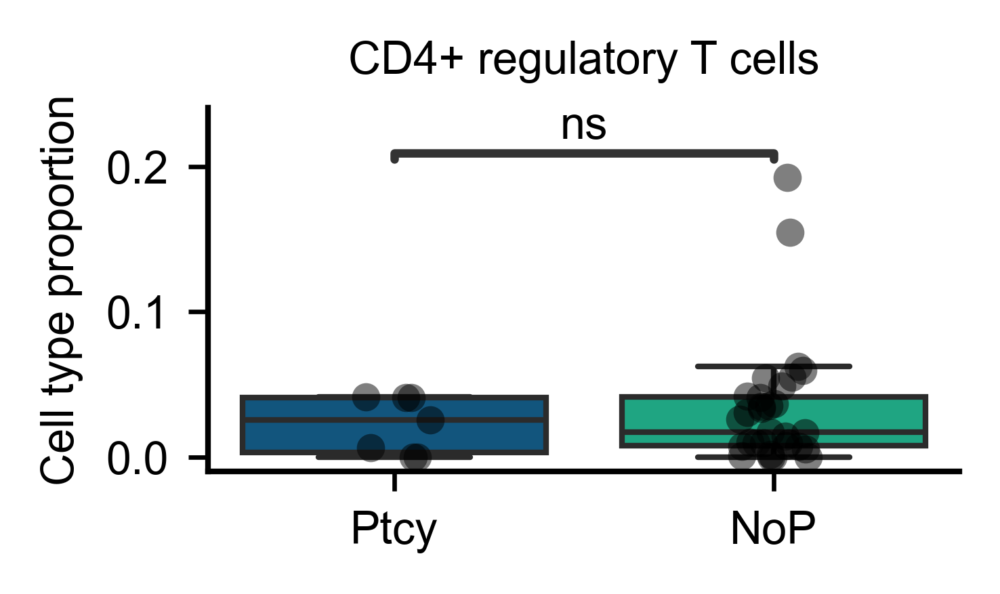

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:7.646e-02 U_stat=1.560e+02


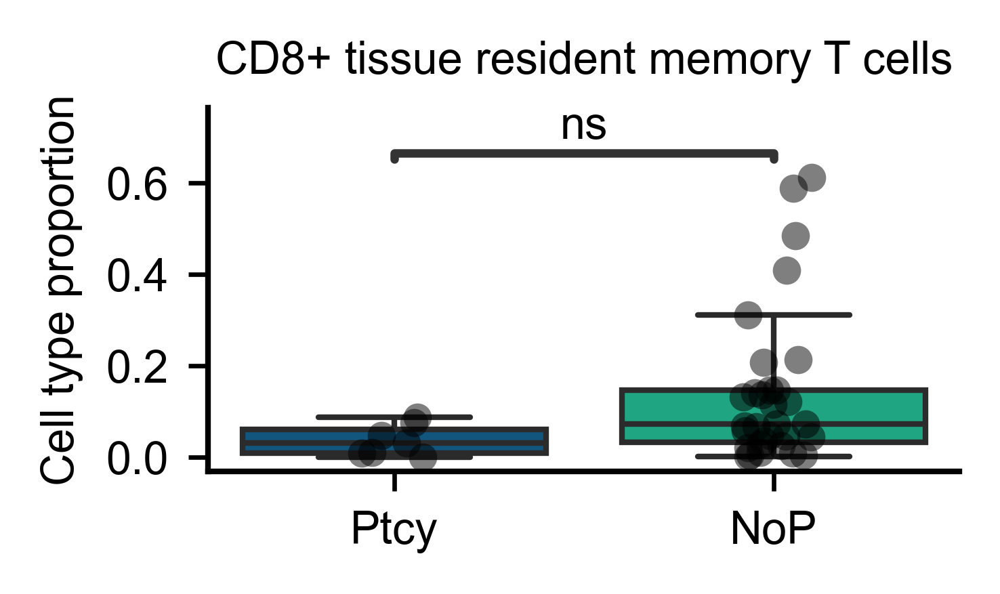

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:1.226e-01 U_stat=1.500e+02


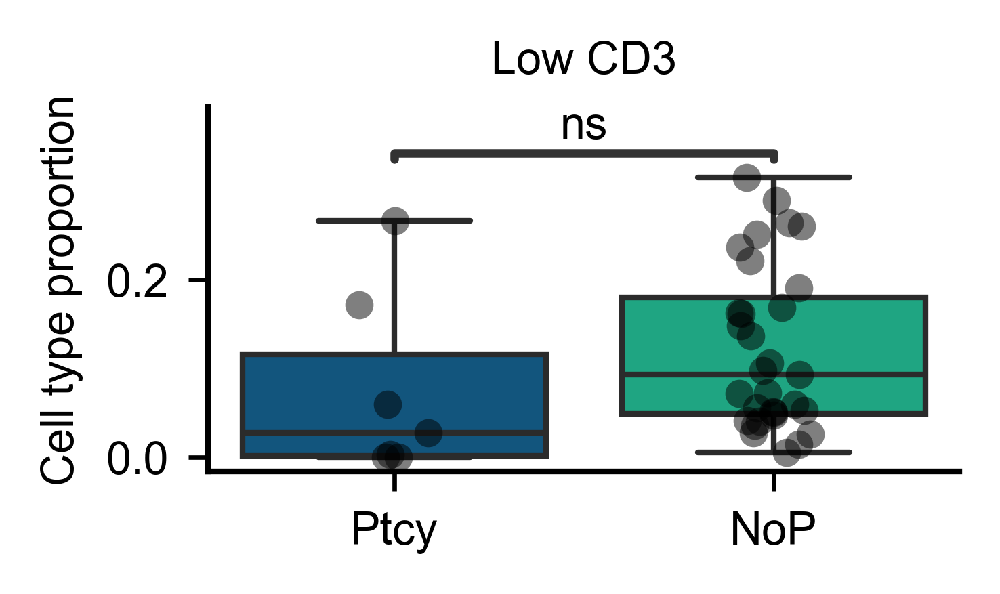

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:5.594e-01 U_stat=1.245e+02


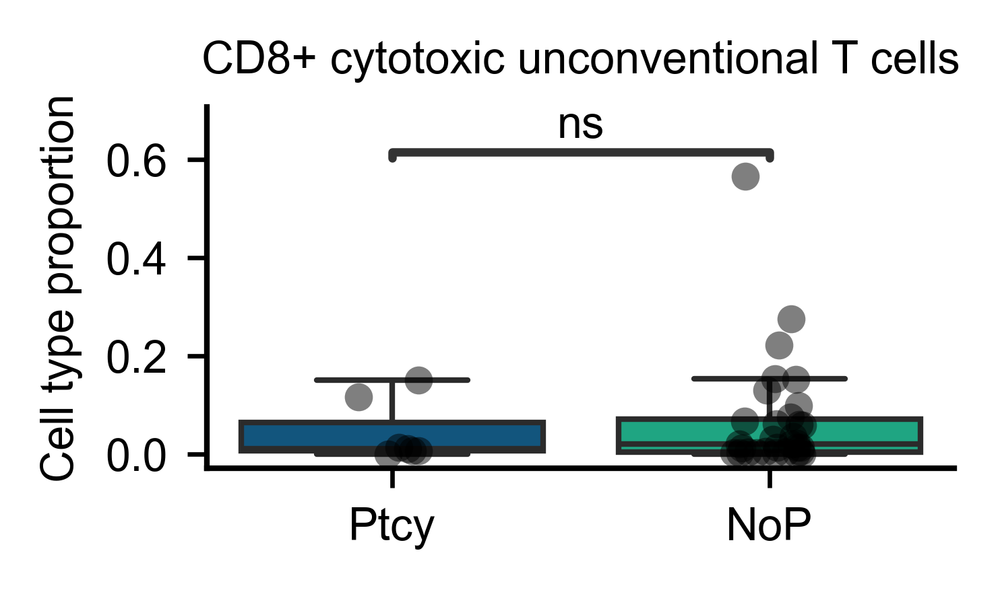

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NoP vs. Ptcy: Mann-Whitney-Wilcoxon test two-sided, P_val:1.733e-02 U_stat=1.720e+02


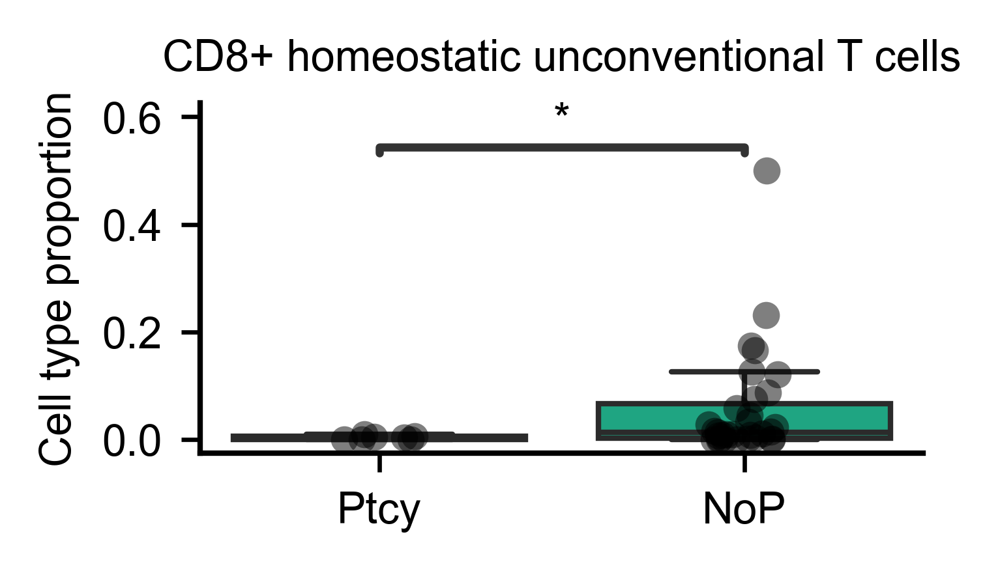

In [42]:

# Assuming adata is already defined and contains the necessary data
obs_1 = 'SampleID_Ptcy'
obs_2 = 'T_cell_subsets'
num = 1

for adata in [tcell_ann_concat_f]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                    for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                    for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Sort columns if necessary
    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    print(num)
    num += 1
    p_list = []

    for i in adata.obs['T_cell_subsets'].unique():
        substring = 'Ptcy'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[i].values[~np.isnan(selected_columns_severe.loc[i].values)]

        substring = 'NoP'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[i].values[~np.isnan(selected_columns_mild.loc[i].values)]

        
        df_severe = pd.DataFrame()
        df_severe['Value'] = severe
        df_severe['Grade'] = 'Ptcy'

        df_mild = pd.DataFrame()
        df_mild['Value'] = mild
        df_mild['Grade'] = 'NoP'
        

        palette = {'NoP': '#09BB8C', 'Ptcy': '#005A8F'}

        result = pd.concat([df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette, order=['Ptcy','NoP'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black', alpha=0.5, jitter=True, order=['Ptcy','NoP'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportion')
        ax.set_title(i)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('Ptcy','NoP')]
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value')
        annotator.configure(test='Mann-Whitney')
        annotator.apply_and_annotate()
        plt.tight_layout()

        # Save figure with 300 DPI
        plt.savefig(FIGURES_SC_DIR / f'fig_ptcy{i}_boxplot_300dpi.png', dpi=300)
        plt.savefig(FIGURES_SC_DIR / f'fig_ptcy{i}_boxplot_300dpi.pdf', dpi=300)

        plt.show()

In [43]:
tcell_ann_IE = tcell_ann_concat_f[tcell_ann_concat_f.obs["LPorIE"]== 'Intraepithelial Cells']
tcell_ann_LP =tcell_ann_concat_f[tcell_ann_concat_f.obs["LPorIE"]== 'Lamina Propria Cells']

# Proportion analysis for LP and IE

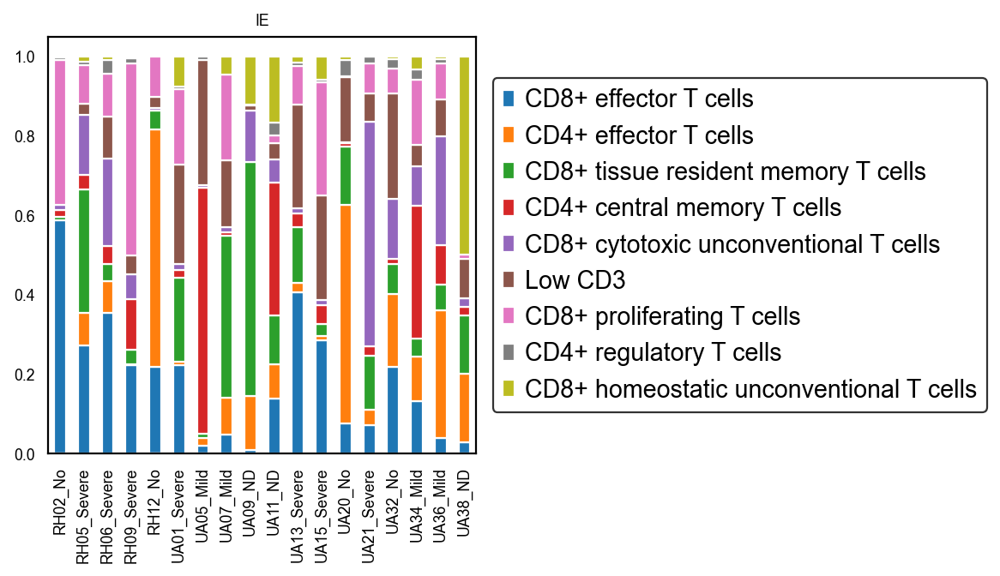

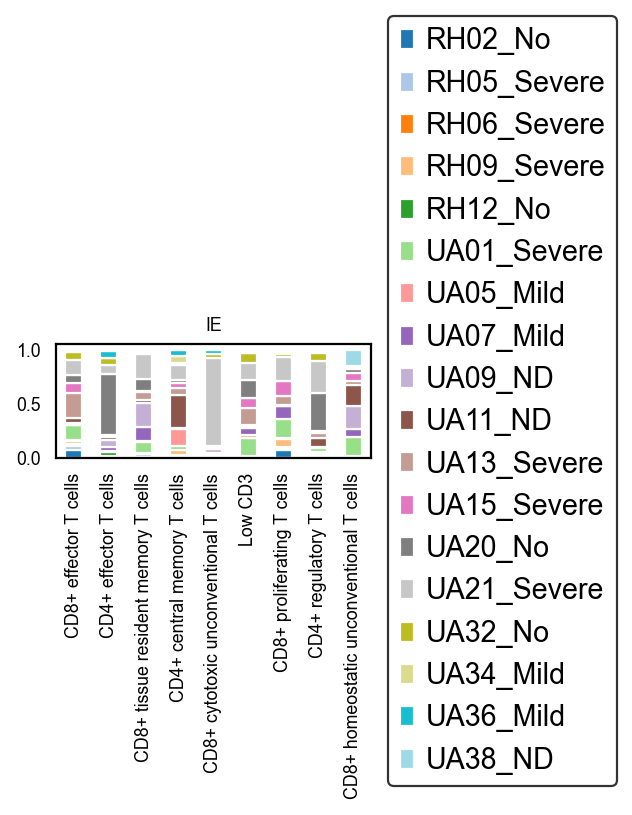

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.152e-01
mild vs. severe: Custom statistical test, P_val:3.636e-02
no vs. severe: Custom statistical test, P_val:1.946e-01

IE - CD8+ effector T cells
Raw p-values: [0.3151515151515151, 0.09731934731934733, 0.012121212121212121]
Holm-corrected p-values: [0.31515152 0.19463869 0.03636364]
('no', 'mild'): corrected p = 0.315152 (not significant)
('no', 'severe'): corrected p = 0.194639 (not significant)
('mild', 'severe'): corrected p = 0.036364 (significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


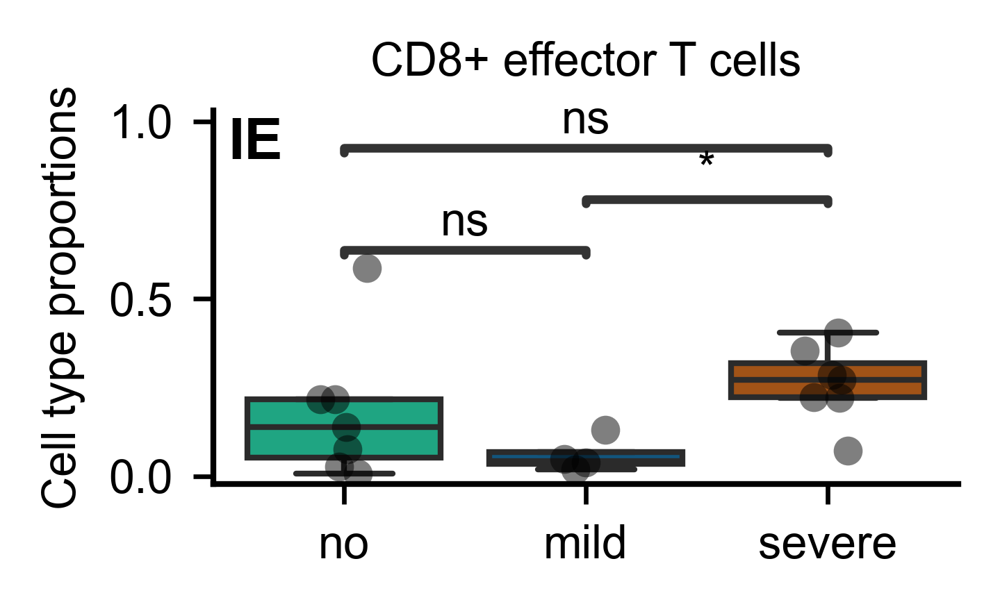

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.591e-01

IE - CD8+ proliferating T cells
Raw p-values: [0.6484848484848484, 0.05303030303030303, 0.5272727272727272]
Holm-corrected p-values: [1.         0.15909091 1.        ]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 0.159091 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


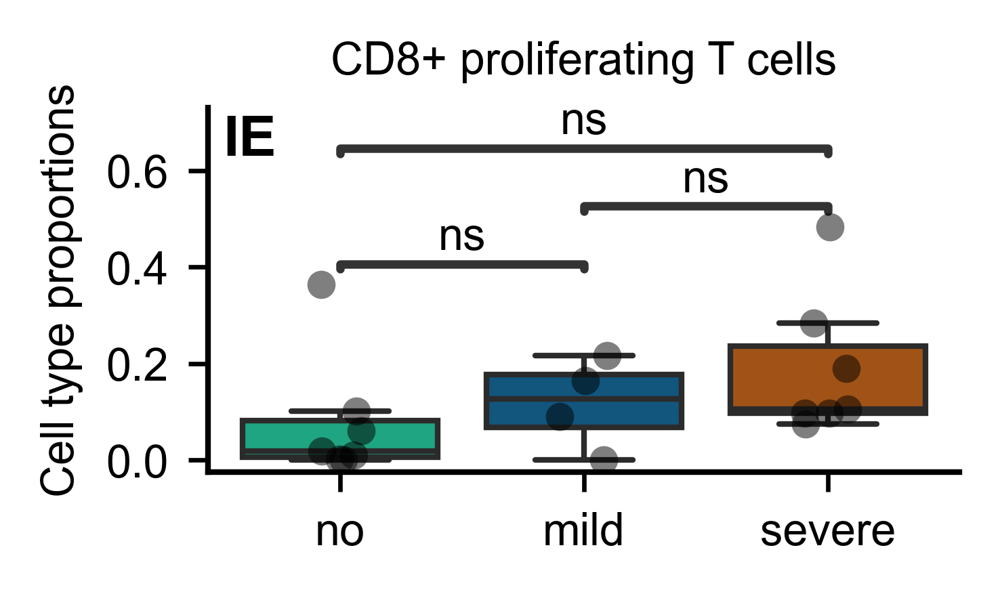

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00

IE - CD4+ regulatory T cells
Raw p-values: [1.0, 0.5224458272016163, 1.0]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


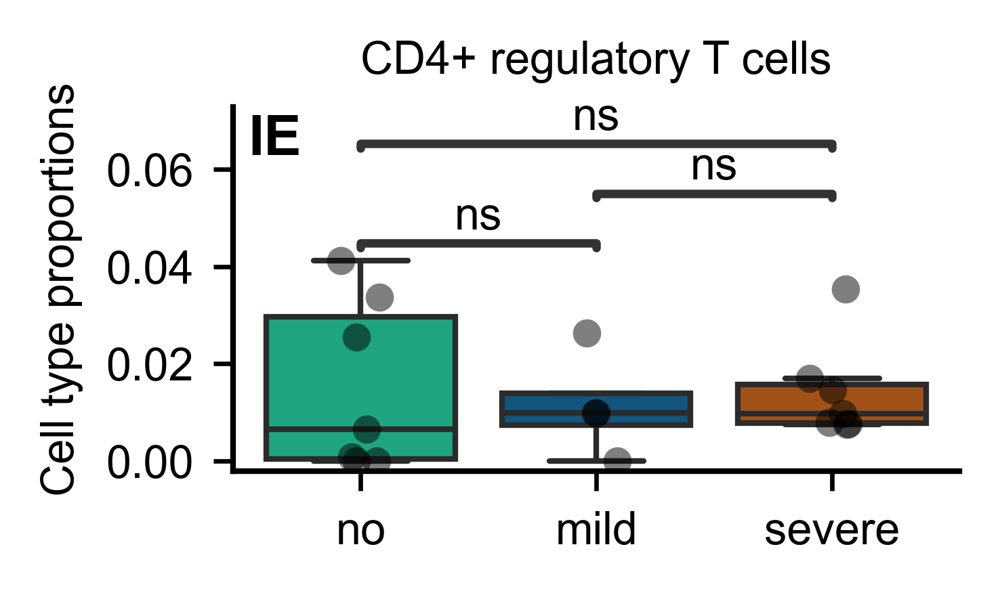

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:6.259e-01

IE - CD8+ cytotoxic unconventional T cells
Raw p-values: [0.9272727272727272, 0.20862470862470864, 0.5272727272727272]
Holm-corrected p-values: [1.         0.62587413 1.        ]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 0.625874 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


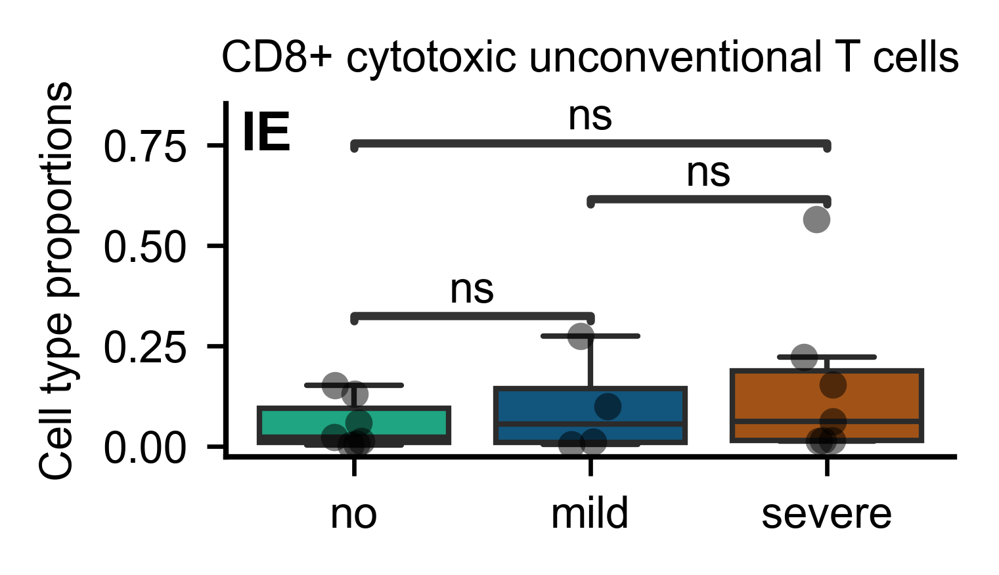

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00

IE - CD8+ tissue resident memory T cells
Raw p-values: [0.5272727272727272, 0.9015151515151516, 0.9272727272727272]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


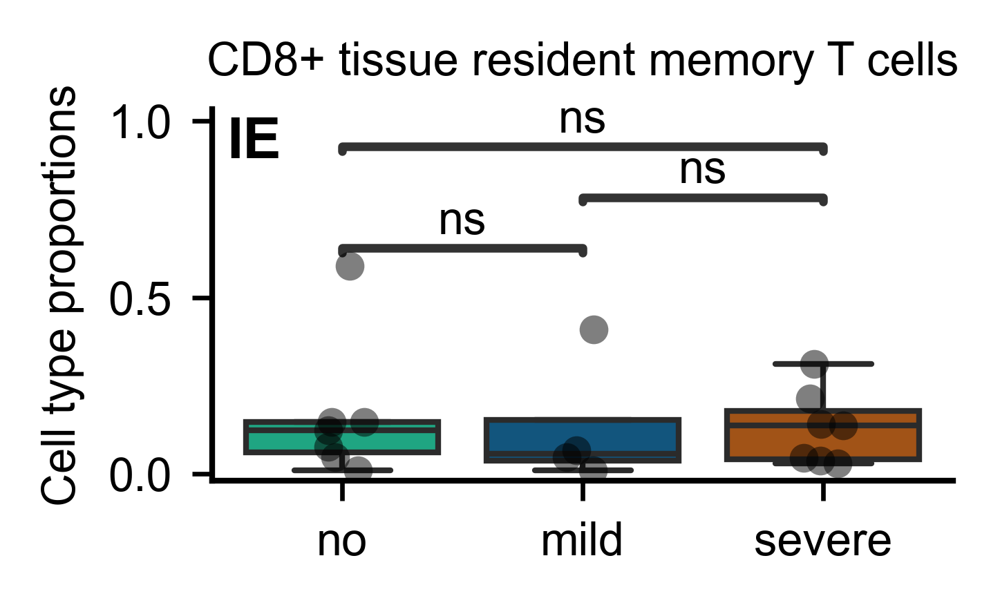

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.365e-01
mild vs. severe: Custom statistical test, P_val:4.365e-01
no vs. severe: Custom statistical test, P_val:1.221e-01

IE - CD4+ central memory T cells
Raw p-values: [0.2182533534553157, 0.04069193939734579, 0.3151515151515151]
Holm-corrected p-values: [0.43650671 0.12207582 0.43650671]
('no', 'mild'): corrected p = 0.436507 (not significant)
('no', 'severe'): corrected p = 0.122076 (not significant)
('mild', 'severe'): corrected p = 0.436507 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


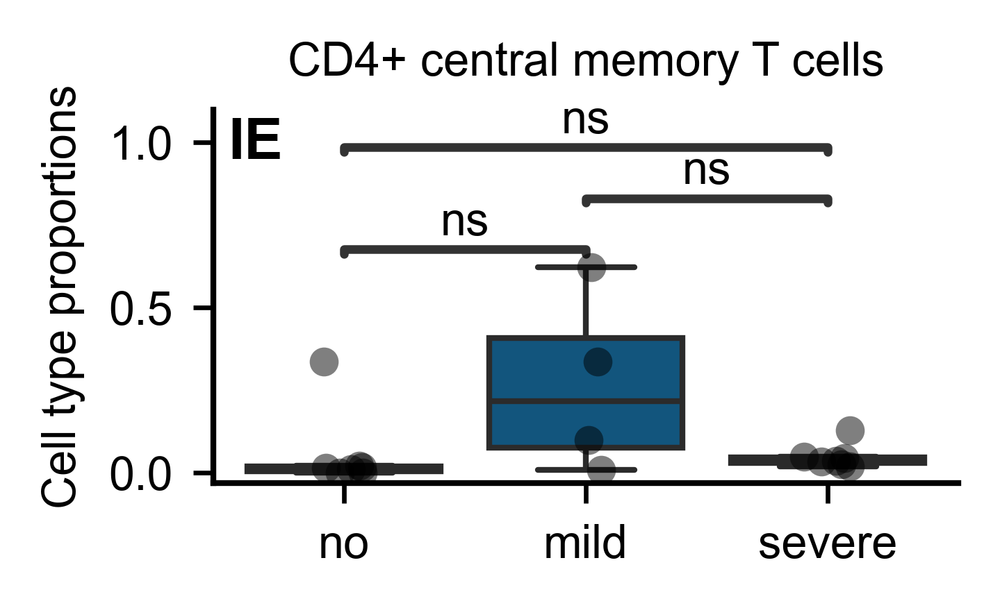

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00

IE - CD8+ homeostatic unconventional T cells
Raw p-values: [0.7048167647243153, 0.8047785547785549, 0.7878787878787878]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


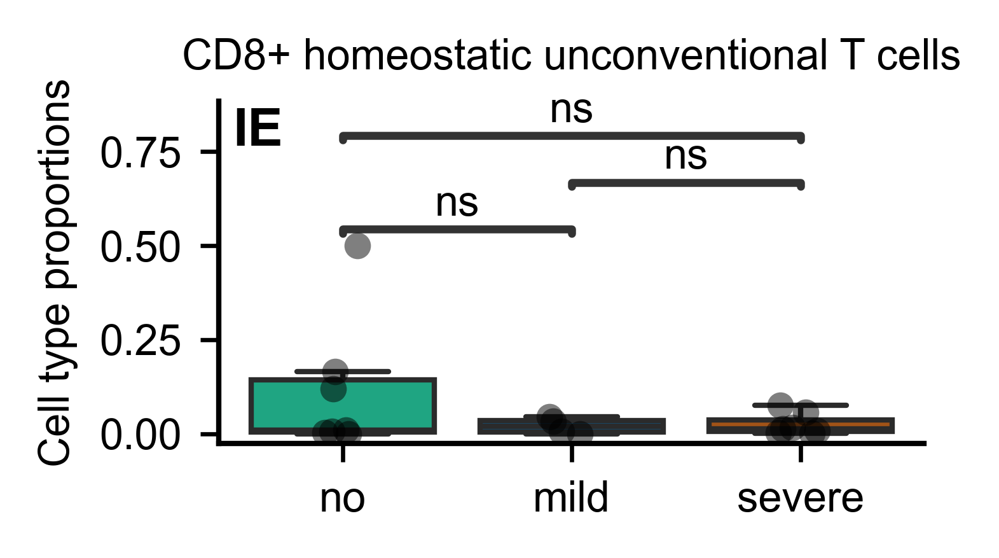

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:5.273e-01
mild vs. severe: Custom statistical test, P_val:1.455e-01
no vs. severe: Custom statistical test, P_val:7.867e-02

IE - CD4+ effector T cells
Raw p-values: [0.5272727272727272, 0.026223776223776224, 0.07272727272727272]
Holm-corrected p-values: [0.52727273 0.07867133 0.14545455]
('no', 'mild'): corrected p = 0.527273 (not significant)
('no', 'severe'): corrected p = 0.078671 (not significant)
('mild', 'severe'): corrected p = 0.145455 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


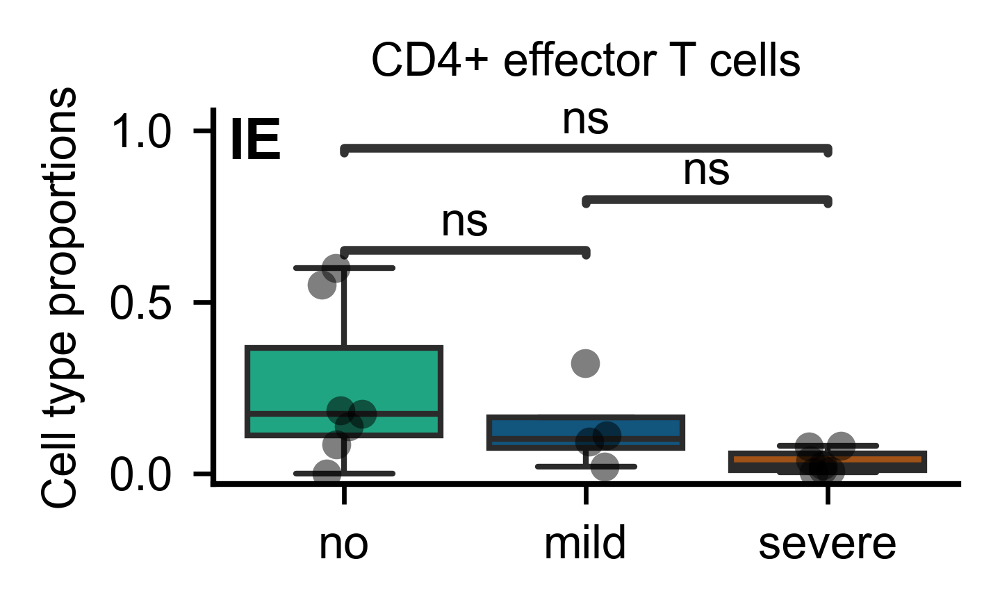

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:6.909e-01
mild vs. severe: Custom statistical test, P_val:7.879e-01
no vs. severe: Custom statistical test, P_val:6.909e-01

IE - Low CD3
Raw p-values: [0.2303030303030303, 0.31759906759906764, 0.7878787878787878]
Holm-corrected p-values: [0.69090909 0.69090909 0.78787879]
('no', 'mild'): corrected p = 0.690909 (not significant)
('no', 'severe'): corrected p = 0.690909 (not significant)
('mild', 'severe'): corrected p = 0.787879 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


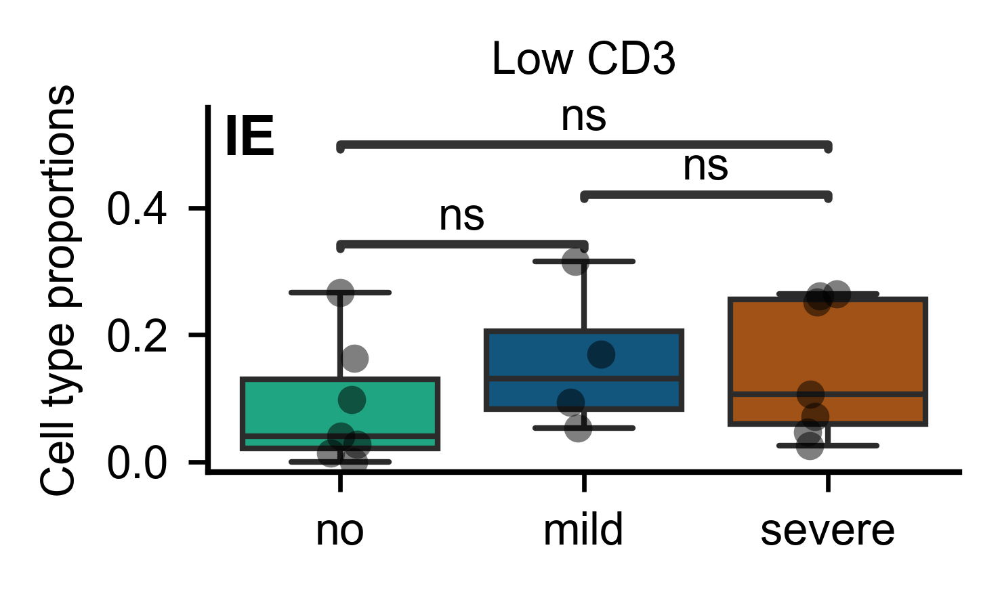

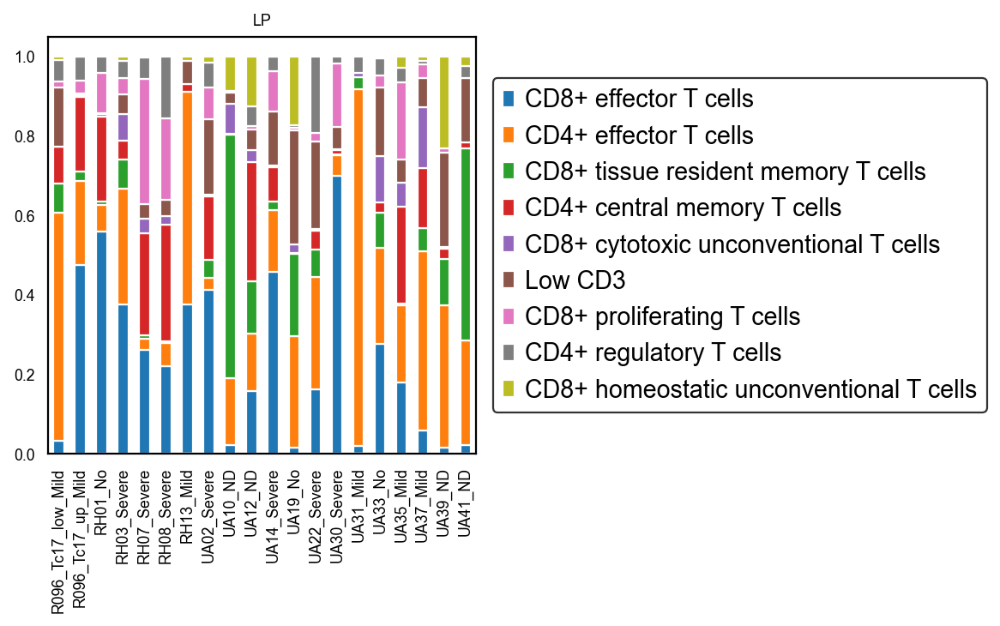

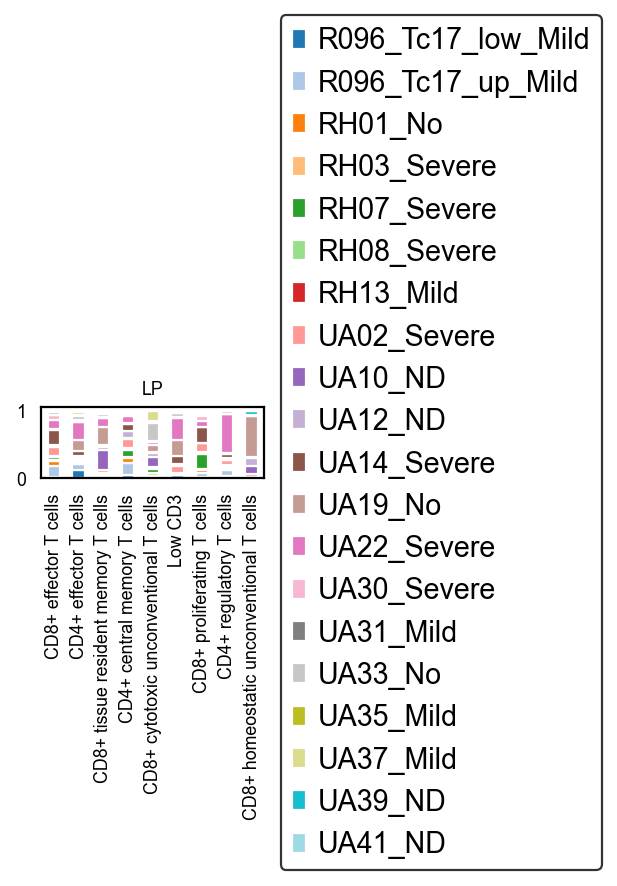

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:7.780e-01

LP - CD4+ central memory T cells
Raw p-values: [0.7307692307692307, 0.25932400932400934, 0.8356643356643356]
Holm-corrected p-values: [1.         0.77797203 1.        ]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 0.777972 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


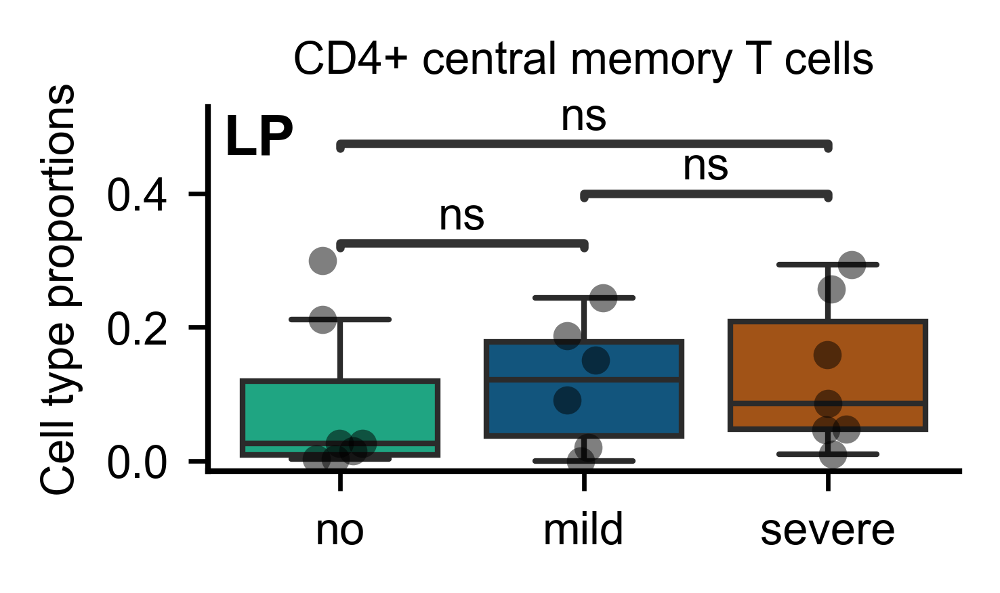

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.452e-01
mild vs. severe: Custom statistical test, P_val:2.751e-01
no vs. severe: Custom statistical test, P_val:1.591e-01

LP - CD8+ effector T cells
Raw p-values: [0.4452214452214452, 0.05303030303030303, 0.13752913752913754]
Holm-corrected p-values: [0.44522145 0.15909091 0.27505828]
('no', 'mild'): corrected p = 0.445221 (not significant)
('no', 'severe'): corrected p = 0.159091 (not significant)
('mild', 'severe'): corrected p = 0.275058 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


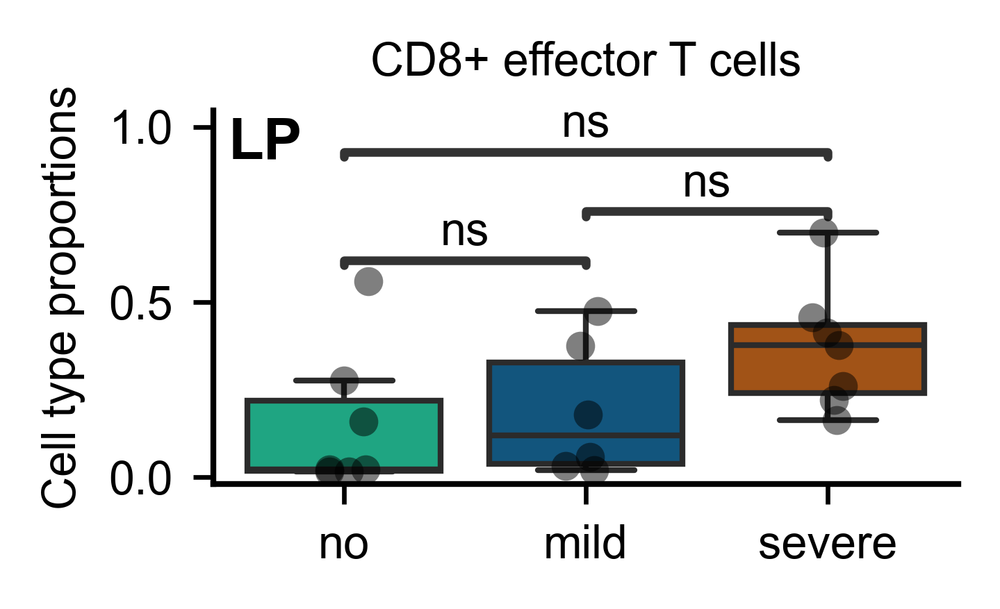

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.469e-01
mild vs. severe: Custom statistical test, P_val:4.196e-02
no vs. severe: Custom statistical test, P_val:2.086e-01

LP - CD4+ effector T cells
Raw p-values: [0.07342657342657342, 0.20862470862470864, 0.013986013986013986]
Holm-corrected p-values: [0.14685315 0.20862471 0.04195804]
('no', 'mild'): corrected p = 0.146853 (not significant)
('no', 'severe'): corrected p = 0.208625 (not significant)
('mild', 'severe'): corrected p = 0.041958 (significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


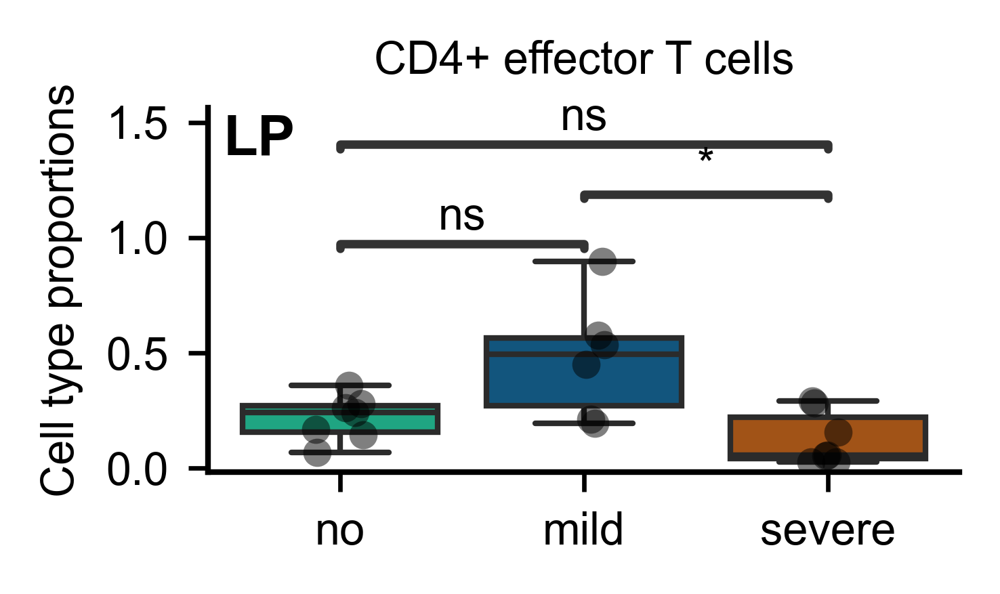

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:6.151e-01
mild vs. severe: Custom statistical test, P_val:1.069e-01
no vs. severe: Custom statistical test, P_val:2.098e-02

LP - CD8+ proliferating T cells
Raw p-values: [0.615125914752179, 0.006993006993006993, 0.05345510556768996]
Holm-corrected p-values: [0.61512591 0.02097902 0.10691021]
('no', 'mild'): corrected p = 0.615126 (not significant)
('no', 'severe'): corrected p = 0.020979 (significant)
('mild', 'severe'): corrected p = 0.106910 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


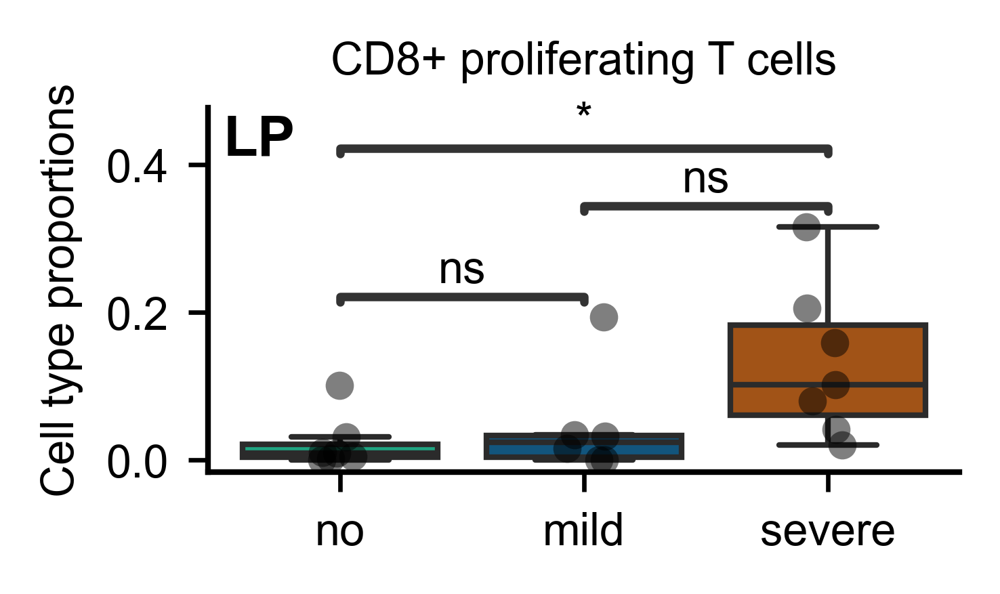

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.744e-01
mild vs. severe: Custom statistical test, P_val:3.613e-01
no vs. severe: Custom statistical test, P_val:1.136e-01

LP - CD4+ regulatory T cells
Raw p-values: [0.4744429004370553, 0.03787878787878788, 0.18065268065268064]
Holm-corrected p-values: [0.4744429  0.11363636 0.36130536]
('no', 'mild'): corrected p = 0.474443 (not significant)
('no', 'severe'): corrected p = 0.113636 (not significant)
('mild', 'severe'): corrected p = 0.361305 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


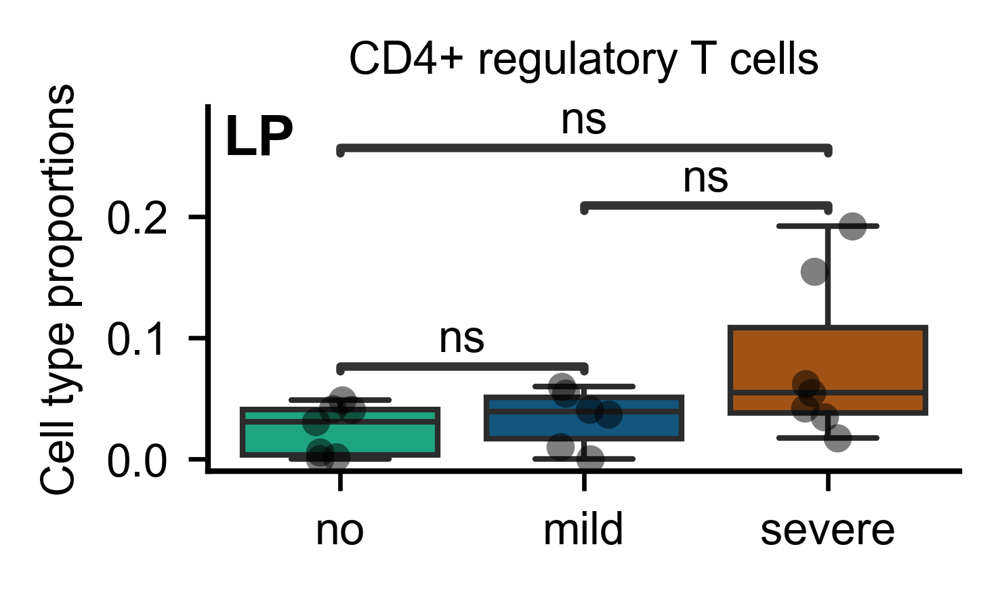

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.322e-02
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:3.322e-02

LP - CD8+ tissue resident memory T cells
Raw p-values: [0.013986013986013986, 0.011072261072261072, 1.0]
Holm-corrected p-values: [0.03321678 0.03321678 1.        ]
('no', 'mild'): corrected p = 0.033217 (significant)
('no', 'severe'): corrected p = 0.033217 (significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


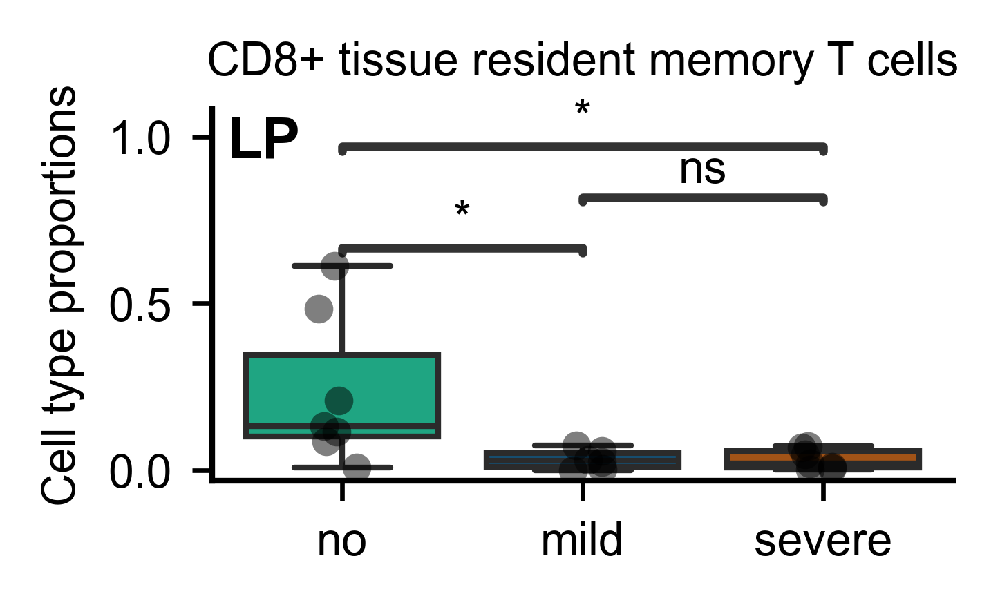

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:8.846e-01
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00

LP - Low CD3
Raw p-values: [0.2948717948717949, 0.8047785547785549, 0.6282051282051282]
Holm-corrected p-values: [0.88461538 1.         1.        ]
('no', 'mild'): corrected p = 0.884615 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


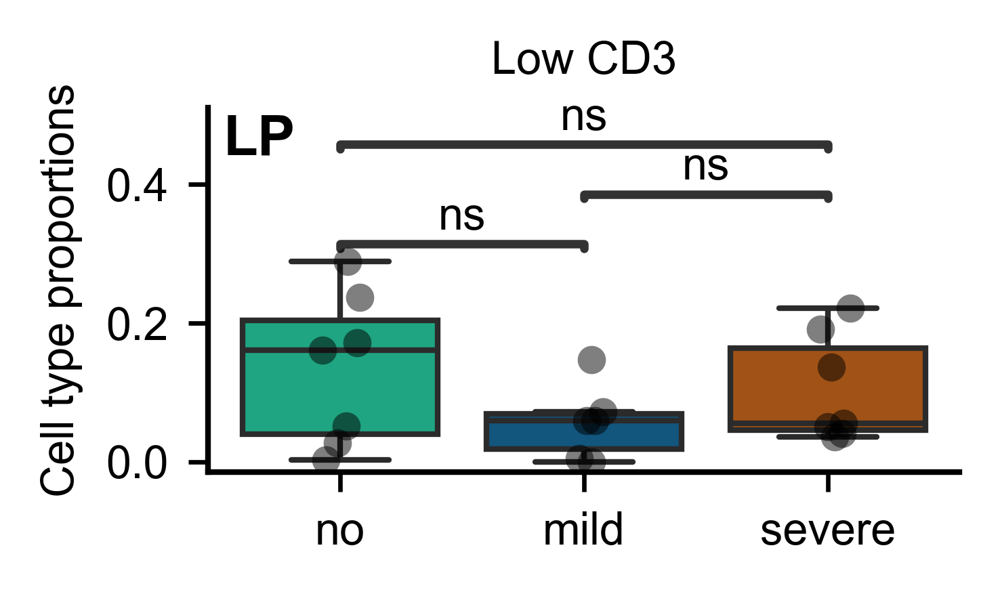

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.000e+00
mild vs. severe: Custom statistical test, P_val:1.000e+00
no vs. severe: Custom statistical test, P_val:1.000e+00

LP - CD8+ cytotoxic unconventional T cells
Raw p-values: [0.6678058142504256, 0.45571095571095577, 0.7307692307692307]
Holm-corrected p-values: [1. 1. 1.]
('no', 'mild'): corrected p = 1.000000 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 1.000000 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


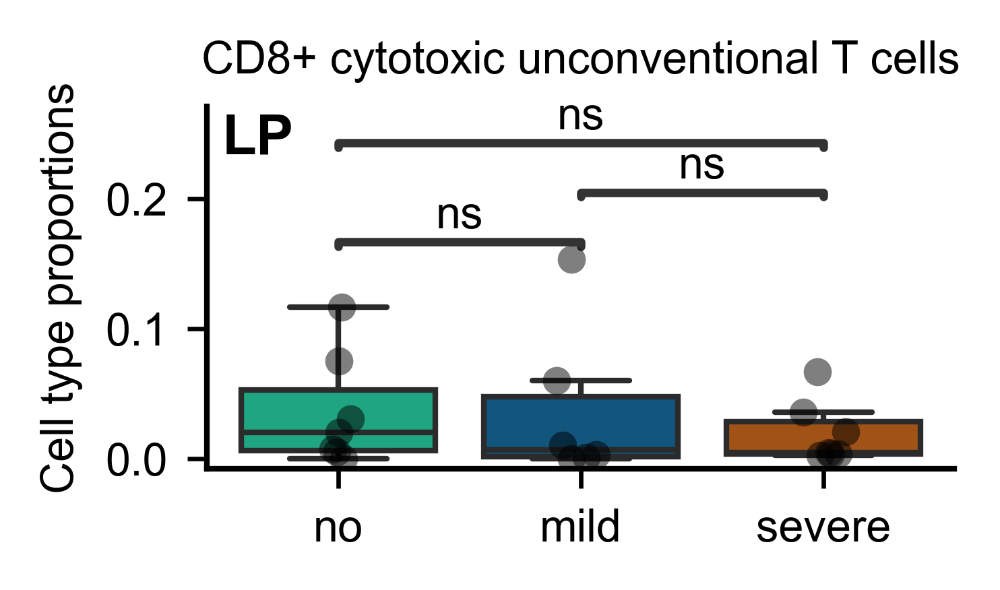

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.051e-01
mild vs. severe: Custom statistical test, P_val:4.689e-01
no vs. severe: Custom statistical test, P_val:9.906e-02

LP - CD8+ homeostatic unconventional T cells
Raw p-values: [0.15256272363657705, 0.03301920124410549, 0.46887897695853575]
Holm-corrected p-values: [0.30512545 0.0990576  0.46887898]
('no', 'mild'): corrected p = 0.305125 (not significant)
('no', 'severe'): corrected p = 0.099058 (not significant)
('mild', 'severe'): corrected p = 0.468879 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


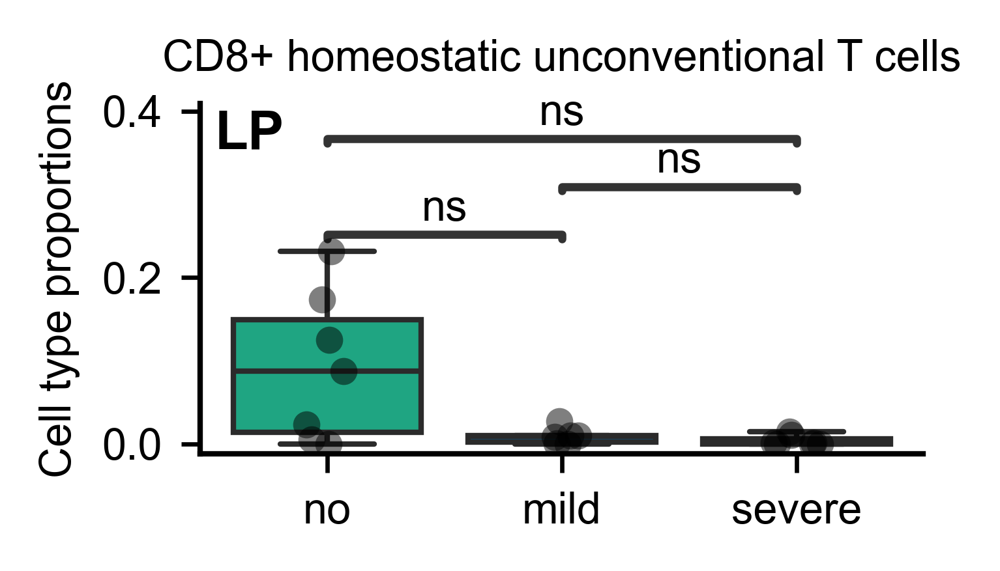

In [44]:
obs_1 = 'SampleID_Grade'
obs_2 = 'T_cell_subsets'

for tissue, adata in [('IE', tcell_ann_IE), ('LP', tcell_ann_LP)]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    tcell_colors = [celltype_colors[c] for c in obs2_clusters]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    ax = df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.title(f'{tissue}')
    plt.tight_layout()
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    ax = df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.title(f'{tissue}')
    plt.tight_layout()
    plt.show()

    for cell_type in adata.obs['T_cell_subsets'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[cell_type].values[
            ~np.isnan(selected_columns_severe.loc[cell_type].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[cell_type].values[
            ~np.isnan(selected_columns_mild.loc[cell_type].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[cell_type].values[
            ~np.isnan(selected_columns_no.loc[cell_type].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[cell_type].values[
            ~np.isnan(selected_columns_treated.loc[cell_type].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[cell_type].values[
            ~np.isnan(selected_columns_nd.loc[cell_type].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(cell_type)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()
        ax.text(0.02, 0.98, tissue, transform=ax.transAxes,
                ha='left', va='top', fontsize=10, fontweight='bold')

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw Mann-Whitney p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value',
                              order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        plt.tight_layout()

        print(f"\n{tissue} - {cell_type}")
        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        cell_type_safe = cell_type.replace(' ', '_').replace('+', 'pos').replace('/', '-')
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_boxplot_300dpi.png',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_boxplot_300dpi.pdf',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_boxplot_300dpi.svg',
                    dpi=300, transparent=True)
        plt.show()

# Homestatic conventional vs cytotoxic 

In [45]:
Unconventional_CD8 = tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets'].isin(['CD8+ cytotoxic unconventional T cells','CD8+ homeostatic unconventional T cells'])]

In [46]:
# pie chart of CD8+ cytotoxic unconventional T cells in each sample show percentage
cd8_cytotoxic = tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets'] == 'CD8+ cytotoxic unconventional T cells']
# concat patientID and sampleID to create a unique identifier for each sample
cd8_cytotoxic.obs['SampleID_Patient'] = cd8_cytotoxic.obs['PatientID'].astype(str) + '_' + cd8_cytotoxic.obs['SampleID'].astype(str)
cd8_cytotoxic_counts = cd8_cytotoxic.obs['SampleID_Patient'].value_counts() / cd8_cytotoxic.obs['SampleID'].value_counts().sum()
cd8_cytotoxic_counts

SampleID_Patient
C66_UA21              0.711498
ND001_UA09            0.038241
C160_UA33             0.034339
C160_UA32             0.032258
C179_UA36             0.029136
ND001_UA10            0.020552
C179_UA37             0.019771
R085_UA19             0.013788
C152_RH05             0.012227
ND001_UA11            0.010926
C159_RH07             0.007804
C152_RH06             0.006504
C152_RH03             0.006243
ND001_UA12            0.005723
C068_UA01             0.005463
C66_UA22              0.005463
C98_UA13              0.005203
C159_RH09             0.004422
C179_UA34             0.003902
C179_UA35             0.003382
C157_UA07             0.002862
C98_UA15              0.002601
C152_RH04             0.002341
C98_UA14              0.002341
ND003_UA40            0.001821
R096_R096_Tc17_up     0.001561
R085_UA20             0.001301
C068_UA02             0.001301
C155_RH01             0.001301
C159_RH08             0.001041
C155_RH02             0.001041
ND003_UA38            

In [47]:
# pie chart of patient C66 each T cell subset show percentage
c66 = tcell_ann_concat[tcell_ann_concat.obs['PatientID'] == 'C66']
c66_counts = c66.obs['T_cell_subsets'].value_counts() / c66.obs['T_cell_subsets'].value_counts().sum()
c66_counts

T_cell_subsets
CD8+ cytotoxic unconventional T cells      0.292675
CD4+ effector T cells                      0.157537
Low CD3                                    0.144586
CD8+ effector T cells                      0.116030
CD8+ tissue resident memory T cells        0.103715
CD4+ regulatory T cells                    0.101486
CD8+ proliferating T cells                 0.048408
CD4+ central memory T cells                0.034820
CD8+ homeostatic unconventional T cells    0.000743
Name: count, dtype: float64

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


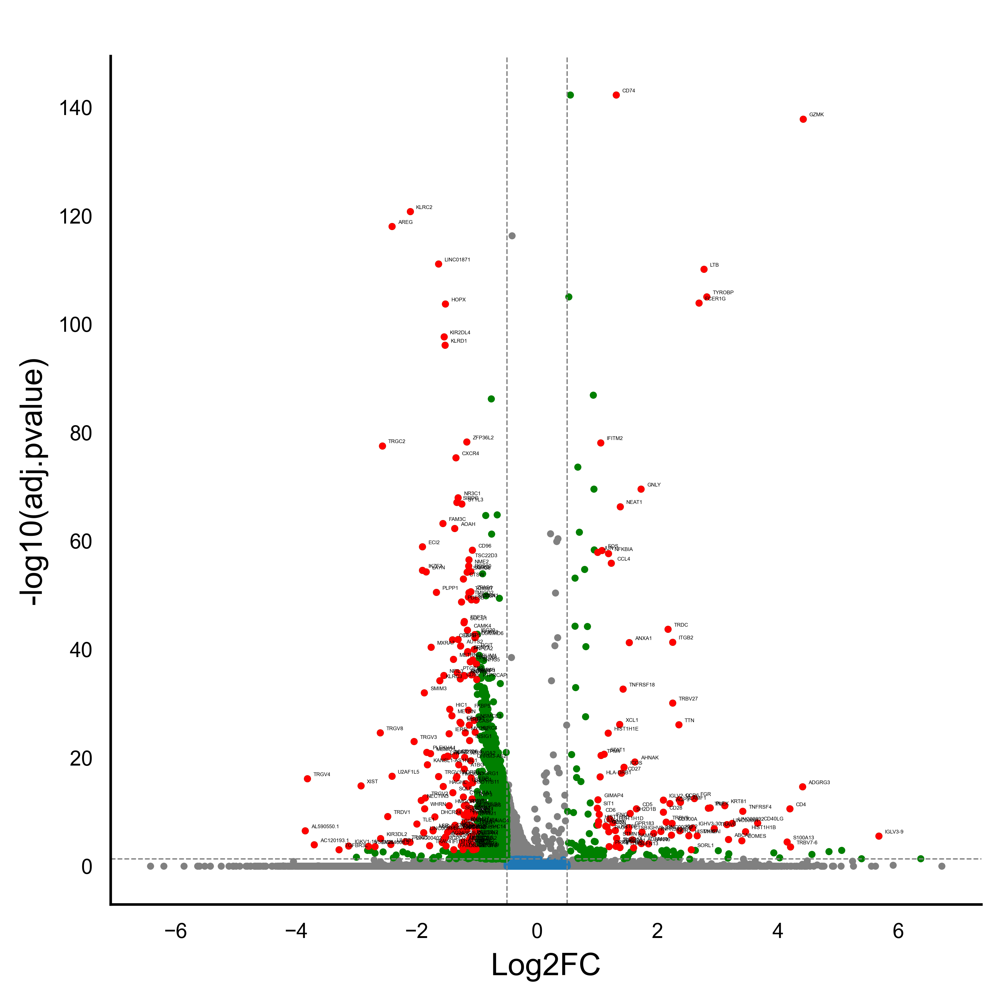

In [48]:
from copy import deepcopy
import matplotlib as mpl
# Update your existing rcParams
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3),  # Set default figure size to 3×3 inches
    'lines.linewidth': 1  # Set default line width to 1
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

sc.tl.rank_genes_groups(Unconventional_CD8, groupby='T_cell_subsets', use_raw=False, method='wilcoxon')
degs_df = sc.get.rank_genes_groups_df(Unconventional_CD8, group=None)
degs_df.to_csv(PROJECT_ROOT / 'adata_file'/ 'HomeostaticvsT.csv')

degs_df = sc.get.rank_genes_groups_df(Unconventional_CD8, group="CD8+ cytotoxic unconventional T cells")
degs_df = degs_df.loc[np.abs(degs_df.logfoldchanges) < 10]


crit_pval = 0.001
crit_l2fc = 1
nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

marker_intersect = sig_degs_df['names']

crit_pval = 0.05
crit_l2fc = 0.5
nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

fig, ax = plt.subplots(figsize=(6,6), dpi=300)

ax.scatter(degs_df['logfoldchanges'], 
            degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), c='gray',
            s=3)

ax.scatter(nonsig_degs_df['logfoldchanges'], 
            nonsig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            s=3)

ax.scatter(sig_degs_df['logfoldchanges'], 
            sig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            c='g',
            s=3)

ax.scatter(sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges'],
            sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj'].apply(lambda x: -np.log10(x)),
            c='r',
            s=3)

ax.axvline(x=crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axvline(x=-crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=-np.log10(crit_pval), c='gray', linestyle='--', linewidth=0.5)

oxphos_lfcs = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges']
oxphos_pvals = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj']
oxphos_genes = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['names']


#ax.set_xlim(-2, 2)  # Adjust these limits as needed
#ax.set_ylim(-1, 30)  # Adjust these limits as needed


for lfc, pval, gene in zip(oxphos_lfcs, oxphos_pvals, oxphos_genes):
    ax.text(lfc+0.1, -np.log10(pval)+0.5, gene, fontsize=2)
         
ax.set_xlabel('Log2FC', fontsize=12)  # Adjust fontsize as needed
ax.set_ylabel('-log10(adj.pvalue)', fontsize=12)  # Adjust fontsize as needed
ax.set_title(' ', fontsize=12)
ax.spines[['right', 'top']].set_visible(False)
plt.show()

In [49]:
# Define the upregulated genes by category
upregulated = {
    "TCR Signaling Components": ["CD3E", "CD3D", "CD247", "PTPRC", "LCP1", "LCP2", "FYB1"],
    
    "Co-stimulation/Coreceptors": ["CD27", "CD28", "ICOS", "CD4", "CD5", "CD6", "CD7", "CD2", 
                                   "CD40LG", "TNFRSF4", "TNFRSF18", "TNFRSF25"],
    
    "Activation Markers and TFs": ["CD69", "JUN", "FOS", "JUNB", "RORC", "EOMES", "ID2", "IKZF3"],
    
    "NF-kB Pathway": ["NFKBIA", "NFKBIZ", "TNFAIP3"],
    
    "MAPK Pathway": ["DUSP1", "DUSP2"],
    
    "Pro-inflammatory Cytokines": ["IFNG", "TNF", "LTB", "IL32", "MIF"],
    
    "Chemokines": ["CCL3", "CCL4", "CCL5", "CCL20", "XCL1"],
    
    "Cytokine/Chemokine Receptors": ["IL2RG", "CCR6"],
    
    "Interferon Response": ["IFNG", "STAT1", "IRF1", "IFITM1", "IFITM2", "GBP1", "GBP4", 
                           "GBP5", "PSME1", "PSME2"],
    
    "Effector Functions (Cytotoxicity)": ["GZMA", "GZMB", "GZMK", "GNLY", "NKG7", "FCER1G", "TYROBP"],
    
    "Antigen Presentation & Processing": ["HLA-A", "HLA-B", "HLA-C", "HLA-E", "B2M", "HLA-DRA", 
                                         "HLA-DRB1", "HLA-DPB1", "CD74", "PSME1", "PSME2", 
                                         "CTSB", "CTSH"],
    
    "Integrins/Adhesion": ["ITGB2", "ITM2A", "ITM2B", "CD81", "CD82"],
    
    "Cytoskeletal remodeling and motility": ["ACTB", "ACTG1", "PFN1", "CFL1", "CORO1A", 
                                            "ARPC1B", "ARPC2", "ARPC3", "ACTR2", "EVL", 
                                            "PLEK", "TUBA1B", "STMN1", "MYL6", "MYL12A", 
                                            "MYL12B", "MYH9", "RAC2", "RHOA", "TMSB4X", 
                                            "TMSB10", "VIM", "TPM3", "TPM4", "MACF1"],
    
    "Glycolysis": ["SLC2A3", "ATP5F1E"],
    
    "Cell Cycle/Proliferation": ["MKI67", "RRM2", "TYMS", "NUSAP1", "LMNB1"],
    
    "Stress Response/Chaperones": ["HSPA8", "HSP90AA1", "HSP90AB1", "HSPA5", "CALR"],
    
    "Co-inhibitory Receptors": ["CTLA4", "PDCD1", "LAG3"]
}

# Define the downregulated genes by category
downregulated = {
    "OXPHOS": ["NDUFV1", "NDUFS5", "NDUFC2", "NDUFA1", "COX7A2L", "COX14", 
              "ATP5MPL", "ATP5MD", "ATP5ME", "ATP6V1G1", "ATP8B4", "ATP8A1",
              "TOMM20", "TOMM7", "MICOS13", "CHCHD10", "HSPE1", "MPC2", 
              "PET100", "PRDX5"],
    
    "Inhibitory receptors": ["CD96", "CD160", "KLRC2", "KLRC3", "KLRD1", 
                            "KIR2DL4", "CD101", "SIRPG"],
    
    "Adhesion": ["ITGB7", "ITGA1"],
    
    "TFs": ["IKZF2", "NFIL3"],
    
    "Glucocorticoid receptor": ["NR3C1"],
    
    "Apoptosis": ["BCL2"],
    
    "STAT pathway": ["STAT4"],
    
    "Negative regulators of TCR signaling": ["CBLB", "PTPN22", "PTPN4", "SOCS1", 
                                            "PIK3IP1", "SPRY1", "UBASH3B"],
    
    "Lipid and cholesterol biosynthesis": ["CYP51A1", "MSMO1", "IDI1", "FDFT1", 
                                          "INSIG1", "HSD17B11", "ECH1", "ECI2", 
                                          "PNPLA2", "PLPP1", "MGST3", "DHRS7", 
                                          "LDLRAD4"]
}

# Create flat lists for all genes
all_upregulated_genes = []
for category, genes in upregulated.items():
    all_upregulated_genes.extend(genes)

all_downregulated_genes = []
for category, genes in downregulated.items():
    all_downregulated_genes.extend(genes)

# Remove any duplicates
all_upregulated_genes = list(set(all_upregulated_genes))
all_downregulated_genes = list(set(all_downregulated_genes))

# Combined list with regulation status
all_genes_with_status = []
for gene in all_upregulated_genes:
    all_genes_with_status.append((gene, "upregulated"))
for gene in all_downregulated_genes:
    all_genes_with_status.append((gene, "downregulated"))

# Print summary statistics
print(f"Total upregulated genes: {len(all_upregulated_genes)}")
print(f"Total downregulated genes: {len(all_downregulated_genes)}")
print(f"Total genes: {len(all_genes_with_status)}")

Total upregulated genes: 116
Total downregulated genes: 55
Total genes: 171


In [50]:
marker_intersect

0             CD74
2             GZMK
3              LTB
5           TYROBP
6           FCER1G
           ...    
38006      KIR2DL4
38007         HOPX
38008    LINC01871
38010         AREG
38011        KLRC2
Name: names, Length: 251, dtype: object

In [51]:
additional_genes = ['LDHA',
 'GAPDH',
 'SLC2A3',
 'NDUFA1',
 'COX14',
 'ATP5ME',
 'TYROBP',
 'FCER1G',
 'GZMK',
 'GZMA',
 'GNLY',
 'TNF',
 'IFNG',
 'PFN1',
 'CFL1',
 'RAC2',
 'TMSB4X',
 'ITGB2',
 'ITGAE',
 'KIR2DL4',
 'KLRC2',
 'IKZF2',
 'ENTPD1',
 'NT5E',
 'AREG', 'NR3C1']

In [52]:
# combine all all_upregulated_genes, all_downregulated_genes, additional_genes
final_genes = set(all_upregulated_genes) | set(all_downregulated_genes) | set(additional_genes)
final_genes = list(final_genes)
print(f"Total final genes: {len(final_genes)}")

Total final genes: 177


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


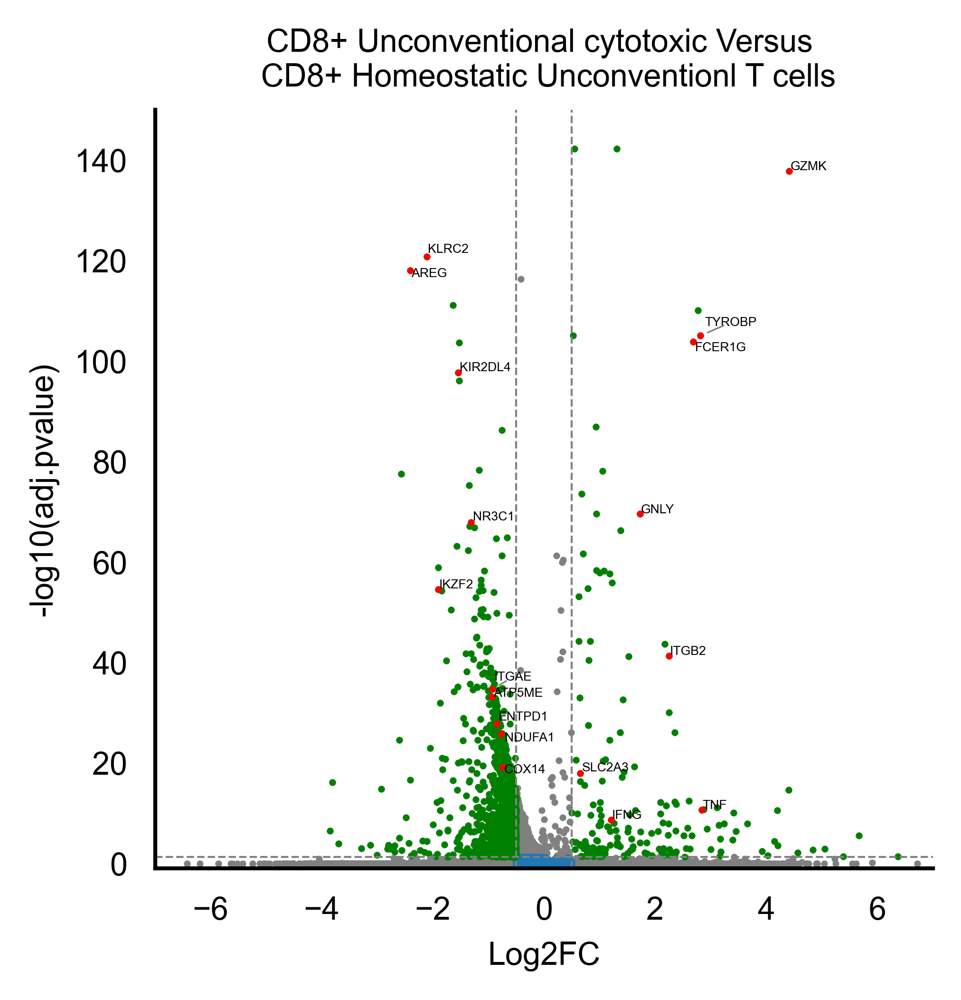

In [53]:
import matplotlib as mpl
# Update your existing rcParams
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3)
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

crit_pval = 0.05
crit_l2fc = 0.5

nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

marker_intersect = np.intersect1d(sig_degs_df['names'], additional_genes)


fig, ax = plt.subplots(figsize=(3.5,3.5), dpi=300)
ax.scatter(degs_df['logfoldchanges'], 
            degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), c='gray',
            s=0.5)
ax.scatter(nonsig_degs_df['logfoldchanges'], 
            nonsig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            s=0.5)
ax.scatter(sig_degs_df['logfoldchanges'], 
            sig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            c='g',
            s=0.5)
ax.scatter(sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges'],
            sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj'].apply(lambda x: -np.log10(x)),
            c='r',
            s=0.5)

ax.axvline(x=crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axvline(x=-crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=-np.log10(crit_pval), c='gray', linestyle='--', linewidth=0.5)

oxphos_lfcs = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges']
oxphos_pvals = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj']
oxphos_genes = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['names']

ax.set_xlim(-7, 7)  # Adjust these limits as needed
ax.set_ylim(-1, 150)  # Adjust these limits as needed

from adjustText import adjust_text
texts = []
for lfc, pval, gene in zip(oxphos_lfcs, oxphos_pvals, oxphos_genes):
    # Create text objects with exact coordinates of the point
    texts.append(ax.text(lfc, -np.log10(pval), gene, fontsize=3.2))
    
# Adjust text positions with improved parameters
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color='gray', lw=0.4),
            expand_points=(1.5, 1.5),  # Increase space between points and text
            force_points=(0.5, 0.5),   # Force strength for point-text repulsion
            force_text=(0.5, 0.5),     # Force strength for text-text repulsion
            precision=0.001)           # Higher precision for positioning
         
ax.set_xlabel('Log2FC', fontsize=8)  # Adjust fontsize as needed
ax.set_ylabel('-log10(adj.pvalue)', fontsize=8)  # Adjust fontsize as needed
ax.set_title('CD8+ Unconventional cytotoxic Versus \n CD8+ Homeostatic Unconventionl T cells', fontsize=8)
ax.spines[['right', 'top']].set_visible(False)

fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.png', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.pdf', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.svg', dpi=300, bbox_inches='tight', transparent=False)
plt.show()

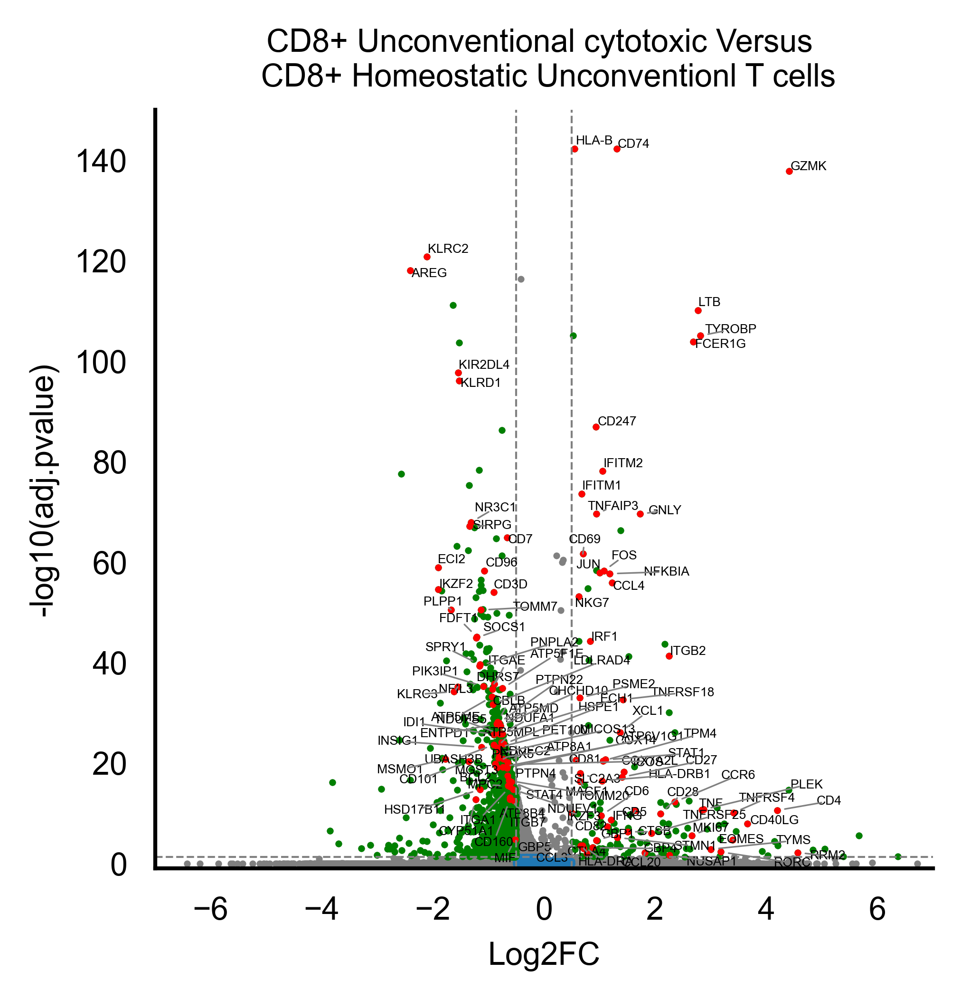

In [54]:
import matplotlib as mpl
# Update your existing rcParams
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3)
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

crit_pval = 0.05
crit_l2fc = 0.5

nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

marker_intersect = np.intersect1d(sig_degs_df['names'], final_genes)


fig, ax = plt.subplots(figsize=(3.5,3.5), dpi=300)
ax.scatter(degs_df['logfoldchanges'], 
            degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), c='gray',
            s=0.5)
ax.scatter(nonsig_degs_df['logfoldchanges'], 
            nonsig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            s=0.5)
ax.scatter(sig_degs_df['logfoldchanges'], 
            sig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            c='g',
            s=0.5)
ax.scatter(sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges'],
            sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj'].apply(lambda x: -np.log10(x)),
            c='r',
            s=0.5)

ax.axvline(x=crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axvline(x=-crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=-np.log10(crit_pval), c='gray', linestyle='--', linewidth=0.5)

oxphos_lfcs = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges']
oxphos_pvals = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj']
oxphos_genes = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['names']

ax.set_xlim(-7, 7)  # Adjust these limits as needed
ax.set_ylim(-1, 150)  # Adjust these limits as needed

from adjustText import adjust_text
texts = []
for lfc, pval, gene in zip(oxphos_lfcs, oxphos_pvals, oxphos_genes):
    # Create text objects with exact coordinates of the point
    texts.append(ax.text(lfc, -np.log10(pval), gene, fontsize=3.2))
    
# Adjust text positions with improved parameters
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color='gray', lw=0.4),
            expand_points=(1.5, 1.5),  # Increase space between points and text
            force_points=(0.5, 0.5),   # Force strength for point-text repulsion
            force_text=(0.5, 0.5),     # Force strength for text-text repulsion
            precision=0.001)           # Higher precision for positioning
         
ax.set_xlabel('Log2FC', fontsize=8)  # Adjust fontsize as needed
ax.set_ylabel('-log10(adj.pvalue)', fontsize=8)  # Adjust fontsize as needed
ax.set_title('CD8+ Unconventional cytotoxic Versus \n CD8+ Homeostatic Unconventionl T cells', fontsize=8)
ax.spines[['right', 'top']].set_visible(False)

fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.png', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.pdf', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'unconventional_gene_sig_volvcano.svg', dpi=300, bbox_inches='tight', transparent=False)
plt.show()

# Treg analysis

In [55]:
Treg_cells= tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets']=='CD4+ regulatory T cells']
Treg_cells

View of AnnData object with n_obs × n_vars = 1795 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy'
    var: 'highly_variable', 'highly_variable_rank', 'mean

In [56]:
sc.tl.rank_genes_groups(Treg_cells, groupby='GVHD_Grade_1', use_raw=False, method='wilcoxon')
degs_df = sc.get.rank_genes_groups_df(Treg_cells, group=None)
degs_df.to_csv(PROJECT_ROOT / 'adata_file' / 'Treg_GVHD_Grade.csv')

In [49]:
# Severe vs rest
Treg_cells.obs['Grade_Svsall'] = "Non-severe"
Treg_cells.obs.loc[Treg_cells.obs['GVHD_Grade_1']== "Severe",'Grade_Svsall']= "Severe"

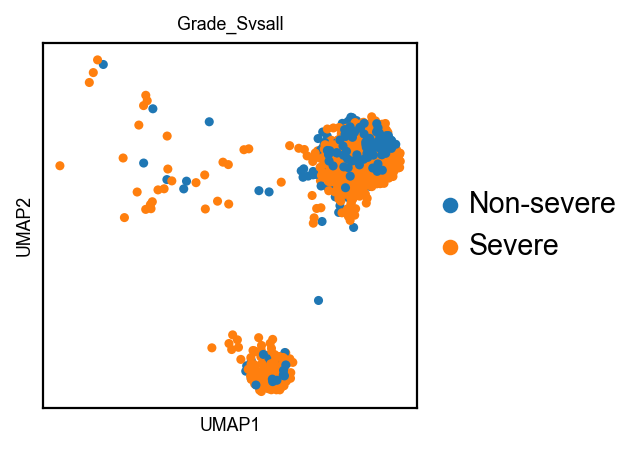

In [50]:
sc.pl.umap(Treg_cells, color='Grade_Svsall')

In [51]:
sc.tl.rank_genes_groups(Treg_cells, groupby='Grade_Svsall', use_raw=False, method='wilcoxon')
degs_df = sc.get.rank_genes_groups_df(Treg_cells, group=None)
degs_df.to_csv(PROJECT_ROOT / 'adata_file' / 'Treg_SeverevsRest.csv')

In [52]:
degs_df = sc.get.rank_genes_groups_df(Treg_cells, group='Severe')

In [53]:
degs_df = degs_df.loc[np.abs(degs_df.logfoldchanges) < 10]

In [55]:
gene_categories = {
    "Canonical_Treg_genes": ["FOXP3", "IKZF2", "IL2R", "CTLA4"],
    
    "OxPhos": ["COX4I1", "COX5B", "COX6A1", "COX6B1", "COX7A2", "COX7C", 
               "NDUFS5", "UQCRB", "ATP5F1E", "ATP5MG", "ATP5MC2"],
    
    "TCR_components": ["CD3E", "TRBC2"],
    
    "MHC_components": ["HLA-A", "HLA-B", "HLA-C", "B2M", "HLA-DQB1", "CD74"],
    
    "Cytokine_receptors": ["IL1R1", "IL18R1", "IL6ST", "IL2RA", "IL2RB", "IL2RG"],
    
    "Interferon_stimulated_genes": ["GBP1", "GBP2", "IRF1", "IRF9"],
    
    "Chemokine_receptors": ["CCR4", "CCR6", "CXCR6", "CCR8"],
    
    "JAK_STAT": ["JAK1", "STAT1", "STAT3", "STAT5"],
    
    "Costimulatory": ["LAG3", "ICOS", "TNFRSF9", "TNFRSF1B"],
    
    "Other_transcription_factors": ["IKZF1", "ID2", "FOXO1", "KLF13"],
    "Cytotoxic Treg": ['PRF1','GZMA','GZMB','CCL4','IL2RA','IL2RG','IL2RB','FOXP3','GBP2', 'GBP5','IL6ST','STAT3','JAK1','LAG3','IKZF1','CTLA4'],
    "Other" : ["BATF"]
    
}

# If you want a flat list of all genes
all_genes = [gene for category in gene_categories.values() for gene in category]

# Print all genes
print(all_genes)

['FOXP3', 'IKZF2', 'IL2R', 'CTLA4', 'COX4I1', 'COX5B', 'COX6A1', 'COX6B1', 'COX7A2', 'COX7C', 'NDUFS5', 'UQCRB', 'ATP5F1E', 'ATP5MG', 'ATP5MC2', 'CD3E', 'TRBC2', 'HLA-A', 'HLA-B', 'HLA-C', 'B2M', 'HLA-DQB1', 'CD74', 'IL1R1', 'IL18R1', 'IL6ST', 'IL2RA', 'IL2RB', 'IL2RG', 'GBP1', 'GBP2', 'IRF1', 'IRF9', 'CCR4', 'CCR6', 'CXCR6', 'CCR8', 'JAK1', 'STAT1', 'STAT3', 'STAT5', 'LAG3', 'ICOS', 'TNFRSF9', 'TNFRSF1B', 'IKZF1', 'ID2', 'FOXO1', 'KLF13', 'PRF1', 'GZMA', 'GZMB', 'CCL4', 'IL2RA', 'IL2RG', 'IL2RB', 'FOXP3', 'GBP2', 'GBP5', 'IL6ST', 'STAT3', 'JAK1', 'LAG3', 'IKZF1', 'CTLA4', 'BATF']


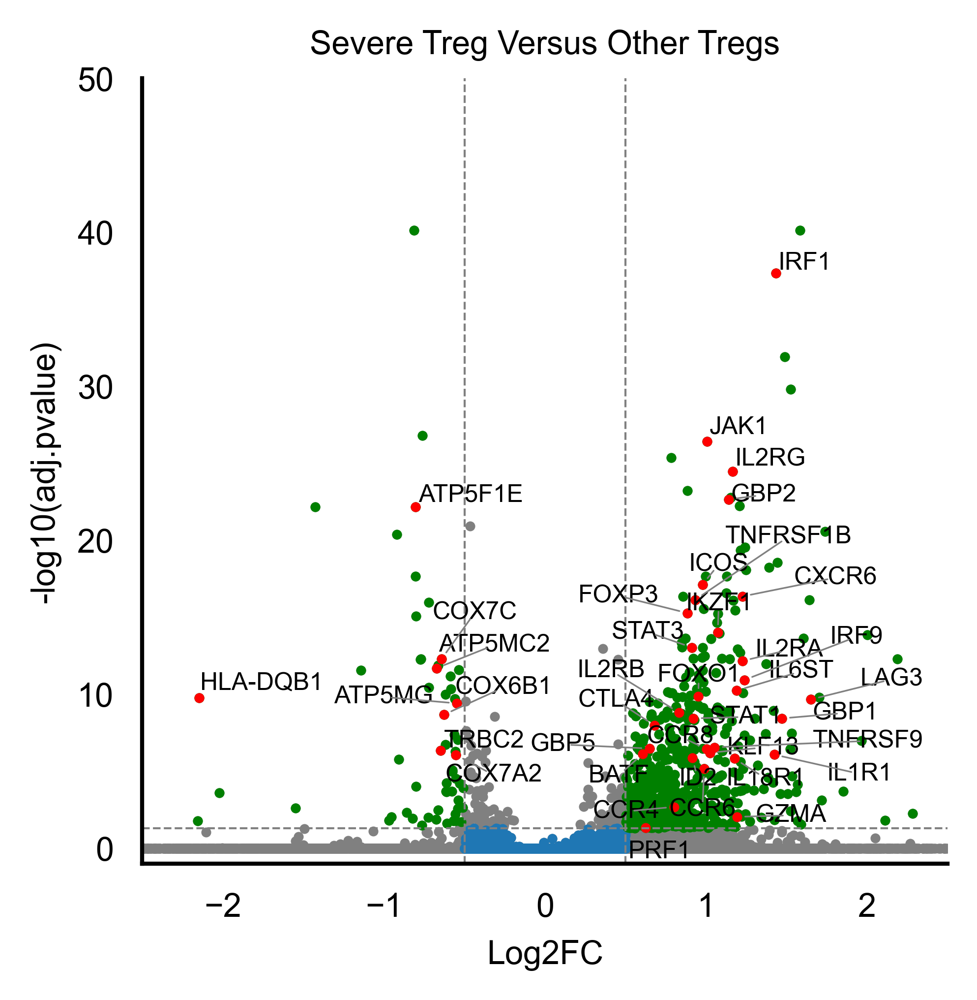

In [56]:
import matplotlib as mpl
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3),  # Set default figure size to 3×3 inches
    'lines.linewidth': 1  # Set default line width to 1
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

crit_pval = 0.05
crit_l2fc = 0.5
nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]
marker_intersect = np.intersect1d(sig_degs_df['names'], all_genes)

fig, ax = plt.subplots(figsize=(3.5,3.5), dpi=300)
ax.scatter(degs_df['logfoldchanges'], 
            degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), c='gray',
            s=2)
ax.scatter(nonsig_degs_df['logfoldchanges'], 
            nonsig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            s=2)
ax.scatter(sig_degs_df['logfoldchanges'], 
            sig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            c='g',
            s=2)
ax.scatter(sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges'],
            sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj'].apply(lambda x: -np.log10(x)),
            c='r',
            s=2)

ax.axvline(x=crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axvline(x=-crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=-np.log10(crit_pval), c='gray', linestyle='--', linewidth=0.5)

oxphos_lfcs = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges']
oxphos_pvals = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj']
oxphos_genes = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['names']

ax.set_xlim(-2.5, 2.5)  # Adjust these limits as needed
ax.set_ylim(-1, 50)  # Adjust these limits as needed

from adjustText import adjust_text
texts = []
for lfc, pval, gene in zip(oxphos_lfcs, oxphos_pvals, oxphos_genes):
    # Create text objects with exact coordinates of the point
    texts.append(ax.text(lfc, -np.log10(pval), gene, fontsize=6))
    
# Adjust text positions with improved parameters
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color='gray', lw=0.4),
            expand_points=(1.5, 1.5),  # Increase space between points and text
            force_points=(0.5, 0.5),   # Force strength for point-text repulsion
            force_text=(0.5, 0.5),     # Force strength for text-text repulsion
            precision=0.001)           # Higher precision for positioning
         
ax.set_xlabel('Log2FC', fontsize=8)  # Adjust fontsize as needed
ax.set_ylabel('-log10(adj.pvalue)', fontsize=8)  # Adjust fontsize as needed
ax.set_title('Severe Treg Versus Other Tregs', fontsize=8)
ax.spines[['right', 'top']].set_visible(False)

fig.savefig(FIGURES_SC_DIR / 'Treg_cytolytic_gene_sig_volvcano.png', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'Treg_cytolytic_gene_sig_volvcano.pdf', dpi=300, bbox_inches='tight', transparent=False)
fig.savefig(FIGURES_SC_DIR / 'Treg_cytolytic_gene_sig_volvcano.svg', dpi=300, bbox_inches='tight', transparent=False)
plt.show()

# CD4+ T cells analysis

In [121]:
tcell_ann_cd4= tcell_ann_concat_f[tcell_ann_concat_f.obs['T_cell_subsets'].isin(['CD4+ regulatory T cells','CD4+ central memory T cells','CD4+ effector T cells'])]

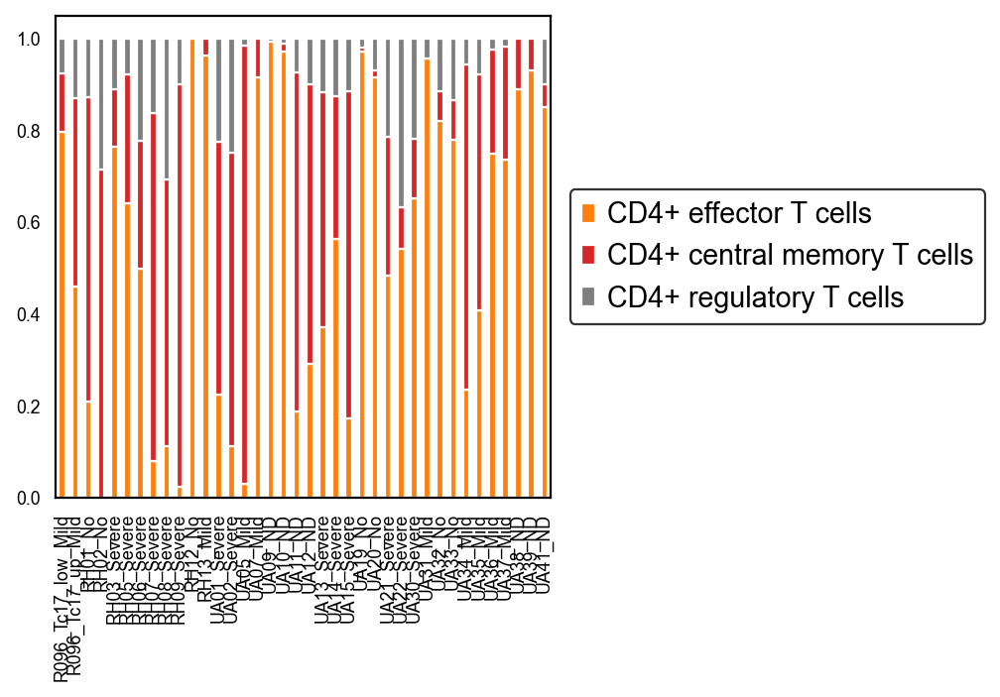

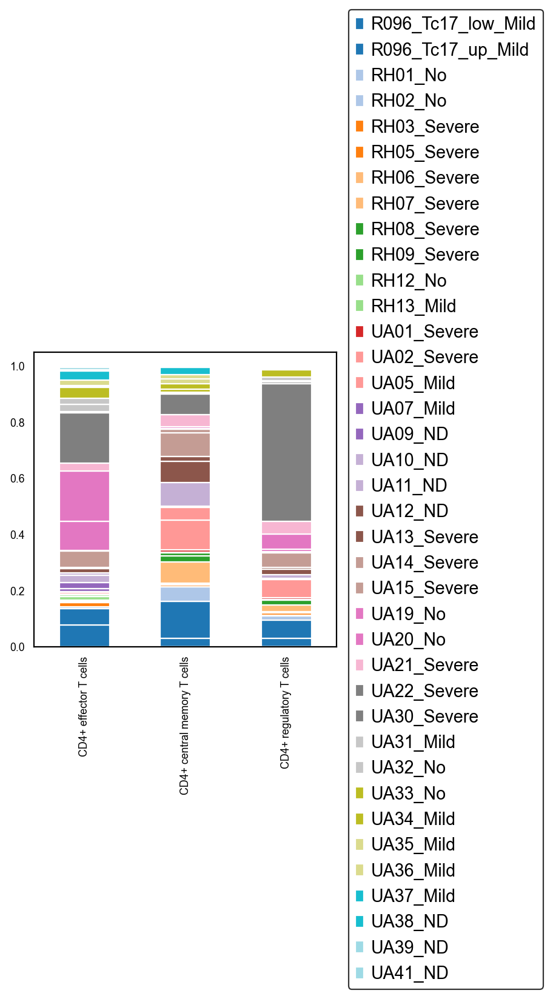

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.161e-01
mild vs. severe: Custom statistical test, P_val:4.161e-01
no vs. severe: Custom statistical test, P_val:5.385e-02
Raw p-values: [0.2531227789726491, 0.017950898483616452, 0.20806244620945058]
Holm-corrected p-values: [0.41612489 0.0538527  0.41612489]
('no', 'mild'): corrected p = 0.416125 (not significant)
('no', 'severe'): corrected p = 0.053853 (not significant)
('mild', 'severe'): corrected p = 0.416125 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


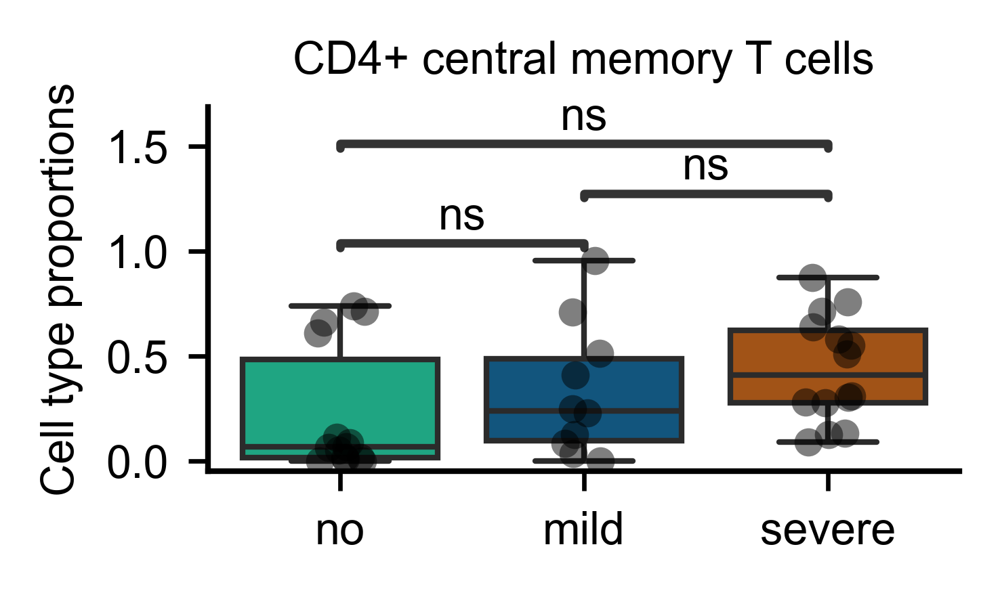

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:3.340e-01
mild vs. severe: Custom statistical test, P_val:1.141e-01
no vs. severe: Custom statistical test, P_val:2.473e-02
Raw p-values: [0.3339735948493513, 0.008242009906200226, 0.057039874249055496]
Holm-corrected p-values: [0.33397359 0.02472603 0.11407975]
('no', 'mild'): corrected p = 0.333974 (not significant)
('no', 'severe'): corrected p = 0.024726 (significant)
('mild', 'severe'): corrected p = 0.114080 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


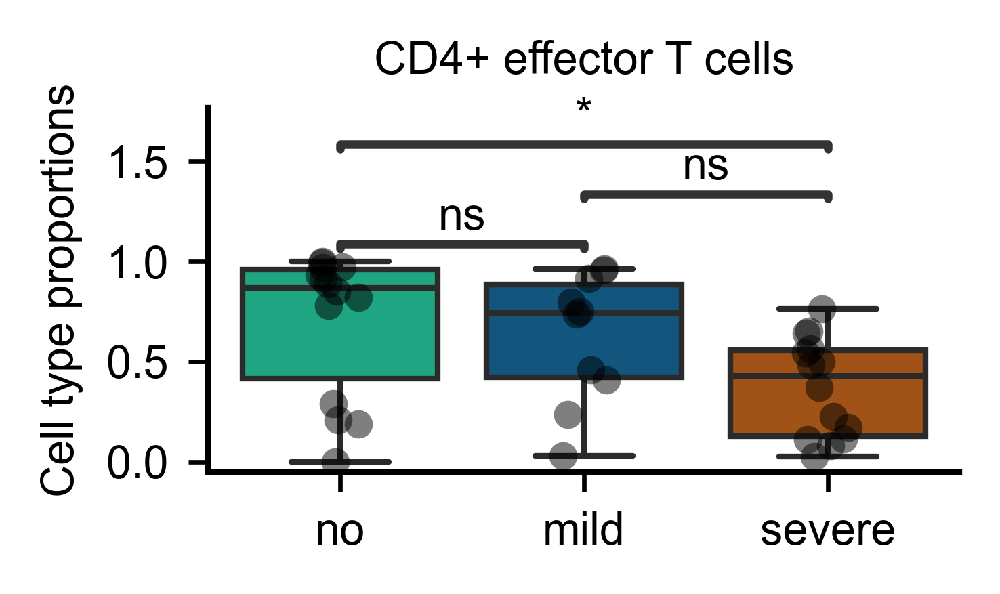

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:5.369e-01
mild vs. severe: Custom statistical test, P_val:7.554e-04
no vs. severe: Custom statistical test, P_val:3.537e-03
Raw p-values: [0.5368998880321929, 0.0017685110120995982, 0.00025180107985550964]
Holm-corrected p-values: [0.53689989 0.00353702 0.0007554 ]
('no', 'mild'): corrected p = 0.536900 (not significant)
('no', 'severe'): corrected p = 0.003537 (significant)
('mild', 'severe'): corrected p = 0.000755 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


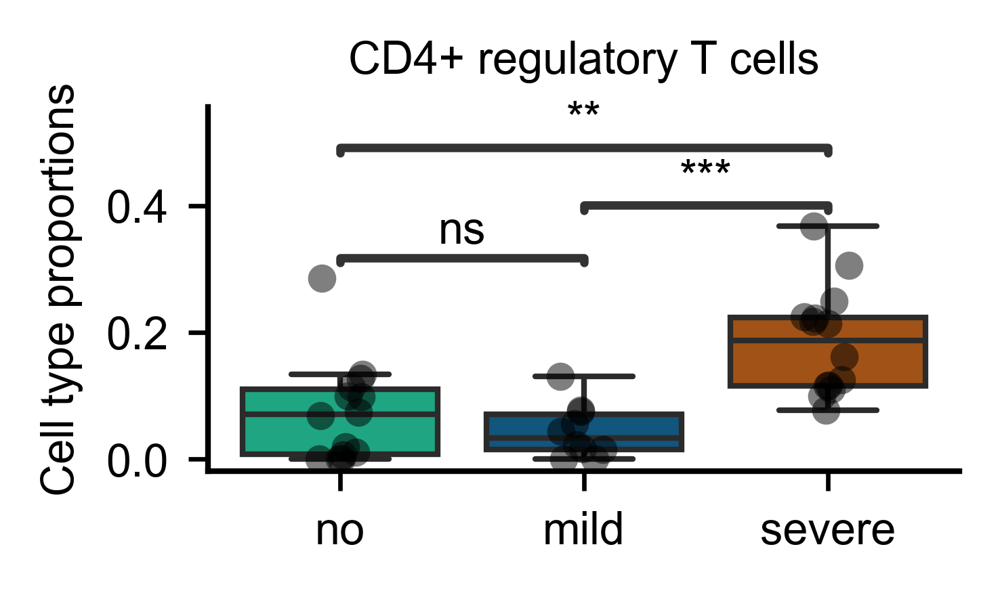

In [122]:
sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1
mpl.rcParams['axes.grid'] = False
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8

obs_1 = 'SampleID_Grade'
obs_2 = 'T_cell_subsets'

for adata in [tcell_ann_cd4]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    tcell_colors = [celltype_colors[c] for c in obs2_clusters]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    for cell_type in adata.obs['T_cell_subsets'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[cell_type].values[
            ~np.isnan(selected_columns_severe.loc[cell_type].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[cell_type].values[
            ~np.isnan(selected_columns_mild.loc[cell_type].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[cell_type].values[
            ~np.isnan(selected_columns_no.loc[cell_type].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[cell_type].values[
            ~np.isnan(selected_columns_treated.loc[cell_type].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[cell_type].values[
            ~np.isnan(selected_columns_nd.loc[cell_type].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(cell_type)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw Mann-Whitney p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value',
                              order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        plt.tight_layout()

        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        cell_type_safe = cell_type.replace(' ', '_').replace('+', 'pos').replace('/', '-')
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_cd4_boxplot_300dpi.png',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_cd4_boxplot_300dpi.pdf',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_cd4_boxplot_300dpi.svg',
                    dpi=300, transparent=True)
        plt.show()

In [123]:
tcell_ann_IE = tcell_ann_cd4[tcell_ann_cd4.obs["LPorIE"]== 'Intraepithelial Cells']
tcell_ann_LP = tcell_ann_cd4[tcell_ann_cd4.obs["LPorIE"]== 'Lamina Propria Cells']

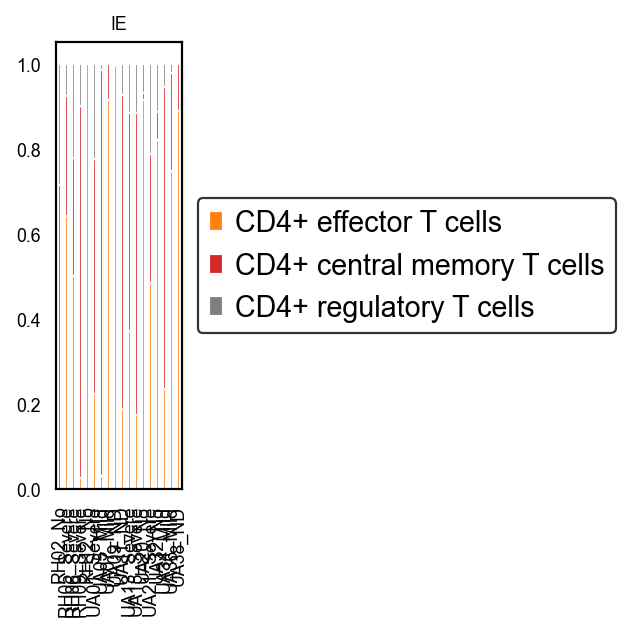

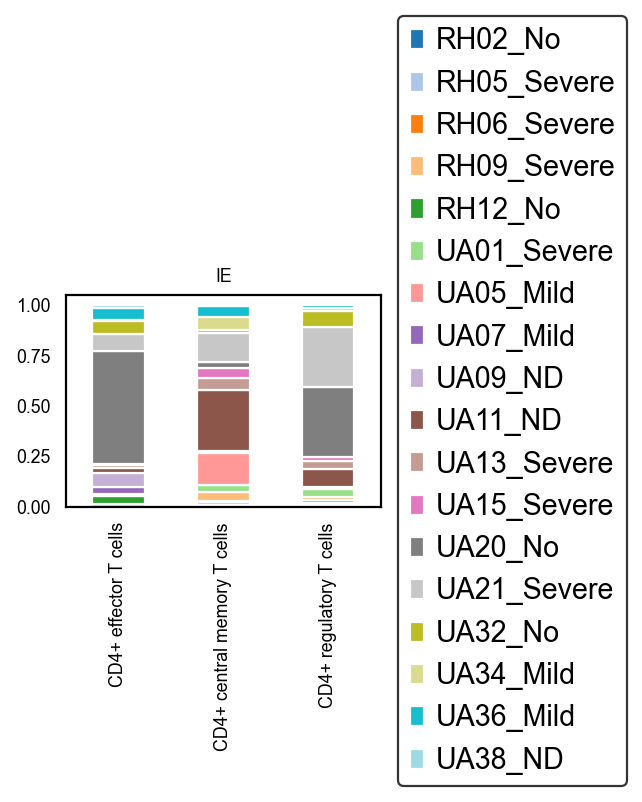

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:5.044e-01
mild vs. severe: Custom statistical test, P_val:1.818e-02
no vs. severe: Custom statistical test, P_val:1.100e-01

IE - CD4+ regulatory T cells
Raw p-values: [0.504430998762287, 0.055017327657758984, 0.006060606060606061]
Holm-corrected p-values: [0.504431   0.11003466 0.01818182]
('no', 'mild'): corrected p = 0.504431 (not significant)
('no', 'severe'): corrected p = 0.110035 (not significant)
('mild', 'severe'): corrected p = 0.018182 (significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


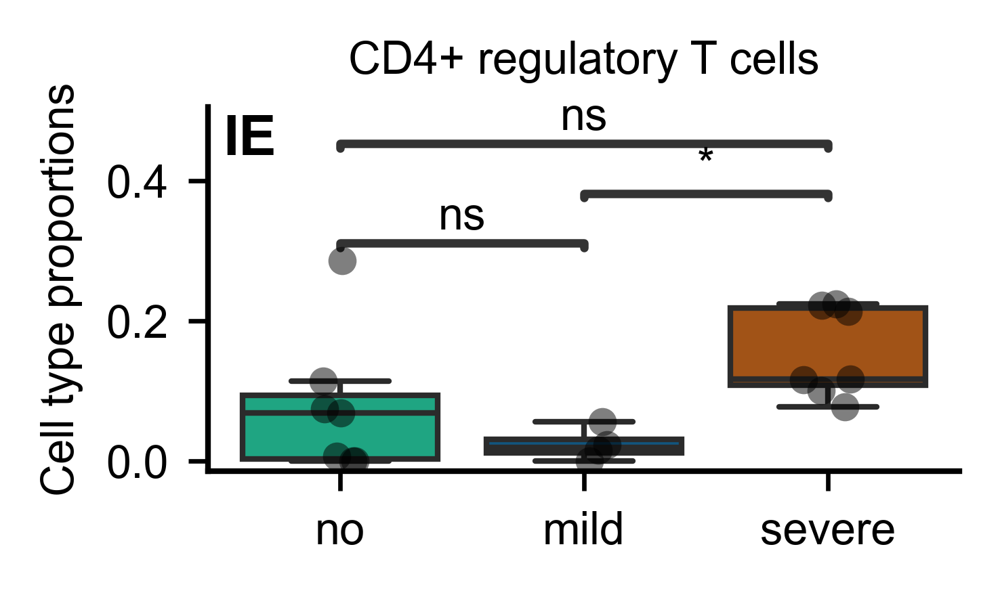

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:4.365e-01
mild vs. severe: Custom statistical test, P_val:7.879e-01
no vs. severe: Custom statistical test, P_val:3.744e-01

IE - CD4+ central memory T cells
Raw p-values: [0.2182533534553157, 0.12478591898856299, 0.7878787878787878]
Holm-corrected p-values: [0.43650671 0.37435776 0.78787879]
('no', 'mild'): corrected p = 0.436507 (not significant)
('no', 'severe'): corrected p = 0.374358 (not significant)
('mild', 'severe'): corrected p = 0.787879 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


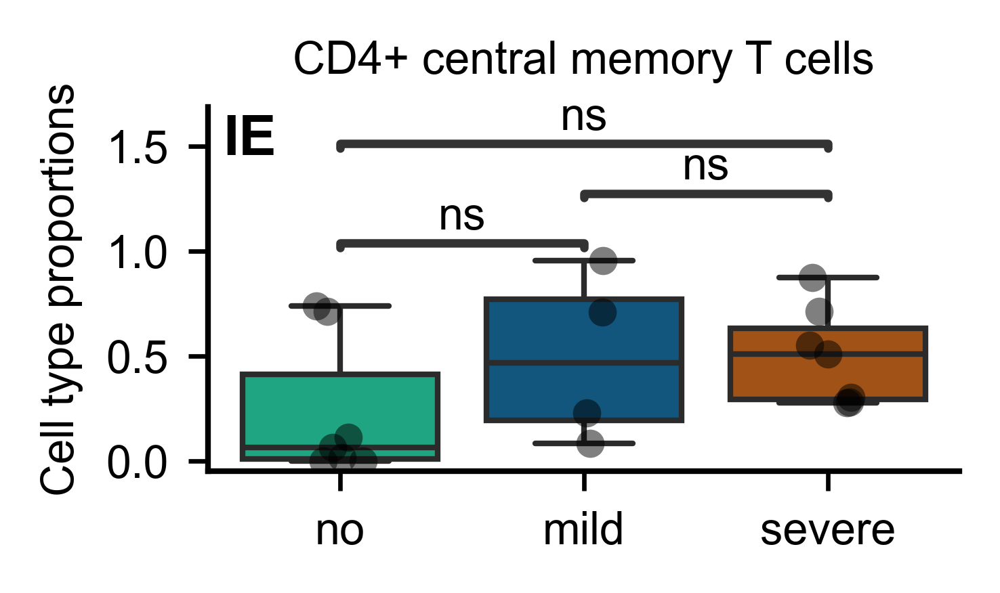

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:8.242e-01
mild vs. severe: Custom statistical test, P_val:8.242e-01
no vs. severe: Custom statistical test, P_val:3.846e-01

IE - CD4+ effector T cells
Raw p-values: [0.4121212121212121, 0.12820512820512822, 0.5272727272727272]
Holm-corrected p-values: [0.82424242 0.38461538 0.82424242]
('no', 'mild'): corrected p = 0.824242 (not significant)
('no', 'severe'): corrected p = 0.384615 (not significant)
('mild', 'severe'): corrected p = 0.824242 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      4
Name: count, dtype: int64


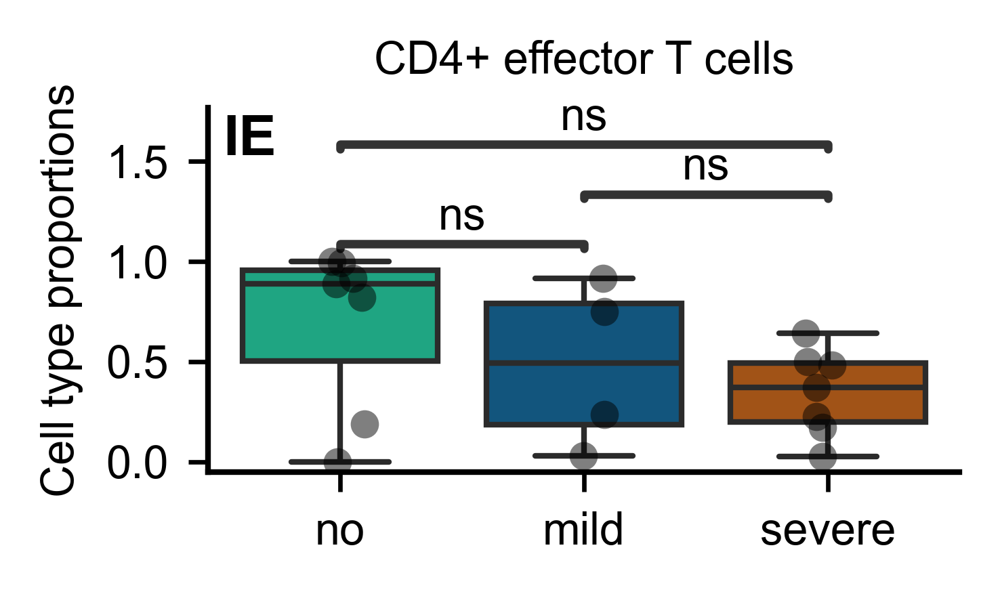

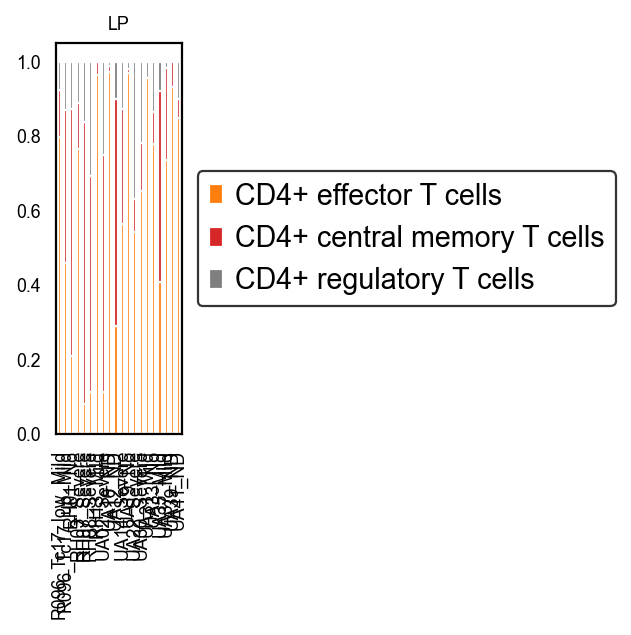

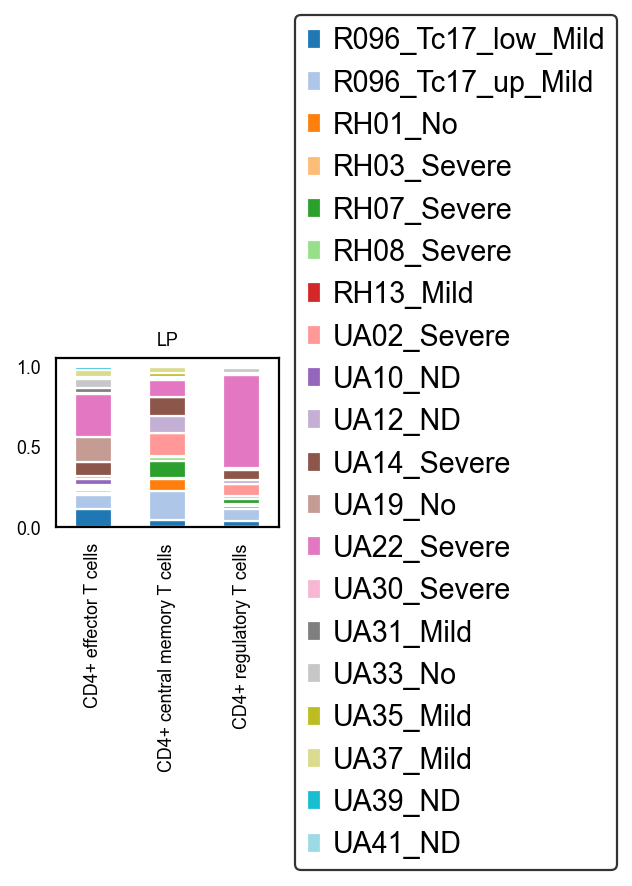

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:9.452e-01
mild vs. severe: Custom statistical test, P_val:5.897e-01
no vs. severe: Custom statistical test, P_val:2.920e-01

LP - CD4+ central memory T cells
Raw p-values: [0.9452214452214451, 0.09731934731934733, 0.2948717948717949]
Holm-corrected p-values: [0.94522145 0.29195804 0.58974359]
('no', 'mild'): corrected p = 0.945221 (not significant)
('no', 'severe'): corrected p = 0.291958 (not significant)
('mild', 'severe'): corrected p = 0.589744 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


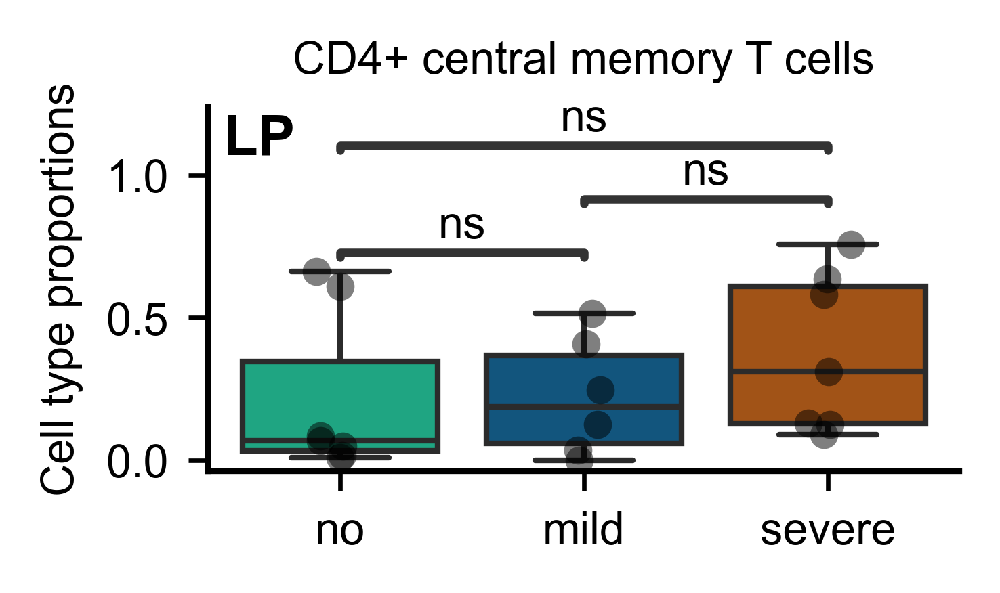

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:8.357e-01
mild vs. severe: Custom statistical test, P_val:2.028e-01
no vs. severe: Custom statistical test, P_val:1.136e-01

LP - CD4+ effector T cells
Raw p-values: [0.8356643356643356, 0.03787878787878788, 0.10139860139860139]
Holm-corrected p-values: [0.83566434 0.11363636 0.2027972 ]
('no', 'mild'): corrected p = 0.835664 (not significant)
('no', 'severe'): corrected p = 0.113636 (not significant)
('mild', 'severe'): corrected p = 0.202797 (not significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


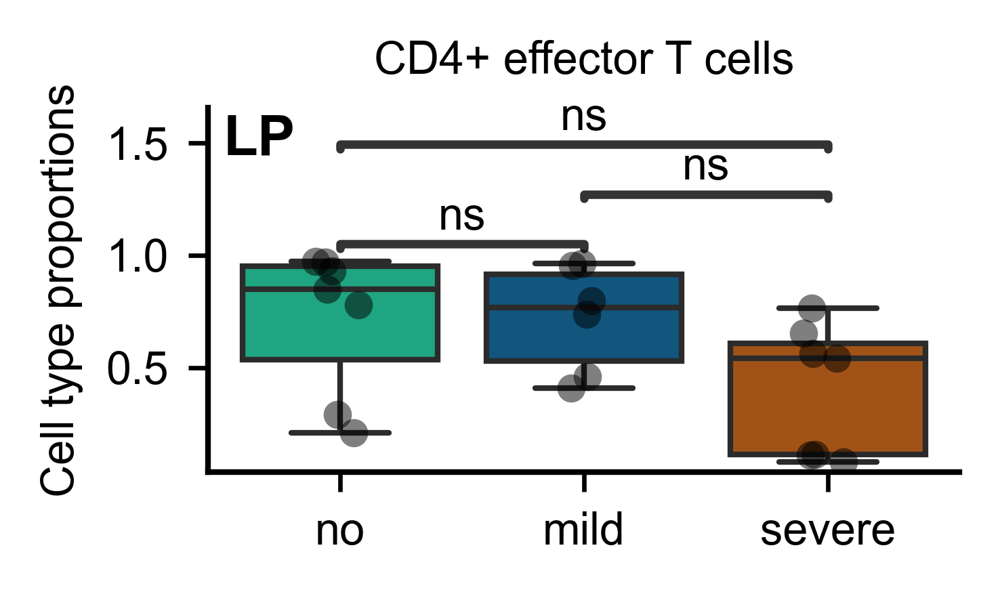

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:6.678e-01
mild vs. severe: Custom statistical test, P_val:1.399e-02
no vs. severe: Custom statistical test, P_val:1.399e-02

LP - CD4+ regulatory T cells
Raw p-values: [0.6678058142504256, 0.006993006993006993, 0.004662004662004662]
Holm-corrected p-values: [0.66780581 0.01398601 0.01398601]
('no', 'mild'): corrected p = 0.667806 (not significant)
('no', 'severe'): corrected p = 0.013986 (significant)
('mild', 'severe'): corrected p = 0.013986 (significant)
Number of samples per condition:
Grade
no        7
severe    7
mild      6
Name: count, dtype: int64


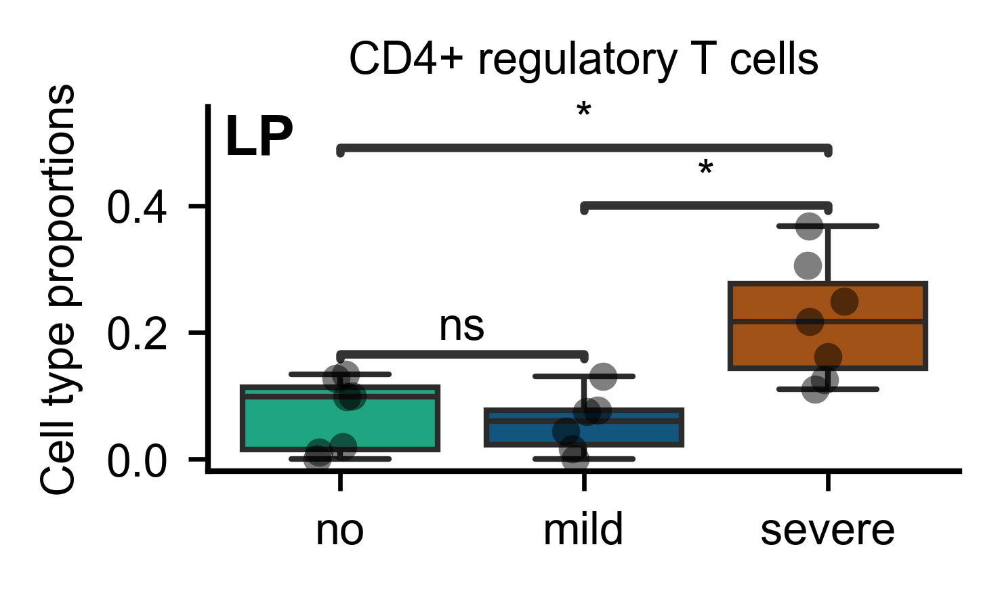

In [124]:
obs_1 = 'SampleID_Grade'
obs_2 = 'T_cell_subsets'

for tissue, adata in [('IE', tcell_ann_IE), ('LP', tcell_ann_LP)]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    tcell_colors = [celltype_colors[c] for c in obs2_clusters]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    ax = df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.title(f'{tissue}')
    plt.tight_layout()
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    ax = df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.title(f'{tissue}')
    plt.tight_layout()
    plt.show()

    for cell_type in adata.obs['T_cell_subsets'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[cell_type].values[
            ~np.isnan(selected_columns_severe.loc[cell_type].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[cell_type].values[
            ~np.isnan(selected_columns_mild.loc[cell_type].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[cell_type].values[
            ~np.isnan(selected_columns_no.loc[cell_type].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[cell_type].values[
            ~np.isnan(selected_columns_treated.loc[cell_type].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[cell_type].values[
            ~np.isnan(selected_columns_nd.loc[cell_type].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(cell_type)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()
        ax.text(0.02, 0.98, tissue, transform=ax.transAxes,
                ha='left', va='top', fontsize=10, fontweight='bold')

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw Mann-Whitney p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value',
                              order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        plt.tight_layout()

        print(f"\n{tissue} - {cell_type}")
        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        cell_type_safe = cell_type.replace(' ', '_').replace('+', 'pos').replace('/', '-')
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_cd4_boxplot_300dpi.png',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_cd4_boxplot_300dpi.pdf',
                    dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{tissue}_{cell_type_safe}_cd4_boxplot_300dpi.svg',
                    dpi=300, transparent=True)
        plt.show()

In [125]:
gut_treg_tissue_repair_broad = [ 'FOXP3','IL2RA',
    "AREG",
    "IL1RL1",   # ST2
    "GATA3",
    "KLRG1",
    "IL10",
    "TGFB1",
    "ICOS",
    "BATF",
    "IRF4",
    "IKZF2",    # Helios
    "NRP1",
    "CCR8",
    "PDCD1",
    "CD83",
    "FGF7",
    'CSF1'
]

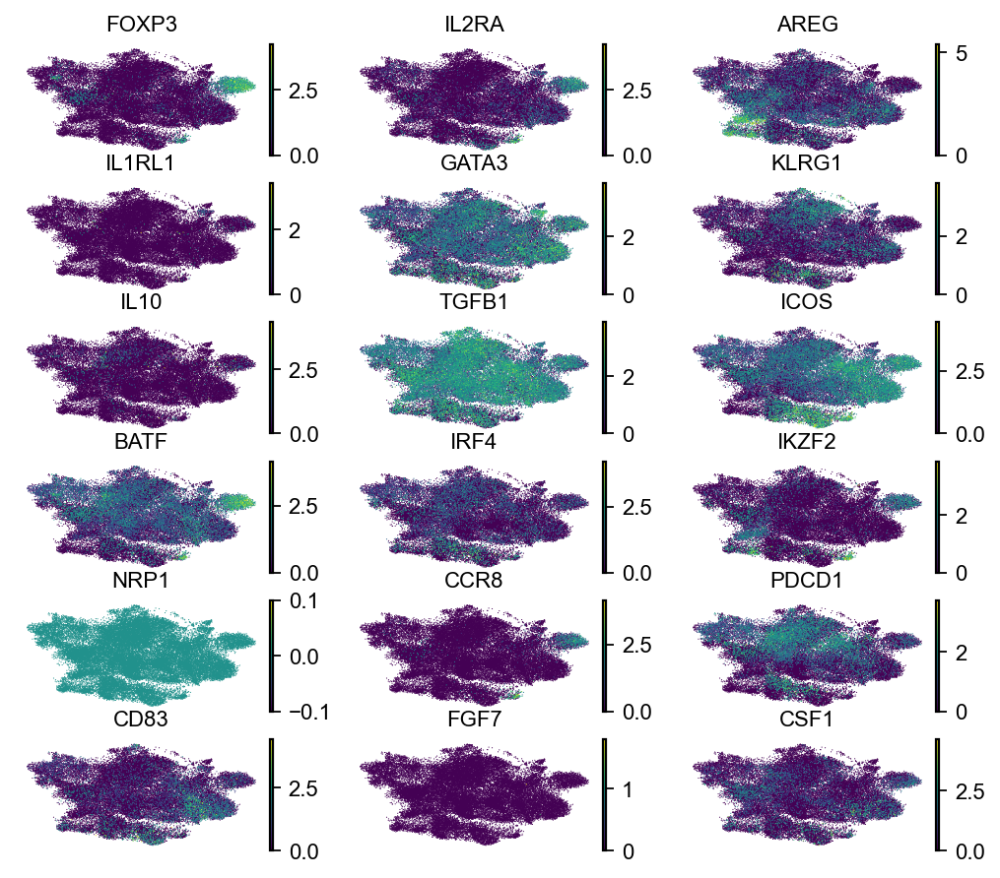

In [126]:
mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
fig = sc.pl.umap(tcell_ann_concat, 
           color=gut_treg_tissue_repair_broad,
           ncols=3,
           show=False,
           frameon=False,
           return_fig=True,
           size=1)

fig.set_size_inches(7.5, 6)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "gut_treg_tissue_repair_genes.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "gut_treg_tissue_repair_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "gut_treg_tissue_repair_genes.svg", dpi=300, bbox_inches='tight')
plt.show()

In [127]:
tcell_ann_concat.write(TCELL_ANN_ANNOTATED_PATH)